# Ансамблі, композиції

---
<a name="0"/>

### Зміст:

* 1. [Імпорт даних](#1)
* 2. [Первинний аналіз](#2)
* 3. [Фіча інжинірінг](#3)
* 4. [Маштабування фіч](#4)
* 5. [Поділ датасету на train, test](#5)
* 6. Тренування базової моделі(гіперпараметри=дефолтні)
     * 6.1. Bagging]
        * 6.1.1. [Random Forest](#6.1.1)
        * 6.1.2. [kNN](#6.1.2)
        * 6.1.3. [SVC](#6.1.3)
     * 6.2. Boosting
        * 6.2.1. [XGBoost](#6.2.1)
        * 6.2.2. [CatBoost](#6.2.2)
        * 6.2.3. [Light GBM](#6.2.3)
     * 6.3. Stacking
        * 6.3.1. [StackingClassifier](#6.3.1)
* 7. Підбір гіперпараметрів
     * 7.1. Bagging
        * 7.1.1. [Random Forest](#7.1.1)
        * 7.1.2. [kNN](#7.1.2)
        * 7.1.3. [SVC](#7.1.3)
     * 7.2. Boosting
        * 7.2.1. [XGBoost](#7.2.1)
        * 7.2.2. [CatBoost](#7.2.2)
        * 7.2.3. [Light GBM](#7.2.3)
     * 7.3. Stacking
        * 7.3.1. [StackingClassifier](#7.3.1)
* 8. Оцінка результатів
     * 8.1. [Classification reports](#8.1)
     * 8.2. [Висновок](#8.2)


---
Інсталяція бібліотек

In [3]:
! pip install catboost lightgbm scikit-plot xgboost

  Obtaining dependency information for xgboost from https://files.pythonhosted.org/packages/75/dd/9afe0d9d0f61a5384c3932626a022e38c396a5d88e6f5345ad2f7b576747/xgboost-1.7.6-py3-none-win_amd64.whl.metadata
   ---------------------------------------- 0.0/70.9 MB ? eta -:--:--
   ---------------------------------------- 0.1/70.9 MB 1.1 MB/s eta 0:01:06
   ---------------------------------------- 0.2/70.9 MB 2.3 MB/s eta 0:00:31
   ---------------------------------------- 0.5/70.9 MB 3.5 MB/s eta 0:00:21
   ---------------------------------------- 0.7/70.9 MB 4.2 MB/s eta 0:00:17
    --------------------------------------- 1.3/70.9 MB 5.4 MB/s eta 0:00:13
    --------------------------------------- 1.6/70.9 MB 5.5 MB/s eta 0:00:13
    --------------------------------------- 1.7/70.9 MB 5.0 MB/s eta 0:00:14
   - -------------------------------------- 2.7/70.9 MB 6.8 MB/s eta 0:00:11
   - -------------------------------------- 3.1/70.9 MB 7.3 MB/s eta 0:00:10
   - ---------------------------

---
Імпортування бібліотек

In [4]:
import pandas as pd
import numpy as np
import warnings
import matplotlib.pyplot as plt
import seaborn as sns

from io import BytesIO
from zipfile import ZipFile
from urllib.request import urlopen

from scikitplot.metrics import plot_confusion_matrix

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from sklearn.ensemble import (BaggingClassifier, RandomForestClassifier,
                              StackingClassifier)
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.metrics import classification_report

from xgboost import XGBClassifier # https://xgboost.readthedocs.io/en/latest/python/python_api.html#module-xgboost.sklearn
from catboost import CatBoostClassifier # https://github.com/catboost/tutorials/blob/master/classification/classification_tutorial.ipynb
from lightgbm import LGBMClassifier # https://lightgbm.readthedocs.io/en/stable/pythonapi/lightgbm.LGBMClassifier.html

---
Загальні налаштування

In [5]:
# Налаштуваня візуалізація
sns.set()
%config InlineBackend.figure_format = 'svg'

# Ігнорування помилок при побудові моделі
warnings.filterwarnings("ignore")

---
<a name="1"/>

### 1. Імпорт даних
[зміст](#0)

In [6]:
url = 'https://archive.ics.uci.edu/static/public/713/auction+verification.zip'

In [7]:
resp = urlopen(url)
myzip = ZipFile(BytesIO(resp.read()))
with myzip.open('data.csv') as myfile:
    data = pd.read_csv(myfile, delimiter=',')

In [8]:
data.head()

,process.b1.capacity,process.b2.capacity,process.b3.capacity,process.b4.capacity,property.price,property.product,property.winner,verification.result,verification.time
0,0,0,2,1,59,1,0,False,163.316667
1,0,0,2,1,59,2,0,False,200.860000
2,0,0,2,1,59,4,0,False,154.888889
3,0,0,2,1,59,6,0,False,108.640000
4,0,0,2,1,60,1,0,True,85.466667


Опис датасету:

| Назва фічі    |Опис           |Тип            |
|---            |---            |---
| process.b1.capacity           | об'єм 1             | дискретний
| process.b2.capacity           | об'єм 2             | дискретний
| process.b3.capacity           | об'єм 3             | дискретний
| process.b4.capacity           | об'єм 4            | дискретний
| property.price               | ціна             | дискретний
| property.product               | продукт             | дискретний
| property.winner               | переможець             | дискретний
| verification.result               | результат(target)             | категоріальний
| verification.time               | час             | безперервний



---
<a name="2"/>

### 2. Первинний аналіз
[зміст](#0)

Перевірка дублікатів

In [103]:
data.duplicated().sum()

0

In [10]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2043 entries, 0 to 2042
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   process.b1.capacity  2043 non-null   int64  
 1   process.b2.capacity  2043 non-null   int64  
 2   process.b3.capacity  2043 non-null   int64  
 3   process.b4.capacity  2043 non-null   int64  
 4   property.price       2043 non-null   int64  
 5   property.product     2043 non-null   int64  
 6   property.winner      2043 non-null   int64  
 7   verification.result  2043 non-null   bool   
 8   verification.time    2043 non-null   float64
dtypes: bool(1), float64(1), int64(7)
memory usage: 129.8 KB


In [11]:
data.describe(include='all')

,process.b1.capacity,process.b2.capacity,process.b3.capacity,process.b4.capacity,property.price,property.product,property.winner,verification.result,verification.time
count,2043.000000,2043.000000,2043.000000,2043.000000,2043.000000,2043.000000,2043.000000,2043,2043.000000
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,NaN
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1781,NaN
mean,1.000000,2.093979,1.883994,0.587861,71.473324,3.252080,0.455213,NaN,7336.944574
std,0.816696,0.811269,0.320310,0.492340,8.048740,1.804225,1.062828,NaN,10375.393650
min,0.000000,0.000000,1.000000,0.000000,59.000000,1.000000,0.000000,NaN,77.916667
25%,0.000000,1.000000,2.000000,0.000000,65.000000,2.000000,0.000000,NaN,546.818910
50%,1.000000,2.000000,2.000000,1.000000,70.000000,3.000000,0.000000,NaN,1316.983333
75%,2.000000,3.000000,2.000000,1.000000,78.000000,5.000000,0.000000,NaN,10876.638889


В датасеті відсутні пропуски та дублікати. В `verification.time` відсутні 0.

`verification.result` категоріальна,бінарна, тому замінимо її на бінарну дискретну.

In [12]:
le = LabelEncoder()

data['verification.result'] = le.fit_transform(data['verification.result'])

Замінимо тип даних дискретних фіч на `int16` т.к. максимальне значеня в них 90.

In [13]:
int_features = ['process.b1.capacity', 'process.b2.capacity',
                'process.b3.capacity', 'process.b4.capacity',
                'property.price','property.product','property.winner',
                'verification.result']

for feature in int_features:
    data[feature] = data[feature].astype('int16')

In [14]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2043 entries, 0 to 2042
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   process.b1.capacity  2043 non-null   int16  
 1   process.b2.capacity  2043 non-null   int16  
 2   process.b3.capacity  2043 non-null   int16  
 3   process.b4.capacity  2043 non-null   int16  
 4   property.price       2043 non-null   int16  
 5   property.product     2043 non-null   int16  
 6   property.winner      2043 non-null   int16  
 7   verification.result  2043 non-null   int16  
 8   verification.time    2043 non-null   float64
dtypes: float64(1), int16(8)
memory usage: 48.0 KB


In [15]:
data.head()

,process.b1.capacity,process.b2.capacity,process.b3.capacity,process.b4.capacity,property.price,property.product,property.winner,verification.result,verification.time
0,0,0,2,1,59,1,0,0,163.316667
1,0,0,2,1,59,2,0,0,200.860000
2,0,0,2,1,59,4,0,0,154.888889
3,0,0,2,1,59,6,0,0,108.640000
4,0,0,2,1,60,1,0,1,85.466667


---
<a name="3"/>

### 3. Фіча інжинірінг
[зміст](#0)

Побудуэмо гістограму росподілу фіч.

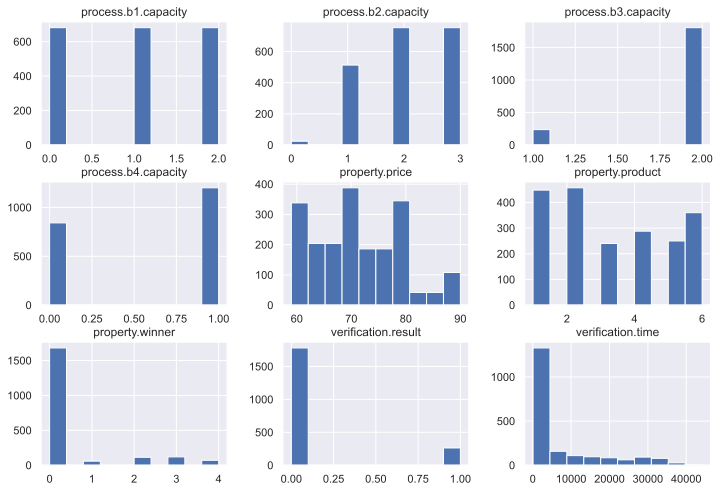

In [16]:
data.hist(figsize=(12, 8));

Так як наші дисктерні фічі мають невелику кількість унікальних значень - ведуть себе на графіку як категоріальні. Росподіл фіч для `process.b1.capacity, process.b4.capacity, property.product, property.price` - близький до сбалансованого. У `process.b2.capacity` - мало 0 значень. `process.b3.capacity, property.winner, verification.result` - сильно виражений дисбаланс. `verification.time` - має сильну асиметрію до 0 значеня, скоріш за все багато значень швиждної (не нульової) веріфікації.

Кореляція фіч

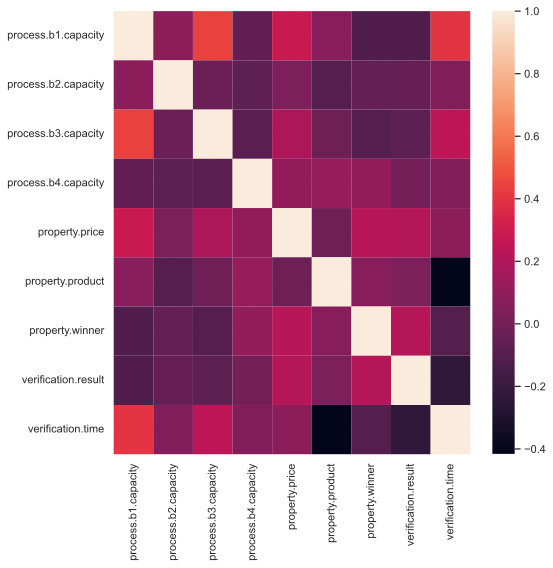

In [17]:
sns.set (rc = {'figure.figsize':(8, 8)})
corr_matrix = data.corr()
sns.heatmap(corr_matrix);

З графіку видно що фічі не сильно коррелюють.

---
<a name="4"/>

### 4. Маштабування фіч
[зміст](#0)

Сплітимо датасет на фічі і таргет

In [18]:
X = data.drop('verification.result', axis=1).values
y = data['verification.result'].copy().values

Хоча для дерев не потрібно маштабувати фічі але в ансамблях будуть не тільни дерева, тому зробимо маштабуваня.

In [19]:
X_scaled = MinMaxScaler().fit_transform(X)

---
<a name="5"/>

### 5. Поділ датасету на train, valid, test
[зміст](#0)

In [20]:
# Функція спліту даних
def data_split_of_parts(X, y, test_size, valid_size=0):
    X_tr_val, X_test, y_tr_val, y_test = train_test_split(X, y, test_size=test_size, random_state=42)
    if valid_size != 0:
        X_train, X_valid, y_train, y_valid = train_test_split(X_tr_val, y_tr_val, test_size=valid_size, random_state=42)
        return X_train, X_valid, X_test, y_train, y_valid, y_test

    else:
        return X_tr_val, X_test, y_tr_val, y_test

In [21]:
X_train, X_valid, X_test, y_train, y_valid, y_test = data_split_of_parts(X_scaled, y, 0.2, 0.3)

---
<a name="6.1.1"/>

### 6. Тренування базової моделі(гіперпараметри=дефолтні)
### 6.1. Bagging
### 6.1.1. Random Forest
[зміст](#0)

In [22]:
clf_Bagging_RFC_default = RandomForestClassifier(max_depth=2, random_state=42).fit(X_train, y_train)

In [23]:
clf_Bagging_RFC_default_pred = clf_Bagging_RFC_default.predict(X_test)

In [24]:
clf_Bagging_RFC_default.score(X_test, y_test)

0.882640586797066

---
<a name="6.1.2"/>

### 6.1.2. kNN
[зміст](#0)

In [25]:
clf_Bagging_kNN_default = BaggingClassifier(estimator=KNeighborsClassifier(), random_state=42).fit(X_train, y_train)

In [26]:
clf_Bagging_kNN_default_pred = clf_Bagging_kNN_default.predict(X_test)

In [27]:
clf_Bagging_kNN_default.score(X_test, y_test)

0.863080684596577

---
<a name="6.1.3"/>

### 6.1.3. SVC
[зміст](#0)

In [28]:
clf_Bagging_SVC_default = BaggingClassifier(estimator=SVC(), random_state=42).fit(X_train, y_train)

In [29]:
clf_Bagging_SVC_default_pred = clf_Bagging_SVC_default.predict(X_test)

In [30]:
clf_Bagging_SVC_default.score(X_test, y_test)

0.8753056234718827

---
<a name="6.2.1"/>

### 6.2. Boosting
### 6.2.1. XGBoost
[зміст](#0)

In [31]:
clf_Boosting_XGBoost_default = XGBClassifier(max_depth=1, random_state=42).fit(X_train, y_train)

In [32]:
clf_Boosting_XGBoost_default_pred = clf_Boosting_XGBoost_default.predict(X_test)

In [33]:
clf_Boosting_XGBoost_default.score(X_test, y_test)

0.9682151589242054

---
<a name="6.2.2"/>

### 6.2.2. CatBoost
[зміст](#0)

In [34]:
clf_Boosting_CatBoost_default = CatBoostClassifier(iterations=1, random_seed=42).fit(X_train, y_train)

Learning rate set to 0.5
0:	learn: 0.3994656	total: 162ms	remaining: 0us


In [35]:
clf_Boosting_CatBoost_default_pred = clf_Boosting_CatBoost_default.predict(X_test)

In [36]:
clf_Boosting_CatBoost_default.score(X_test, y_test)

0.9046454767726161

---
<a name="6.2.3"/>

### 6.2.3. Light GBM
[зміст](#0)

In [37]:
clf_Boosting_LGBM_default = LGBMClassifier(max_depth=1, random_state=42).fit(X_train, y_train)

[LightGBM] [Info] Number of positive: 153, number of negative: 990
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000195 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 309
[LightGBM] [Info] Number of data points in the train set: 1143, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.133858 -> initscore=-1.867267
[LightGBM] [Info] Start training from score -1.867267


In [38]:
clf_Boosting_LGBM_default_pred = clf_Boosting_LGBM_default.predict(X_test)

In [39]:
clf_Boosting_LGBM_default.score(X_test, y_test)

0.9364303178484108

---
<a name="6.3.1"/>

### 6.3. Stacking
### 6.3.1. StackingClassifier
[зміст](#0)

In [40]:
estimators = [
  ('rf', RandomForestClassifier(n_estimators=1, random_state=42)),
  ('svr', SVC(random_state=42))
  ]

In [41]:
clf_Stacking_default = StackingClassifier(estimators=estimators, final_estimator=LogisticRegression()).fit(X_train, y_train)

In [42]:
clf_Stacking_default_pred = clf_Stacking_default.predict(X_test)

In [43]:
clf_Stacking_default.score(X_test, y_test)

0.9511002444987775

---
<a name="7.1.1"/>

### 7. Підбір гіперпараметрів
### 7.1. Bagging
### 7.1.1. Random Forest
[зміст](#0)

In [44]:
RFC_parameters = {'n_estimators': [1, 5, 10, 20],
                 'criterion': ['gini', 'entropy', 'log_loss'],
                 'max_depth': [1, 3,5,8],
                 'max_features': ['sqrt', 'log2', 3, 5, 8],
                 'random_state': [42],
                 'bootstrap': [True, False],
                 'max_samples': [50, 100, 200]}

In [45]:
clf_RFC = RandomForestClassifier()

In [46]:
clf_Bagging_RFC_BP = GridSearchCV(clf_RFC, RFC_parameters).fit(X_valid, y_valid)

In [47]:
clf_Bagging_RFC_BP_pred = clf_Bagging_RFC_BP.predict(X_test)

In [48]:
clf_Bagging_RFC_BP.score(X_test, y_test)

0.9682151589242054

In [49]:
clf_Bagging_RFC_BP.best_params_

{'bootstrap': True,
 'criterion': 'entropy',
 'max_depth': 8,
 'max_features': 5,
 'max_samples': 200,
 'n_estimators': 20,
 'random_state': 42}

---
<a name="7.1.2"/>

### 7.1.2. kNN
[зміст](#0)

In [50]:
kNN_parameters = {'estimator': [KNeighborsClassifier()],
                  'n_estimators': [1, 5, 10, 20],
                  'max_samples': [50, 100, 200],
                  'max_features': [1, 3, 5, 8],
                  'bootstrap': [True, False],
                  'random_state': [42]}

In [51]:
clf_kNN = BaggingClassifier()

In [52]:
clf_Bagging_kNN_BP = GridSearchCV(clf_kNN, kNN_parameters).fit(X_valid, y_valid)

In [53]:
clf_Bagging_kNN_BP_pred = clf_Bagging_kNN_BP.predict(X_test)

In [54]:
clf_Bagging_kNN_BP.score(X_test, y_test)

0.9511002444987775

In [55]:
clf_Bagging_kNN_BP.best_params_

{'bootstrap': False,
 'estimator': KNeighborsClassifier(),
 'max_features': 3,
 'max_samples': 200,
 'n_estimators': 1,
 'random_state': 42}

---
<a name="7.1.3"/>

### 7.1.3. SVC
[зміст](#0)

In [56]:
SVC_parameters = {'estimator': [SVC()],
                   'n_estimators': [1, 5, 10, 20, 40],
                   'max_features': [1, 3, 5, 8, 10],
                   'bootstrap': [True, False],
                   'random_state': [42]}

In [57]:
clf_SVC = BaggingClassifier()

In [58]:
clf_Bagging_SVC_BP = GridSearchCV(clf_SVC, SVC_parameters).fit(X_valid, y_valid)

In [59]:
clf_Bagging_SVC_BP_pred = clf_Bagging_SVC_BP.predict(X_test)

In [60]:
clf_Bagging_SVC_BP.score(X_test, y_test)

0.9095354523227384

In [61]:
clf_Bagging_SVC_BP.best_params_

{'bootstrap': True,
 'estimator': SVC(),
 'max_features': 3,
 'n_estimators': 1,
 'random_state': 42}

---
<a name="7.2.1"/>

### 7.2. Boosting
### 7.2.1. XGBoost
[зміст](#0)

In [62]:
XGB_parameters = {'random_state': [42],
                  'n_estimators': [1,5,10,20],
                  'booster': ['gbtree', 'gblinear', 'dart'],
                  'n_jobs':[5]}

In [63]:
clf_XGBoost = XGBClassifier()

In [64]:
clf_Boosting_XGBoost_BP = GridSearchCV(clf_XGBoost, XGB_parameters).fit(X_valid, y_valid)

In [65]:
clf_Boosting_XGBoost_BP_pred = clf_Boosting_XGBoost_BP.predict(X_test)

In [66]:
clf_Boosting_XGBoost_BP.score(X_test, y_test)

0.9731051344743277

In [67]:
clf_Boosting_XGBoost_BP.best_params_

{'booster': 'gbtree', 'n_estimators': 20, 'n_jobs': 5, 'random_state': 42}

---
<a name="7.2.2"/>

### 7.2.2. CatBoost
[зміст](#0)

In [68]:
CB_parameters = {'random_seed': [42],
                 #'learning_rate': [0.03, 0.1],
                 'depth':[4, 6],
                 #'l2_leaf_reg': [1, 3, 5, 7, 9],
                 'subsample': [0.66, 0.7]}

In [69]:
clf_CatBoost = CatBoostClassifier()

In [70]:
clf_Boosting_CatBoost_BP = GridSearchCV(clf_CatBoost, CB_parameters).fit(X_valid, y_valid)

Learning rate set to 0.006907
0:	learn: 0.6839961	total: 2.4ms	remaining: 2.4s
1:	learn: 0.6771739	total: 5.93ms	remaining: 2.96s
2:	learn: 0.6701638	total: 8.02ms	remaining: 2.67s
3:	learn: 0.6601231	total: 9.91ms	remaining: 2.47s
4:	learn: 0.6524081	total: 13.3ms	remaining: 2.64s
5:	learn: 0.6456595	total: 16ms	remaining: 2.64s
6:	learn: 0.6381328	total: 20.1ms	remaining: 2.85s
7:	learn: 0.6327293	total: 22.5ms	remaining: 2.79s
8:	learn: 0.6274751	total: 25.9ms	remaining: 2.85s
9:	learn: 0.6227733	total: 29.3ms	remaining: 2.9s
10:	learn: 0.6177557	total: 33.8ms	remaining: 3.04s
11:	learn: 0.6110417	total: 36.1ms	remaining: 2.97s
12:	learn: 0.6039412	total: 40.2ms	remaining: 3.06s
13:	learn: 0.5982298	total: 44.5ms	remaining: 3.14s
14:	learn: 0.5894852	total: 48.8ms	remaining: 3.2s
15:	learn: 0.5853002	total: 52.4ms	remaining: 3.23s
16:	learn: 0.5787428	total: 56.9ms	remaining: 3.29s
17:	learn: 0.5722160	total: 62.5ms	remaining: 3.41s
18:	learn: 0.5678343	total: 66.5ms	remaining: 3.43

214:	learn: 0.1551120	total: 752ms	remaining: 2.75s
215:	learn: 0.1548796	total: 756ms	remaining: 2.75s
216:	learn: 0.1537925	total: 759ms	remaining: 2.74s
217:	learn: 0.1532846	total: 762ms	remaining: 2.73s
218:	learn: 0.1528899	total: 764ms	remaining: 2.73s
219:	learn: 0.1521326	total: 767ms	remaining: 2.72s
220:	learn: 0.1511423	total: 769ms	remaining: 2.71s
221:	learn: 0.1504809	total: 771ms	remaining: 2.7s
222:	learn: 0.1498061	total: 773ms	remaining: 2.69s
223:	learn: 0.1492535	total: 775ms	remaining: 2.69s
224:	learn: 0.1489014	total: 777ms	remaining: 2.68s
225:	learn: 0.1487511	total: 779ms	remaining: 2.67s
226:	learn: 0.1485409	total: 781ms	remaining: 2.66s
227:	learn: 0.1483790	total: 785ms	remaining: 2.66s
228:	learn: 0.1472538	total: 789ms	remaining: 2.65s
229:	learn: 0.1465353	total: 793ms	remaining: 2.65s
230:	learn: 0.1459779	total: 796ms	remaining: 2.65s
231:	learn: 0.1456521	total: 800ms	remaining: 2.65s
232:	learn: 0.1452670	total: 804ms	remaining: 2.65s
233:	learn: 0

424:	learn: 0.0771404	total: 1.52s	remaining: 2.05s
425:	learn: 0.0767742	total: 1.52s	remaining: 2.05s
426:	learn: 0.0765214	total: 1.53s	remaining: 2.05s
427:	learn: 0.0762537	total: 1.53s	remaining: 2.04s
428:	learn: 0.0760867	total: 1.53s	remaining: 2.04s
429:	learn: 0.0759687	total: 1.54s	remaining: 2.04s
430:	learn: 0.0757209	total: 1.54s	remaining: 2.04s
431:	learn: 0.0755585	total: 1.54s	remaining: 2.03s
432:	learn: 0.0753535	total: 1.54s	remaining: 2.02s
433:	learn: 0.0752279	total: 1.55s	remaining: 2.02s
434:	learn: 0.0750259	total: 1.55s	remaining: 2.02s
435:	learn: 0.0749684	total: 1.55s	remaining: 2.01s
436:	learn: 0.0747218	total: 1.56s	remaining: 2.01s
437:	learn: 0.0745069	total: 1.56s	remaining: 2s
438:	learn: 0.0744356	total: 1.57s	remaining: 2s
439:	learn: 0.0741778	total: 1.57s	remaining: 2s
440:	learn: 0.0740201	total: 1.57s	remaining: 2s
441:	learn: 0.0739229	total: 1.58s	remaining: 1.99s
442:	learn: 0.0736879	total: 1.58s	remaining: 1.99s
443:	learn: 0.0735638	to

630:	learn: 0.0471357	total: 2.28s	remaining: 1.33s
631:	learn: 0.0470421	total: 2.29s	remaining: 1.33s
632:	learn: 0.0468872	total: 2.29s	remaining: 1.33s
633:	learn: 0.0467847	total: 2.29s	remaining: 1.32s
634:	learn: 0.0467025	total: 2.3s	remaining: 1.32s
635:	learn: 0.0466274	total: 2.3s	remaining: 1.32s
636:	learn: 0.0466063	total: 2.3s	remaining: 1.31s
637:	learn: 0.0465343	total: 2.3s	remaining: 1.31s
638:	learn: 0.0463834	total: 2.31s	remaining: 1.3s
639:	learn: 0.0462613	total: 2.31s	remaining: 1.3s
640:	learn: 0.0462251	total: 2.31s	remaining: 1.29s
641:	learn: 0.0461774	total: 2.31s	remaining: 1.29s
642:	learn: 0.0460522	total: 2.32s	remaining: 1.29s
643:	learn: 0.0459869	total: 2.32s	remaining: 1.28s
644:	learn: 0.0458749	total: 2.33s	remaining: 1.28s
645:	learn: 0.0458129	total: 2.33s	remaining: 1.28s
646:	learn: 0.0457554	total: 2.33s	remaining: 1.27s
647:	learn: 0.0456576	total: 2.33s	remaining: 1.27s
648:	learn: 0.0455147	total: 2.34s	remaining: 1.26s
649:	learn: 0.0454

796:	learn: 0.0339721	total: 3.05s	remaining: 777ms
797:	learn: 0.0339396	total: 3.06s	remaining: 773ms
798:	learn: 0.0339217	total: 3.06s	remaining: 769ms
799:	learn: 0.0338631	total: 3.06s	remaining: 765ms
800:	learn: 0.0337509	total: 3.06s	remaining: 761ms
801:	learn: 0.0337240	total: 3.07s	remaining: 757ms
802:	learn: 0.0336944	total: 3.07s	remaining: 753ms
803:	learn: 0.0336189	total: 3.07s	remaining: 749ms
804:	learn: 0.0335051	total: 3.07s	remaining: 744ms
805:	learn: 0.0334970	total: 3.08s	remaining: 740ms
806:	learn: 0.0333825	total: 3.08s	remaining: 736ms
807:	learn: 0.0333555	total: 3.08s	remaining: 733ms
808:	learn: 0.0332333	total: 3.09s	remaining: 729ms
809:	learn: 0.0331873	total: 3.09s	remaining: 725ms
810:	learn: 0.0331005	total: 3.09s	remaining: 721ms
811:	learn: 0.0330271	total: 3.1s	remaining: 717ms
812:	learn: 0.0328675	total: 3.1s	remaining: 714ms
813:	learn: 0.0328480	total: 3.11s	remaining: 710ms
814:	learn: 0.0327787	total: 3.11s	remaining: 706ms
815:	learn: 0.

999:	learn: 0.0232165	total: 3.8s	remaining: 0us
Learning rate set to 0.006914
0:	learn: 0.6829218	total: 4.22ms	remaining: 4.22s
1:	learn: 0.6760970	total: 8.55ms	remaining: 4.27s
2:	learn: 0.6681370	total: 12.9ms	remaining: 4.28s
3:	learn: 0.6579651	total: 16.5ms	remaining: 4.12s
4:	learn: 0.6478432	total: 19.9ms	remaining: 3.96s
5:	learn: 0.6411792	total: 23.8ms	remaining: 3.94s
6:	learn: 0.6339662	total: 27.8ms	remaining: 3.95s
7:	learn: 0.6278725	total: 32ms	remaining: 3.97s
8:	learn: 0.6224639	total: 36.2ms	remaining: 3.99s
9:	learn: 0.6142574	total: 40.7ms	remaining: 4.02s
10:	learn: 0.6055933	total: 44.9ms	remaining: 4.04s
11:	learn: 0.5948761	total: 49.1ms	remaining: 4.04s
12:	learn: 0.5889709	total: 52.8ms	remaining: 4.01s
13:	learn: 0.5809309	total: 57.1ms	remaining: 4.02s
14:	learn: 0.5750988	total: 61.4ms	remaining: 4.04s
15:	learn: 0.5680882	total: 65.5ms	remaining: 4.03s
16:	learn: 0.5602842	total: 69.7ms	remaining: 4.03s
17:	learn: 0.5526873	total: 74.2ms	remaining: 4.0

193:	learn: 0.1584613	total: 708ms	remaining: 2.94s
194:	learn: 0.1574716	total: 713ms	remaining: 2.94s
195:	learn: 0.1565282	total: 715ms	remaining: 2.93s
196:	learn: 0.1559856	total: 718ms	remaining: 2.93s
197:	learn: 0.1554810	total: 720ms	remaining: 2.92s
198:	learn: 0.1548534	total: 723ms	remaining: 2.91s
199:	learn: 0.1543039	total: 725ms	remaining: 2.9s
200:	learn: 0.1536168	total: 727ms	remaining: 2.89s
201:	learn: 0.1530679	total: 729ms	remaining: 2.88s
202:	learn: 0.1522330	total: 731ms	remaining: 2.87s
203:	learn: 0.1517512	total: 733ms	remaining: 2.86s
204:	learn: 0.1510561	total: 735ms	remaining: 2.85s
205:	learn: 0.1501099	total: 739ms	remaining: 2.85s
206:	learn: 0.1494374	total: 742ms	remaining: 2.84s
207:	learn: 0.1485748	total: 746ms	remaining: 2.84s
208:	learn: 0.1481948	total: 750ms	remaining: 2.84s
209:	learn: 0.1473308	total: 753ms	remaining: 2.83s
210:	learn: 0.1470258	total: 757ms	remaining: 2.83s
211:	learn: 0.1461212	total: 761ms	remaining: 2.83s
212:	learn: 0

351:	learn: 0.0913783	total: 1.27s	remaining: 2.33s
352:	learn: 0.0911805	total: 1.27s	remaining: 2.33s
353:	learn: 0.0910163	total: 1.27s	remaining: 2.33s
354:	learn: 0.0908403	total: 1.28s	remaining: 2.32s
355:	learn: 0.0906271	total: 1.28s	remaining: 2.32s
356:	learn: 0.0901877	total: 1.28s	remaining: 2.31s
357:	learn: 0.0895879	total: 1.28s	remaining: 2.31s
358:	learn: 0.0894834	total: 1.29s	remaining: 2.3s
359:	learn: 0.0892004	total: 1.29s	remaining: 2.29s
360:	learn: 0.0889142	total: 1.29s	remaining: 2.29s
361:	learn: 0.0884438	total: 1.29s	remaining: 2.28s
362:	learn: 0.0879814	total: 1.3s	remaining: 2.28s
363:	learn: 0.0878166	total: 1.3s	remaining: 2.27s
364:	learn: 0.0875185	total: 1.3s	remaining: 2.27s
365:	learn: 0.0872632	total: 1.31s	remaining: 2.27s
366:	learn: 0.0870320	total: 1.31s	remaining: 2.27s
367:	learn: 0.0868582	total: 1.32s	remaining: 2.26s
368:	learn: 0.0862704	total: 1.32s	remaining: 2.26s
369:	learn: 0.0857123	total: 1.32s	remaining: 2.25s
370:	learn: 0.08

559:	learn: 0.0525690	total: 2.02s	remaining: 1.59s
560:	learn: 0.0524676	total: 2.03s	remaining: 1.58s
561:	learn: 0.0523515	total: 2.03s	remaining: 1.58s
562:	learn: 0.0521653	total: 2.03s	remaining: 1.57s
563:	learn: 0.0520641	total: 2.03s	remaining: 1.57s
564:	learn: 0.0519556	total: 2.03s	remaining: 1.57s
565:	learn: 0.0518285	total: 2.04s	remaining: 1.56s
566:	learn: 0.0516291	total: 2.04s	remaining: 1.56s
567:	learn: 0.0514894	total: 2.04s	remaining: 1.55s
568:	learn: 0.0513139	total: 2.04s	remaining: 1.55s
569:	learn: 0.0511867	total: 2.04s	remaining: 1.54s
570:	learn: 0.0511387	total: 2.05s	remaining: 1.54s
571:	learn: 0.0510845	total: 2.05s	remaining: 1.53s
572:	learn: 0.0510607	total: 2.05s	remaining: 1.53s
573:	learn: 0.0510320	total: 2.06s	remaining: 1.52s
574:	learn: 0.0509692	total: 2.06s	remaining: 1.52s
575:	learn: 0.0509038	total: 2.06s	remaining: 1.52s
576:	learn: 0.0508801	total: 2.07s	remaining: 1.51s
577:	learn: 0.0507946	total: 2.07s	remaining: 1.51s
578:	learn: 

720:	learn: 0.0368474	total: 2.6s	remaining: 1.01s
721:	learn: 0.0367896	total: 2.6s	remaining: 1s
722:	learn: 0.0367298	total: 2.61s	remaining: 999ms
723:	learn: 0.0366919	total: 2.61s	remaining: 994ms
724:	learn: 0.0365899	total: 2.61s	remaining: 990ms
725:	learn: 0.0365519	total: 2.61s	remaining: 986ms
726:	learn: 0.0364876	total: 2.62s	remaining: 982ms
727:	learn: 0.0364729	total: 2.62s	remaining: 978ms
728:	learn: 0.0363165	total: 2.62s	remaining: 974ms
729:	learn: 0.0363033	total: 2.62s	remaining: 969ms
730:	learn: 0.0362261	total: 2.62s	remaining: 965ms
731:	learn: 0.0361847	total: 2.63s	remaining: 961ms
732:	learn: 0.0360608	total: 2.63s	remaining: 958ms
733:	learn: 0.0360382	total: 2.63s	remaining: 954ms
734:	learn: 0.0360164	total: 2.64s	remaining: 951ms
735:	learn: 0.0359957	total: 2.64s	remaining: 947ms
736:	learn: 0.0359416	total: 2.64s	remaining: 944ms
737:	learn: 0.0358559	total: 2.65s	remaining: 940ms
738:	learn: 0.0356662	total: 2.65s	remaining: 937ms
739:	learn: 0.035

882:	learn: 0.0271134	total: 3.17s	remaining: 420ms
883:	learn: 0.0270671	total: 3.17s	remaining: 417ms
884:	learn: 0.0270153	total: 3.18s	remaining: 413ms
885:	learn: 0.0269624	total: 3.18s	remaining: 409ms
886:	learn: 0.0268526	total: 3.18s	remaining: 406ms
887:	learn: 0.0268150	total: 3.19s	remaining: 402ms
888:	learn: 0.0268045	total: 3.19s	remaining: 398ms
889:	learn: 0.0267655	total: 3.19s	remaining: 394ms
890:	learn: 0.0266568	total: 3.19s	remaining: 391ms
891:	learn: 0.0266010	total: 3.19s	remaining: 387ms
892:	learn: 0.0265192	total: 3.2s	remaining: 383ms
893:	learn: 0.0264945	total: 3.2s	remaining: 379ms
894:	learn: 0.0264538	total: 3.2s	remaining: 376ms
895:	learn: 0.0263728	total: 3.21s	remaining: 372ms
896:	learn: 0.0263145	total: 3.21s	remaining: 369ms
897:	learn: 0.0262634	total: 3.21s	remaining: 365ms
898:	learn: 0.0262538	total: 3.22s	remaining: 362ms
899:	learn: 0.0262243	total: 3.22s	remaining: 358ms
900:	learn: 0.0261696	total: 3.22s	remaining: 354ms
901:	learn: 0.0

79:	learn: 0.3141975	total: 285ms	remaining: 3.28s
80:	learn: 0.3115475	total: 290ms	remaining: 3.29s
81:	learn: 0.3084395	total: 292ms	remaining: 3.27s
82:	learn: 0.3061561	total: 295ms	remaining: 3.25s
83:	learn: 0.3035228	total: 297ms	remaining: 3.24s
84:	learn: 0.3015450	total: 299ms	remaining: 3.22s
85:	learn: 0.3001956	total: 302ms	remaining: 3.2s
86:	learn: 0.2987640	total: 304ms	remaining: 3.19s
87:	learn: 0.2959276	total: 306ms	remaining: 3.17s
88:	learn: 0.2938381	total: 308ms	remaining: 3.15s
89:	learn: 0.2916530	total: 309ms	remaining: 3.13s
90:	learn: 0.2886768	total: 311ms	remaining: 3.11s
91:	learn: 0.2860475	total: 314ms	remaining: 3.09s
92:	learn: 0.2845435	total: 316ms	remaining: 3.09s
93:	learn: 0.2824189	total: 320ms	remaining: 3.08s
94:	learn: 0.2808161	total: 322ms	remaining: 3.07s
95:	learn: 0.2795832	total: 326ms	remaining: 3.07s
96:	learn: 0.2778309	total: 330ms	remaining: 3.07s
97:	learn: 0.2762213	total: 333ms	remaining: 3.07s
98:	learn: 0.2747473	total: 337m

241:	learn: 0.1335556	total: 848ms	remaining: 2.65s
242:	learn: 0.1330098	total: 852ms	remaining: 2.65s
243:	learn: 0.1324871	total: 854ms	remaining: 2.65s
244:	learn: 0.1321755	total: 857ms	remaining: 2.64s
245:	learn: 0.1320525	total: 860ms	remaining: 2.63s
246:	learn: 0.1317850	total: 862ms	remaining: 2.63s
247:	learn: 0.1315962	total: 864ms	remaining: 2.62s
248:	learn: 0.1310240	total: 866ms	remaining: 2.61s
249:	learn: 0.1309086	total: 868ms	remaining: 2.6s
250:	learn: 0.1301357	total: 870ms	remaining: 2.6s
251:	learn: 0.1296520	total: 872ms	remaining: 2.59s
252:	learn: 0.1292935	total: 874ms	remaining: 2.58s
253:	learn: 0.1287311	total: 878ms	remaining: 2.58s
254:	learn: 0.1283558	total: 882ms	remaining: 2.58s
255:	learn: 0.1276019	total: 885ms	remaining: 2.57s
256:	learn: 0.1272909	total: 889ms	remaining: 2.57s
257:	learn: 0.1265160	total: 893ms	remaining: 2.57s
258:	learn: 0.1260761	total: 896ms	remaining: 2.56s
259:	learn: 0.1255954	total: 900ms	remaining: 2.56s
260:	learn: 0.

447:	learn: 0.0718485	total: 1.6s	remaining: 1.97s
448:	learn: 0.0717254	total: 1.6s	remaining: 1.97s
449:	learn: 0.0716399	total: 1.61s	remaining: 1.97s
450:	learn: 0.0712958	total: 1.61s	remaining: 1.96s
451:	learn: 0.0711978	total: 1.61s	remaining: 1.96s
452:	learn: 0.0710930	total: 1.62s	remaining: 1.95s
453:	learn: 0.0710591	total: 1.62s	remaining: 1.95s
454:	learn: 0.0708165	total: 1.62s	remaining: 1.94s
455:	learn: 0.0707222	total: 1.63s	remaining: 1.94s
456:	learn: 0.0706219	total: 1.63s	remaining: 1.93s
457:	learn: 0.0705777	total: 1.63s	remaining: 1.93s
458:	learn: 0.0703487	total: 1.63s	remaining: 1.92s
459:	learn: 0.0701310	total: 1.63s	remaining: 1.92s
460:	learn: 0.0699410	total: 1.64s	remaining: 1.91s
461:	learn: 0.0698102	total: 1.64s	remaining: 1.91s
462:	learn: 0.0695763	total: 1.64s	remaining: 1.91s
463:	learn: 0.0692787	total: 1.65s	remaining: 1.9s
464:	learn: 0.0692153	total: 1.65s	remaining: 1.9s
465:	learn: 0.0689805	total: 1.66s	remaining: 1.9s
466:	learn: 0.068

655:	learn: 0.0449681	total: 2.37s	remaining: 1.24s
656:	learn: 0.0448836	total: 2.37s	remaining: 1.24s
657:	learn: 0.0447116	total: 2.37s	remaining: 1.23s
658:	learn: 0.0445908	total: 2.38s	remaining: 1.23s
659:	learn: 0.0445734	total: 2.38s	remaining: 1.23s
660:	learn: 0.0444542	total: 2.38s	remaining: 1.22s
661:	learn: 0.0442707	total: 2.38s	remaining: 1.22s
662:	learn: 0.0441465	total: 2.38s	remaining: 1.21s
663:	learn: 0.0440063	total: 2.39s	remaining: 1.21s
664:	learn: 0.0438897	total: 2.39s	remaining: 1.2s
665:	learn: 0.0437880	total: 2.39s	remaining: 1.2s
666:	learn: 0.0437379	total: 2.39s	remaining: 1.19s
667:	learn: 0.0437072	total: 2.39s	remaining: 1.19s
668:	learn: 0.0436334	total: 2.4s	remaining: 1.19s
669:	learn: 0.0435499	total: 2.4s	remaining: 1.18s
670:	learn: 0.0434504	total: 2.4s	remaining: 1.18s
671:	learn: 0.0433104	total: 2.41s	remaining: 1.18s
672:	learn: 0.0432516	total: 2.41s	remaining: 1.17s
673:	learn: 0.0430954	total: 2.42s	remaining: 1.17s
674:	learn: 0.043

816:	learn: 0.0334673	total: 2.93s	remaining: 656ms
817:	learn: 0.0334325	total: 2.93s	remaining: 653ms
818:	learn: 0.0333840	total: 2.94s	remaining: 649ms
819:	learn: 0.0333624	total: 2.94s	remaining: 645ms
820:	learn: 0.0333108	total: 2.94s	remaining: 641ms
821:	learn: 0.0332013	total: 2.94s	remaining: 638ms
822:	learn: 0.0330929	total: 2.95s	remaining: 634ms
823:	learn: 0.0330331	total: 2.95s	remaining: 630ms
824:	learn: 0.0329704	total: 2.95s	remaining: 626ms
825:	learn: 0.0329270	total: 2.95s	remaining: 622ms
826:	learn: 0.0328484	total: 2.96s	remaining: 618ms
827:	learn: 0.0328184	total: 2.96s	remaining: 614ms
828:	learn: 0.0327905	total: 2.96s	remaining: 611ms
829:	learn: 0.0327217	total: 2.96s	remaining: 607ms
830:	learn: 0.0327105	total: 2.97s	remaining: 604ms
831:	learn: 0.0325552	total: 2.97s	remaining: 600ms
832:	learn: 0.0324530	total: 2.98s	remaining: 597ms
833:	learn: 0.0323885	total: 2.98s	remaining: 593ms
834:	learn: 0.0323109	total: 2.98s	remaining: 589ms
835:	learn: 

976:	learn: 0.0249728	total: 3.49s	remaining: 82.1ms
977:	learn: 0.0249470	total: 3.49s	remaining: 78.5ms
978:	learn: 0.0249351	total: 3.49s	remaining: 74.9ms
979:	learn: 0.0248940	total: 3.49s	remaining: 71.3ms
980:	learn: 0.0248477	total: 3.5s	remaining: 67.7ms
981:	learn: 0.0248046	total: 3.5s	remaining: 64.1ms
982:	learn: 0.0247461	total: 3.5s	remaining: 60.6ms
983:	learn: 0.0246959	total: 3.5s	remaining: 57ms
984:	learn: 0.0246476	total: 3.5s	remaining: 53.4ms
985:	learn: 0.0245794	total: 3.51s	remaining: 49.8ms
986:	learn: 0.0245363	total: 3.51s	remaining: 46.2ms
987:	learn: 0.0244822	total: 3.51s	remaining: 42.7ms
988:	learn: 0.0244586	total: 3.52s	remaining: 39.1ms
989:	learn: 0.0244490	total: 3.52s	remaining: 35.5ms
990:	learn: 0.0243992	total: 3.52s	remaining: 32ms
991:	learn: 0.0243873	total: 3.52s	remaining: 28.4ms
992:	learn: 0.0243451	total: 3.53s	remaining: 24.9ms
993:	learn: 0.0243228	total: 3.53s	remaining: 21.3ms
994:	learn: 0.0242659	total: 3.54s	remaining: 17.8ms
99

183:	learn: 0.1812348	total: 619ms	remaining: 2.74s
184:	learn: 0.1805949	total: 624ms	remaining: 2.75s
185:	learn: 0.1791833	total: 627ms	remaining: 2.74s
186:	learn: 0.1789583	total: 631ms	remaining: 2.74s
187:	learn: 0.1783091	total: 634ms	remaining: 2.74s
188:	learn: 0.1777587	total: 636ms	remaining: 2.73s
189:	learn: 0.1768372	total: 639ms	remaining: 2.72s
190:	learn: 0.1760597	total: 642ms	remaining: 2.72s
191:	learn: 0.1753238	total: 644ms	remaining: 2.71s
192:	learn: 0.1746216	total: 647ms	remaining: 2.7s
193:	learn: 0.1741915	total: 649ms	remaining: 2.69s
194:	learn: 0.1737709	total: 652ms	remaining: 2.69s
195:	learn: 0.1733288	total: 653ms	remaining: 2.68s
196:	learn: 0.1726140	total: 655ms	remaining: 2.67s
197:	learn: 0.1718767	total: 657ms	remaining: 2.66s
198:	learn: 0.1708756	total: 660ms	remaining: 2.65s
199:	learn: 0.1698484	total: 662ms	remaining: 2.65s
200:	learn: 0.1688420	total: 665ms	remaining: 2.64s
201:	learn: 0.1677071	total: 667ms	remaining: 2.63s
202:	learn: 0

348:	learn: 0.0983010	total: 1.19s	remaining: 2.21s
349:	learn: 0.0980231	total: 1.19s	remaining: 2.21s
350:	learn: 0.0976900	total: 1.19s	remaining: 2.21s
351:	learn: 0.0975041	total: 1.2s	remaining: 2.2s
352:	learn: 0.0971810	total: 1.2s	remaining: 2.2s
353:	learn: 0.0969236	total: 1.2s	remaining: 2.19s
354:	learn: 0.0965863	total: 1.2s	remaining: 2.19s
355:	learn: 0.0963708	total: 1.21s	remaining: 2.18s
356:	learn: 0.0958539	total: 1.21s	remaining: 2.17s
357:	learn: 0.0956327	total: 1.21s	remaining: 2.17s
358:	learn: 0.0952040	total: 1.21s	remaining: 2.16s
359:	learn: 0.0948689	total: 1.21s	remaining: 2.16s
360:	learn: 0.0945555	total: 1.22s	remaining: 2.15s
361:	learn: 0.0941715	total: 1.22s	remaining: 2.15s
362:	learn: 0.0938447	total: 1.22s	remaining: 2.15s
363:	learn: 0.0935219	total: 1.23s	remaining: 2.14s
364:	learn: 0.0930621	total: 1.23s	remaining: 2.14s
365:	learn: 0.0925966	total: 1.23s	remaining: 2.14s
366:	learn: 0.0922685	total: 1.24s	remaining: 2.13s
367:	learn: 0.0919

509:	learn: 0.0617700	total: 1.76s	remaining: 1.69s
510:	learn: 0.0615835	total: 1.76s	remaining: 1.69s
511:	learn: 0.0613453	total: 1.76s	remaining: 1.68s
512:	learn: 0.0611122	total: 1.77s	remaining: 1.68s
513:	learn: 0.0608672	total: 1.77s	remaining: 1.67s
514:	learn: 0.0607677	total: 1.77s	remaining: 1.67s
515:	learn: 0.0606489	total: 1.77s	remaining: 1.67s
516:	learn: 0.0604839	total: 1.78s	remaining: 1.66s
517:	learn: 0.0604381	total: 1.78s	remaining: 1.66s
518:	learn: 0.0602044	total: 1.78s	remaining: 1.65s
519:	learn: 0.0601596	total: 1.78s	remaining: 1.65s
520:	learn: 0.0599107	total: 1.78s	remaining: 1.64s
521:	learn: 0.0597516	total: 1.79s	remaining: 1.64s
522:	learn: 0.0595686	total: 1.79s	remaining: 1.64s
523:	learn: 0.0594999	total: 1.8s	remaining: 1.63s
524:	learn: 0.0594781	total: 1.8s	remaining: 1.63s
525:	learn: 0.0592212	total: 1.81s	remaining: 1.63s
526:	learn: 0.0590784	total: 1.82s	remaining: 1.63s
527:	learn: 0.0589190	total: 1.82s	remaining: 1.63s
528:	learn: 0.

720:	learn: 0.0373612	total: 2.51s	remaining: 970ms
721:	learn: 0.0372901	total: 2.51s	remaining: 967ms
722:	learn: 0.0371742	total: 2.51s	remaining: 963ms
723:	learn: 0.0370653	total: 2.52s	remaining: 959ms
724:	learn: 0.0369718	total: 2.52s	remaining: 955ms
725:	learn: 0.0369239	total: 2.52s	remaining: 951ms
726:	learn: 0.0367736	total: 2.52s	remaining: 947ms
727:	learn: 0.0367253	total: 2.52s	remaining: 944ms
728:	learn: 0.0366268	total: 2.53s	remaining: 939ms
729:	learn: 0.0365485	total: 2.53s	remaining: 936ms
730:	learn: 0.0363757	total: 2.53s	remaining: 932ms
731:	learn: 0.0363471	total: 2.53s	remaining: 928ms
732:	learn: 0.0363093	total: 2.54s	remaining: 924ms
733:	learn: 0.0361876	total: 2.54s	remaining: 920ms
734:	learn: 0.0361439	total: 2.54s	remaining: 917ms
735:	learn: 0.0360437	total: 2.55s	remaining: 914ms
736:	learn: 0.0359469	total: 2.55s	remaining: 910ms
737:	learn: 0.0359172	total: 2.55s	remaining: 907ms
738:	learn: 0.0358599	total: 2.56s	remaining: 903ms
739:	learn: 

881:	learn: 0.0271118	total: 3.07s	remaining: 411ms
882:	learn: 0.0270549	total: 3.08s	remaining: 408ms
883:	learn: 0.0269930	total: 3.08s	remaining: 404ms
884:	learn: 0.0269393	total: 3.08s	remaining: 401ms
885:	learn: 0.0268862	total: 3.08s	remaining: 397ms
886:	learn: 0.0268243	total: 3.09s	remaining: 393ms
887:	learn: 0.0267780	total: 3.09s	remaining: 390ms
888:	learn: 0.0267260	total: 3.09s	remaining: 386ms
889:	learn: 0.0266858	total: 3.09s	remaining: 382ms
890:	learn: 0.0266441	total: 3.1s	remaining: 379ms
891:	learn: 0.0265611	total: 3.1s	remaining: 375ms
892:	learn: 0.0265122	total: 3.1s	remaining: 371ms
893:	learn: 0.0264984	total: 3.1s	remaining: 368ms
894:	learn: 0.0264724	total: 3.11s	remaining: 365ms
895:	learn: 0.0263960	total: 3.11s	remaining: 361ms
896:	learn: 0.0263382	total: 3.11s	remaining: 358ms
897:	learn: 0.0262845	total: 3.12s	remaining: 354ms
898:	learn: 0.0261962	total: 3.12s	remaining: 351ms
899:	learn: 0.0261246	total: 3.13s	remaining: 347ms
900:	learn: 0.02

71:	learn: 0.3486725	total: 271ms	remaining: 3.49s
72:	learn: 0.3452622	total: 276ms	remaining: 3.5s
73:	learn: 0.3426434	total: 278ms	remaining: 3.48s
74:	learn: 0.3407886	total: 281ms	remaining: 3.46s
75:	learn: 0.3374629	total: 283ms	remaining: 3.44s
76:	learn: 0.3349760	total: 286ms	remaining: 3.42s
77:	learn: 0.3330629	total: 288ms	remaining: 3.4s
78:	learn: 0.3313691	total: 290ms	remaining: 3.38s
79:	learn: 0.3287189	total: 292ms	remaining: 3.36s
80:	learn: 0.3268147	total: 294ms	remaining: 3.34s
81:	learn: 0.3245751	total: 296ms	remaining: 3.31s
82:	learn: 0.3222536	total: 299ms	remaining: 3.3s
83:	learn: 0.3200187	total: 303ms	remaining: 3.3s
84:	learn: 0.3182279	total: 307ms	remaining: 3.3s
85:	learn: 0.3160387	total: 311ms	remaining: 3.3s
86:	learn: 0.3143238	total: 315ms	remaining: 3.31s
87:	learn: 0.3121790	total: 319ms	remaining: 3.31s
88:	learn: 0.3089113	total: 323ms	remaining: 3.31s
89:	learn: 0.3064029	total: 327ms	remaining: 3.3s
90:	learn: 0.3047675	total: 331ms	rema

230:	learn: 0.1507445	total: 842ms	remaining: 2.8s
231:	learn: 0.1497711	total: 846ms	remaining: 2.8s
232:	learn: 0.1493840	total: 849ms	remaining: 2.79s
233:	learn: 0.1490515	total: 851ms	remaining: 2.79s
234:	learn: 0.1484859	total: 854ms	remaining: 2.78s
235:	learn: 0.1482284	total: 856ms	remaining: 2.77s
236:	learn: 0.1470918	total: 859ms	remaining: 2.76s
237:	learn: 0.1466695	total: 861ms	remaining: 2.75s
238:	learn: 0.1462825	total: 863ms	remaining: 2.75s
239:	learn: 0.1457408	total: 865ms	remaining: 2.74s
240:	learn: 0.1454633	total: 867ms	remaining: 2.73s
241:	learn: 0.1446671	total: 869ms	remaining: 2.72s
242:	learn: 0.1438500	total: 872ms	remaining: 2.71s
243:	learn: 0.1430604	total: 875ms	remaining: 2.71s
244:	learn: 0.1428019	total: 879ms	remaining: 2.71s
245:	learn: 0.1426441	total: 882ms	remaining: 2.7s
246:	learn: 0.1419922	total: 885ms	remaining: 2.7s
247:	learn: 0.1415971	total: 887ms	remaining: 2.69s
248:	learn: 0.1407757	total: 890ms	remaining: 2.68s
249:	learn: 0.14

391:	learn: 0.0880462	total: 1.41s	remaining: 2.19s
392:	learn: 0.0877276	total: 1.42s	remaining: 2.19s
393:	learn: 0.0874808	total: 1.42s	remaining: 2.18s
394:	learn: 0.0870040	total: 1.42s	remaining: 2.17s
395:	learn: 0.0868471	total: 1.42s	remaining: 2.17s
396:	learn: 0.0866961	total: 1.43s	remaining: 2.17s
397:	learn: 0.0866460	total: 1.43s	remaining: 2.16s
398:	learn: 0.0863369	total: 1.43s	remaining: 2.15s
399:	learn: 0.0859788	total: 1.43s	remaining: 2.15s
400:	learn: 0.0855347	total: 1.43s	remaining: 2.14s
401:	learn: 0.0852582	total: 1.44s	remaining: 2.14s
402:	learn: 0.0851839	total: 1.44s	remaining: 2.13s
403:	learn: 0.0849070	total: 1.44s	remaining: 2.13s
404:	learn: 0.0847701	total: 1.44s	remaining: 2.12s
405:	learn: 0.0845045	total: 1.45s	remaining: 2.12s
406:	learn: 0.0843197	total: 1.45s	remaining: 2.12s
407:	learn: 0.0842213	total: 1.46s	remaining: 2.11s
408:	learn: 0.0839336	total: 1.46s	remaining: 2.11s
409:	learn: 0.0836971	total: 1.47s	remaining: 2.11s
410:	learn: 

553:	learn: 0.0582301	total: 1.98s	remaining: 1.59s
554:	learn: 0.0581489	total: 1.98s	remaining: 1.59s
555:	learn: 0.0579115	total: 1.98s	remaining: 1.58s
556:	learn: 0.0578610	total: 1.99s	remaining: 1.58s
557:	learn: 0.0577120	total: 1.99s	remaining: 1.57s
558:	learn: 0.0574605	total: 1.99s	remaining: 1.57s
559:	learn: 0.0572150	total: 1.99s	remaining: 1.57s
560:	learn: 0.0571265	total: 2s	remaining: 1.56s
561:	learn: 0.0570402	total: 2s	remaining: 1.56s
562:	learn: 0.0569738	total: 2s	remaining: 1.55s
563:	learn: 0.0568377	total: 2s	remaining: 1.55s
564:	learn: 0.0565587	total: 2s	remaining: 1.54s
565:	learn: 0.0563313	total: 2.01s	remaining: 1.54s
566:	learn: 0.0561792	total: 2.01s	remaining: 1.54s
567:	learn: 0.0560616	total: 2.02s	remaining: 1.53s
568:	learn: 0.0559773	total: 2.02s	remaining: 1.53s
569:	learn: 0.0559540	total: 2.02s	remaining: 1.53s
570:	learn: 0.0557248	total: 2.03s	remaining: 1.52s
571:	learn: 0.0555237	total: 2.03s	remaining: 1.52s
572:	learn: 0.0553064	total

750:	learn: 0.0367711	total: 2.72s	remaining: 902ms
751:	learn: 0.0366773	total: 2.72s	remaining: 898ms
752:	learn: 0.0366393	total: 2.73s	remaining: 895ms
753:	learn: 0.0365480	total: 2.73s	remaining: 891ms
754:	learn: 0.0364864	total: 2.73s	remaining: 887ms
755:	learn: 0.0364205	total: 2.73s	remaining: 883ms
756:	learn: 0.0363913	total: 2.74s	remaining: 879ms
757:	learn: 0.0362960	total: 2.74s	remaining: 875ms
758:	learn: 0.0361682	total: 2.74s	remaining: 871ms
759:	learn: 0.0360870	total: 2.74s	remaining: 866ms
760:	learn: 0.0359730	total: 2.75s	remaining: 862ms
761:	learn: 0.0358912	total: 2.75s	remaining: 858ms
762:	learn: 0.0358727	total: 2.75s	remaining: 854ms
763:	learn: 0.0358091	total: 2.75s	remaining: 850ms
764:	learn: 0.0357448	total: 2.76s	remaining: 847ms
765:	learn: 0.0356716	total: 2.76s	remaining: 843ms
766:	learn: 0.0355800	total: 2.77s	remaining: 840ms
767:	learn: 0.0355287	total: 2.77s	remaining: 837ms
768:	learn: 0.0354676	total: 2.77s	remaining: 833ms
769:	learn: 

954:	learn: 0.0241697	total: 3.48s	remaining: 164ms
955:	learn: 0.0241474	total: 3.49s	remaining: 161ms
956:	learn: 0.0241057	total: 3.49s	remaining: 157ms
957:	learn: 0.0240566	total: 3.49s	remaining: 153ms
958:	learn: 0.0240052	total: 3.5s	remaining: 149ms
959:	learn: 0.0239334	total: 3.5s	remaining: 146ms
960:	learn: 0.0239134	total: 3.5s	remaining: 142ms
961:	learn: 0.0238466	total: 3.5s	remaining: 138ms
962:	learn: 0.0238237	total: 3.5s	remaining: 135ms
963:	learn: 0.0237747	total: 3.51s	remaining: 131ms
964:	learn: 0.0237515	total: 3.51s	remaining: 127ms
965:	learn: 0.0237312	total: 3.51s	remaining: 124ms
966:	learn: 0.0236829	total: 3.52s	remaining: 120ms
967:	learn: 0.0236123	total: 3.52s	remaining: 116ms
968:	learn: 0.0235146	total: 3.52s	remaining: 113ms
969:	learn: 0.0234912	total: 3.52s	remaining: 109ms
970:	learn: 0.0234466	total: 3.53s	remaining: 105ms
971:	learn: 0.0233783	total: 3.53s	remaining: 102ms
972:	learn: 0.0233547	total: 3.54s	remaining: 98.2ms
973:	learn: 0.02

145:	learn: 0.2055917	total: 569ms	remaining: 3.33s
146:	learn: 0.2039804	total: 573ms	remaining: 3.33s
147:	learn: 0.2026159	total: 577ms	remaining: 3.32s
148:	learn: 0.2016775	total: 579ms	remaining: 3.31s
149:	learn: 0.2007387	total: 582ms	remaining: 3.3s
150:	learn: 0.1996951	total: 584ms	remaining: 3.28s
151:	learn: 0.1992947	total: 586ms	remaining: 3.27s
152:	learn: 0.1987384	total: 589ms	remaining: 3.26s
153:	learn: 0.1981379	total: 591ms	remaining: 3.25s
154:	learn: 0.1971799	total: 593ms	remaining: 3.23s
155:	learn: 0.1966245	total: 595ms	remaining: 3.22s
156:	learn: 0.1955698	total: 597ms	remaining: 3.21s
157:	learn: 0.1949610	total: 600ms	remaining: 3.2s
158:	learn: 0.1939951	total: 604ms	remaining: 3.19s
159:	learn: 0.1929043	total: 608ms	remaining: 3.19s
160:	learn: 0.1915926	total: 612ms	remaining: 3.19s
161:	learn: 0.1901252	total: 616ms	remaining: 3.19s
162:	learn: 0.1892599	total: 620ms	remaining: 3.19s
163:	learn: 0.1881449	total: 624ms	remaining: 3.18s
164:	learn: 0.

345:	learn: 0.0952487	total: 1.33s	remaining: 2.52s
346:	learn: 0.0947391	total: 1.34s	remaining: 2.52s
347:	learn: 0.0945820	total: 1.34s	remaining: 2.52s
348:	learn: 0.0943817	total: 1.35s	remaining: 2.51s
349:	learn: 0.0942514	total: 1.35s	remaining: 2.51s
350:	learn: 0.0938199	total: 1.35s	remaining: 2.5s
351:	learn: 0.0935636	total: 1.35s	remaining: 2.5s
352:	learn: 0.0931124	total: 1.36s	remaining: 2.49s
353:	learn: 0.0929492	total: 1.36s	remaining: 2.48s
354:	learn: 0.0927585	total: 1.36s	remaining: 2.48s
355:	learn: 0.0923641	total: 1.36s	remaining: 2.47s
356:	learn: 0.0919174	total: 1.37s	remaining: 2.46s
357:	learn: 0.0915758	total: 1.37s	remaining: 2.46s
358:	learn: 0.0914195	total: 1.37s	remaining: 2.45s
359:	learn: 0.0910357	total: 1.38s	remaining: 2.45s
360:	learn: 0.0907828	total: 1.38s	remaining: 2.44s
361:	learn: 0.0905631	total: 1.38s	remaining: 2.44s
362:	learn: 0.0903831	total: 1.39s	remaining: 2.44s
363:	learn: 0.0900747	total: 1.39s	remaining: 2.43s
364:	learn: 0.

554:	learn: 0.0547667	total: 2.09s	remaining: 1.68s
555:	learn: 0.0547263	total: 2.1s	remaining: 1.67s
556:	learn: 0.0545919	total: 2.1s	remaining: 1.67s
557:	learn: 0.0544815	total: 2.1s	remaining: 1.67s
558:	learn: 0.0544293	total: 2.1s	remaining: 1.66s
559:	learn: 0.0543486	total: 2.11s	remaining: 1.66s
560:	learn: 0.0542199	total: 2.11s	remaining: 1.65s
561:	learn: 0.0540387	total: 2.11s	remaining: 1.65s
562:	learn: 0.0538581	total: 2.11s	remaining: 1.64s
563:	learn: 0.0536006	total: 2.12s	remaining: 1.64s
564:	learn: 0.0533672	total: 2.12s	remaining: 1.63s
565:	learn: 0.0532464	total: 2.12s	remaining: 1.63s
566:	learn: 0.0531970	total: 2.12s	remaining: 1.62s
567:	learn: 0.0531588	total: 2.12s	remaining: 1.61s
568:	learn: 0.0531466	total: 2.13s	remaining: 1.61s
569:	learn: 0.0530077	total: 2.13s	remaining: 1.61s
570:	learn: 0.0528726	total: 2.13s	remaining: 1.6s
571:	learn: 0.0527924	total: 2.14s	remaining: 1.6s
572:	learn: 0.0525490	total: 2.14s	remaining: 1.59s
573:	learn: 0.0522

766:	learn: 0.0351815	total: 2.86s	remaining: 869ms
767:	learn: 0.0351143	total: 2.86s	remaining: 865ms
768:	learn: 0.0349988	total: 2.87s	remaining: 861ms
769:	learn: 0.0349504	total: 2.87s	remaining: 857ms
770:	learn: 0.0349424	total: 2.87s	remaining: 853ms
771:	learn: 0.0348833	total: 2.87s	remaining: 849ms
772:	learn: 0.0348094	total: 2.88s	remaining: 845ms
773:	learn: 0.0347780	total: 2.88s	remaining: 841ms
774:	learn: 0.0346481	total: 2.88s	remaining: 836ms
775:	learn: 0.0346151	total: 2.88s	remaining: 832ms
776:	learn: 0.0344894	total: 2.88s	remaining: 828ms
777:	learn: 0.0343784	total: 2.89s	remaining: 824ms
778:	learn: 0.0342695	total: 2.89s	remaining: 820ms
779:	learn: 0.0342350	total: 2.89s	remaining: 816ms
780:	learn: 0.0341932	total: 2.9s	remaining: 812ms
781:	learn: 0.0341153	total: 2.9s	remaining: 809ms
782:	learn: 0.0340763	total: 2.9s	remaining: 805ms
783:	learn: 0.0339553	total: 2.91s	remaining: 801ms
784:	learn: 0.0339431	total: 2.91s	remaining: 798ms
785:	learn: 0.0

924:	learn: 0.0259042	total: 3.42s	remaining: 277ms
925:	learn: 0.0258496	total: 3.42s	remaining: 274ms
926:	learn: 0.0258344	total: 3.43s	remaining: 270ms
927:	learn: 0.0257673	total: 3.43s	remaining: 266ms
928:	learn: 0.0256892	total: 3.43s	remaining: 262ms
929:	learn: 0.0256370	total: 3.43s	remaining: 258ms
930:	learn: 0.0255677	total: 3.44s	remaining: 255ms
931:	learn: 0.0255239	total: 3.44s	remaining: 251ms
932:	learn: 0.0254613	total: 3.44s	remaining: 247ms
933:	learn: 0.0254272	total: 3.44s	remaining: 243ms
934:	learn: 0.0253678	total: 3.45s	remaining: 240ms
935:	learn: 0.0253543	total: 3.45s	remaining: 236ms
936:	learn: 0.0252873	total: 3.45s	remaining: 232ms
937:	learn: 0.0252289	total: 3.45s	remaining: 228ms
938:	learn: 0.0251853	total: 3.46s	remaining: 225ms
939:	learn: 0.0251686	total: 3.46s	remaining: 221ms
940:	learn: 0.0251186	total: 3.46s	remaining: 217ms
941:	learn: 0.0250909	total: 3.46s	remaining: 213ms
942:	learn: 0.0250715	total: 3.47s	remaining: 210ms
943:	learn: 

85:	learn: 0.2954931	total: 300ms	remaining: 3.19s
86:	learn: 0.2934584	total: 304ms	remaining: 3.19s
87:	learn: 0.2909150	total: 307ms	remaining: 3.18s
88:	learn: 0.2888623	total: 310ms	remaining: 3.17s
89:	learn: 0.2868973	total: 312ms	remaining: 3.16s
90:	learn: 0.2841542	total: 315ms	remaining: 3.14s
91:	learn: 0.2817987	total: 317ms	remaining: 3.13s
92:	learn: 0.2797600	total: 320ms	remaining: 3.12s
93:	learn: 0.2770937	total: 322ms	remaining: 3.1s
94:	learn: 0.2752062	total: 324ms	remaining: 3.09s
95:	learn: 0.2739805	total: 326ms	remaining: 3.07s
96:	learn: 0.2725560	total: 328ms	remaining: 3.06s
97:	learn: 0.2710734	total: 331ms	remaining: 3.04s
98:	learn: 0.2689567	total: 334ms	remaining: 3.04s
99:	learn: 0.2672415	total: 336ms	remaining: 3.02s
100:	learn: 0.2652918	total: 339ms	remaining: 3.02s
101:	learn: 0.2633319	total: 344ms	remaining: 3.03s
102:	learn: 0.2623155	total: 347ms	remaining: 3.02s
103:	learn: 0.2603931	total: 350ms	remaining: 3.01s
104:	learn: 0.2587350	total:

264:	learn: 0.1214219	total: 861ms	remaining: 2.39s
265:	learn: 0.1213180	total: 865ms	remaining: 2.39s
266:	learn: 0.1210086	total: 868ms	remaining: 2.38s
267:	learn: 0.1202705	total: 870ms	remaining: 2.38s
268:	learn: 0.1196750	total: 873ms	remaining: 2.37s
269:	learn: 0.1194330	total: 875ms	remaining: 2.37s
270:	learn: 0.1189361	total: 878ms	remaining: 2.36s
271:	learn: 0.1184261	total: 880ms	remaining: 2.35s
272:	learn: 0.1180497	total: 882ms	remaining: 2.35s
273:	learn: 0.1177105	total: 884ms	remaining: 2.34s
274:	learn: 0.1172874	total: 886ms	remaining: 2.33s
275:	learn: 0.1167340	total: 888ms	remaining: 2.33s
276:	learn: 0.1165494	total: 892ms	remaining: 2.33s
277:	learn: 0.1162403	total: 895ms	remaining: 2.33s
278:	learn: 0.1160470	total: 899ms	remaining: 2.32s
279:	learn: 0.1152343	total: 903ms	remaining: 2.32s
280:	learn: 0.1150136	total: 907ms	remaining: 2.32s
281:	learn: 0.1147578	total: 910ms	remaining: 2.32s
282:	learn: 0.1143291	total: 914ms	remaining: 2.32s
283:	learn: 

464:	learn: 0.0679063	total: 1.6s	remaining: 1.84s
465:	learn: 0.0677355	total: 1.6s	remaining: 1.84s
466:	learn: 0.0676560	total: 1.61s	remaining: 1.84s
467:	learn: 0.0675376	total: 1.61s	remaining: 1.83s
468:	learn: 0.0673972	total: 1.62s	remaining: 1.83s
469:	learn: 0.0672866	total: 1.62s	remaining: 1.83s
470:	learn: 0.0671159	total: 1.62s	remaining: 1.82s
471:	learn: 0.0670579	total: 1.62s	remaining: 1.82s
472:	learn: 0.0669304	total: 1.63s	remaining: 1.81s
473:	learn: 0.0667352	total: 1.63s	remaining: 1.81s
474:	learn: 0.0665224	total: 1.63s	remaining: 1.8s
475:	learn: 0.0662148	total: 1.63s	remaining: 1.8s
476:	learn: 0.0660087	total: 1.64s	remaining: 1.79s
477:	learn: 0.0658463	total: 1.64s	remaining: 1.79s
478:	learn: 0.0656105	total: 1.64s	remaining: 1.78s
479:	learn: 0.0653514	total: 1.64s	remaining: 1.78s
480:	learn: 0.0650508	total: 1.64s	remaining: 1.77s
481:	learn: 0.0649880	total: 1.65s	remaining: 1.77s
482:	learn: 0.0649313	total: 1.65s	remaining: 1.77s
483:	learn: 0.06

628:	learn: 0.0456533	total: 2.18s	remaining: 1.28s
629:	learn: 0.0455893	total: 2.18s	remaining: 1.28s
630:	learn: 0.0455277	total: 2.19s	remaining: 1.28s
631:	learn: 0.0454455	total: 2.19s	remaining: 1.27s
632:	learn: 0.0453333	total: 2.19s	remaining: 1.27s
633:	learn: 0.0451868	total: 2.19s	remaining: 1.27s
634:	learn: 0.0449902	total: 2.19s	remaining: 1.26s
635:	learn: 0.0449050	total: 2.2s	remaining: 1.26s
636:	learn: 0.0447958	total: 2.2s	remaining: 1.25s
637:	learn: 0.0447070	total: 2.2s	remaining: 1.25s
638:	learn: 0.0446326	total: 2.2s	remaining: 1.24s
639:	learn: 0.0445622	total: 2.21s	remaining: 1.24s
640:	learn: 0.0445049	total: 2.21s	remaining: 1.24s
641:	learn: 0.0444618	total: 2.21s	remaining: 1.23s
642:	learn: 0.0443757	total: 2.21s	remaining: 1.23s
643:	learn: 0.0443501	total: 2.22s	remaining: 1.23s
644:	learn: 0.0441602	total: 2.22s	remaining: 1.22s
645:	learn: 0.0440784	total: 2.23s	remaining: 1.22s
646:	learn: 0.0440060	total: 2.23s	remaining: 1.22s
647:	learn: 0.04

838:	learn: 0.0295175	total: 2.94s	remaining: 564ms
839:	learn: 0.0294720	total: 2.94s	remaining: 560ms
840:	learn: 0.0294206	total: 2.94s	remaining: 557ms
841:	learn: 0.0293217	total: 2.95s	remaining: 553ms
842:	learn: 0.0292706	total: 2.95s	remaining: 549ms
843:	learn: 0.0292115	total: 2.95s	remaining: 545ms
844:	learn: 0.0291476	total: 2.95s	remaining: 542ms
845:	learn: 0.0291278	total: 2.95s	remaining: 538ms
846:	learn: 0.0290929	total: 2.96s	remaining: 534ms
847:	learn: 0.0290651	total: 2.96s	remaining: 530ms
848:	learn: 0.0290511	total: 2.96s	remaining: 527ms
849:	learn: 0.0290138	total: 2.96s	remaining: 523ms
850:	learn: 0.0289384	total: 2.96s	remaining: 519ms
851:	learn: 0.0288799	total: 2.97s	remaining: 516ms
852:	learn: 0.0288199	total: 2.97s	remaining: 512ms
853:	learn: 0.0287776	total: 2.97s	remaining: 509ms
854:	learn: 0.0286968	total: 2.98s	remaining: 505ms
855:	learn: 0.0286146	total: 2.98s	remaining: 502ms
856:	learn: 0.0285889	total: 2.98s	remaining: 498ms
857:	learn: 

36:	learn: 0.4604779	total: 131ms	remaining: 3.41s
37:	learn: 0.4562018	total: 134ms	remaining: 3.39s
38:	learn: 0.4519788	total: 136ms	remaining: 3.36s
39:	learn: 0.4477327	total: 138ms	remaining: 3.32s
40:	learn: 0.4434304	total: 141ms	remaining: 3.29s
41:	learn: 0.4394715	total: 143ms	remaining: 3.26s
42:	learn: 0.4352214	total: 145ms	remaining: 3.23s
43:	learn: 0.4302107	total: 147ms	remaining: 3.19s
44:	learn: 0.4249668	total: 149ms	remaining: 3.16s
45:	learn: 0.4192045	total: 151ms	remaining: 3.13s
46:	learn: 0.4168286	total: 153ms	remaining: 3.1s
47:	learn: 0.4131404	total: 155ms	remaining: 3.07s
48:	learn: 0.4092678	total: 168ms	remaining: 3.26s
49:	learn: 0.4057524	total: 170ms	remaining: 3.23s
50:	learn: 0.3988364	total: 172ms	remaining: 3.2s
51:	learn: 0.3955232	total: 174ms	remaining: 3.18s
52:	learn: 0.3906140	total: 176ms	remaining: 3.15s
53:	learn: 0.3858374	total: 178ms	remaining: 3.12s
54:	learn: 0.3808349	total: 180ms	remaining: 3.09s
55:	learn: 0.3783950	total: 182ms

207:	learn: 0.1511666	total: 711ms	remaining: 2.71s
208:	learn: 0.1509221	total: 714ms	remaining: 2.7s
209:	learn: 0.1501206	total: 717ms	remaining: 2.7s
210:	learn: 0.1495499	total: 719ms	remaining: 2.69s
211:	learn: 0.1485114	total: 721ms	remaining: 2.68s
212:	learn: 0.1479349	total: 724ms	remaining: 2.67s
213:	learn: 0.1472619	total: 726ms	remaining: 2.67s
214:	learn: 0.1464468	total: 728ms	remaining: 2.66s
215:	learn: 0.1456081	total: 732ms	remaining: 2.65s
216:	learn: 0.1452392	total: 734ms	remaining: 2.65s
217:	learn: 0.1445622	total: 736ms	remaining: 2.64s
218:	learn: 0.1440742	total: 738ms	remaining: 2.63s
219:	learn: 0.1435271	total: 740ms	remaining: 2.62s
220:	learn: 0.1430523	total: 745ms	remaining: 2.62s
221:	learn: 0.1425773	total: 749ms	remaining: 2.62s
222:	learn: 0.1420769	total: 753ms	remaining: 2.62s
223:	learn: 0.1416280	total: 757ms	remaining: 2.62s
224:	learn: 0.1409852	total: 762ms	remaining: 2.62s
225:	learn: 0.1402859	total: 766ms	remaining: 2.62s
226:	learn: 0.

412:	learn: 0.0772571	total: 1.46s	remaining: 2.08s
413:	learn: 0.0769031	total: 1.47s	remaining: 2.08s
414:	learn: 0.0766435	total: 1.47s	remaining: 2.07s
415:	learn: 0.0765485	total: 1.47s	remaining: 2.07s
416:	learn: 0.0763861	total: 1.48s	remaining: 2.06s
417:	learn: 0.0761336	total: 1.48s	remaining: 2.06s
418:	learn: 0.0760219	total: 1.48s	remaining: 2.05s
419:	learn: 0.0759613	total: 1.48s	remaining: 2.05s
420:	learn: 0.0759000	total: 1.48s	remaining: 2.04s
421:	learn: 0.0755647	total: 1.49s	remaining: 2.04s
422:	learn: 0.0753269	total: 1.49s	remaining: 2.04s
423:	learn: 0.0752281	total: 1.5s	remaining: 2.03s
424:	learn: 0.0748782	total: 1.5s	remaining: 2.03s
425:	learn: 0.0747695	total: 1.5s	remaining: 2.02s
426:	learn: 0.0747043	total: 1.5s	remaining: 2.02s
427:	learn: 0.0745578	total: 1.51s	remaining: 2.02s
428:	learn: 0.0744613	total: 1.51s	remaining: 2.01s
429:	learn: 0.0742473	total: 1.52s	remaining: 2.02s
430:	learn: 0.0741131	total: 1.52s	remaining: 2.01s
431:	learn: 0.07

575:	learn: 0.0529880	total: 2.04s	remaining: 1.5s
576:	learn: 0.0528067	total: 2.04s	remaining: 1.5s
577:	learn: 0.0527363	total: 2.05s	remaining: 1.5s
578:	learn: 0.0526205	total: 2.05s	remaining: 1.49s
579:	learn: 0.0523471	total: 2.05s	remaining: 1.49s
580:	learn: 0.0521474	total: 2.06s	remaining: 1.48s
581:	learn: 0.0520722	total: 2.06s	remaining: 1.48s
582:	learn: 0.0519024	total: 2.06s	remaining: 1.47s
583:	learn: 0.0518448	total: 2.06s	remaining: 1.47s
584:	learn: 0.0517500	total: 2.07s	remaining: 1.47s
585:	learn: 0.0515954	total: 2.07s	remaining: 1.46s
586:	learn: 0.0515087	total: 2.07s	remaining: 1.46s
587:	learn: 0.0514508	total: 2.07s	remaining: 1.45s
588:	learn: 0.0514031	total: 2.08s	remaining: 1.45s
589:	learn: 0.0512804	total: 2.08s	remaining: 1.45s
590:	learn: 0.0511456	total: 2.08s	remaining: 1.44s
591:	learn: 0.0510406	total: 2.09s	remaining: 1.44s
592:	learn: 0.0509933	total: 2.09s	remaining: 1.43s
593:	learn: 0.0509021	total: 2.09s	remaining: 1.43s
594:	learn: 0.0

778:	learn: 0.0356563	total: 2.79s	remaining: 792ms
779:	learn: 0.0355789	total: 2.79s	remaining: 788ms
780:	learn: 0.0355489	total: 2.8s	remaining: 785ms
781:	learn: 0.0354232	total: 2.8s	remaining: 781ms
782:	learn: 0.0353519	total: 2.81s	remaining: 778ms
783:	learn: 0.0352809	total: 2.81s	remaining: 774ms
784:	learn: 0.0351548	total: 2.81s	remaining: 770ms
785:	learn: 0.0351431	total: 2.81s	remaining: 766ms
786:	learn: 0.0350812	total: 2.82s	remaining: 763ms
787:	learn: 0.0350222	total: 2.82s	remaining: 759ms
788:	learn: 0.0349030	total: 2.82s	remaining: 755ms
789:	learn: 0.0347710	total: 2.83s	remaining: 751ms
790:	learn: 0.0347095	total: 2.83s	remaining: 747ms
791:	learn: 0.0346983	total: 2.83s	remaining: 743ms
792:	learn: 0.0346757	total: 2.83s	remaining: 739ms
793:	learn: 0.0346673	total: 2.83s	remaining: 735ms
794:	learn: 0.0345834	total: 2.84s	remaining: 731ms
795:	learn: 0.0345528	total: 2.84s	remaining: 728ms
796:	learn: 0.0345287	total: 2.84s	remaining: 724ms
797:	learn: 0.

939:	learn: 0.0266690	total: 3.35s	remaining: 214ms
940:	learn: 0.0265951	total: 3.35s	remaining: 210ms
941:	learn: 0.0265630	total: 3.36s	remaining: 207ms
942:	learn: 0.0265363	total: 3.36s	remaining: 203ms
943:	learn: 0.0265290	total: 3.36s	remaining: 200ms
944:	learn: 0.0264249	total: 3.37s	remaining: 196ms
945:	learn: 0.0263863	total: 3.37s	remaining: 192ms
946:	learn: 0.0263069	total: 3.37s	remaining: 189ms
947:	learn: 0.0262922	total: 3.37s	remaining: 185ms
948:	learn: 0.0262282	total: 3.38s	remaining: 181ms
949:	learn: 0.0262177	total: 3.38s	remaining: 178ms
950:	learn: 0.0261872	total: 3.38s	remaining: 174ms
951:	learn: 0.0261346	total: 3.38s	remaining: 171ms
952:	learn: 0.0260638	total: 3.38s	remaining: 167ms
953:	learn: 0.0260350	total: 3.39s	remaining: 163ms
954:	learn: 0.0260098	total: 3.39s	remaining: 160ms
955:	learn: 0.0259832	total: 3.39s	remaining: 156ms
956:	learn: 0.0259543	total: 3.4s	remaining: 153ms
957:	learn: 0.0259434	total: 3.4s	remaining: 149ms
958:	learn: 0.

145:	learn: 0.2138553	total: 496ms	remaining: 2.9s
146:	learn: 0.2122048	total: 500ms	remaining: 2.9s
147:	learn: 0.2109388	total: 502ms	remaining: 2.89s
148:	learn: 0.2094783	total: 505ms	remaining: 2.88s
149:	learn: 0.2087726	total: 507ms	remaining: 2.87s
150:	learn: 0.2080333	total: 509ms	remaining: 2.86s
151:	learn: 0.2067543	total: 511ms	remaining: 2.85s
152:	learn: 0.2061727	total: 512ms	remaining: 2.84s
153:	learn: 0.2049858	total: 514ms	remaining: 2.83s
154:	learn: 0.2038904	total: 517ms	remaining: 2.82s
155:	learn: 0.2020805	total: 519ms	remaining: 2.81s
156:	learn: 0.2007670	total: 521ms	remaining: 2.79s
157:	learn: 0.1997047	total: 523ms	remaining: 2.78s
158:	learn: 0.1992670	total: 524ms	remaining: 2.77s
159:	learn: 0.1979012	total: 527ms	remaining: 2.77s
160:	learn: 0.1965603	total: 530ms	remaining: 2.76s
161:	learn: 0.1960118	total: 534ms	remaining: 2.76s
162:	learn: 0.1951040	total: 538ms	remaining: 2.76s
163:	learn: 0.1939925	total: 542ms	remaining: 2.76s
164:	learn: 0.

310:	learn: 0.1067594	total: 1.06s	remaining: 2.35s
311:	learn: 0.1063768	total: 1.06s	remaining: 2.35s
312:	learn: 0.1060020	total: 1.07s	remaining: 2.35s
313:	learn: 0.1058276	total: 1.07s	remaining: 2.34s
314:	learn: 0.1055998	total: 1.07s	remaining: 2.33s
315:	learn: 0.1055173	total: 1.08s	remaining: 2.33s
316:	learn: 0.1051900	total: 1.08s	remaining: 2.32s
317:	learn: 0.1046107	total: 1.08s	remaining: 2.32s
318:	learn: 0.1040204	total: 1.08s	remaining: 2.31s
319:	learn: 0.1037013	total: 1.08s	remaining: 2.3s
320:	learn: 0.1029275	total: 1.09s	remaining: 2.3s
321:	learn: 0.1025972	total: 1.09s	remaining: 2.29s
322:	learn: 0.1022226	total: 1.09s	remaining: 2.29s
323:	learn: 0.1020291	total: 1.09s	remaining: 2.28s
324:	learn: 0.1018065	total: 1.1s	remaining: 2.28s
325:	learn: 0.1013579	total: 1.1s	remaining: 2.28s
326:	learn: 0.1008940	total: 1.11s	remaining: 2.28s
327:	learn: 0.1004507	total: 1.11s	remaining: 2.27s
328:	learn: 0.0999112	total: 1.11s	remaining: 2.27s
329:	learn: 0.09

475:	learn: 0.0641165	total: 1.63s	remaining: 1.79s
476:	learn: 0.0639346	total: 1.63s	remaining: 1.79s
477:	learn: 0.0638392	total: 1.64s	remaining: 1.79s
478:	learn: 0.0637291	total: 1.64s	remaining: 1.78s
479:	learn: 0.0635114	total: 1.64s	remaining: 1.78s
480:	learn: 0.0634440	total: 1.64s	remaining: 1.77s
481:	learn: 0.0631549	total: 1.65s	remaining: 1.77s
482:	learn: 0.0629155	total: 1.65s	remaining: 1.76s
483:	learn: 0.0626699	total: 1.65s	remaining: 1.76s
484:	learn: 0.0625484	total: 1.65s	remaining: 1.75s
485:	learn: 0.0622585	total: 1.65s	remaining: 1.75s
486:	learn: 0.0621271	total: 1.66s	remaining: 1.74s
487:	learn: 0.0620179	total: 1.66s	remaining: 1.74s
488:	learn: 0.0619816	total: 1.66s	remaining: 1.74s
489:	learn: 0.0616965	total: 1.67s	remaining: 1.73s
490:	learn: 0.0614446	total: 1.67s	remaining: 1.73s
491:	learn: 0.0612348	total: 1.67s	remaining: 1.73s
492:	learn: 0.0609635	total: 1.68s	remaining: 1.73s
493:	learn: 0.0607933	total: 1.68s	remaining: 1.72s
494:	learn: 

647:	learn: 0.0415144	total: 2.19s	remaining: 1.19s
648:	learn: 0.0413590	total: 2.2s	remaining: 1.19s
649:	learn: 0.0412530	total: 2.2s	remaining: 1.19s
650:	learn: 0.0412010	total: 2.2s	remaining: 1.18s
651:	learn: 0.0410774	total: 2.21s	remaining: 1.18s
652:	learn: 0.0409654	total: 2.21s	remaining: 1.17s
653:	learn: 0.0408124	total: 2.21s	remaining: 1.17s
654:	learn: 0.0407580	total: 2.21s	remaining: 1.17s
655:	learn: 0.0406488	total: 2.22s	remaining: 1.16s
656:	learn: 0.0405698	total: 2.22s	remaining: 1.16s
657:	learn: 0.0405108	total: 2.22s	remaining: 1.15s
658:	learn: 0.0404407	total: 2.22s	remaining: 1.15s
659:	learn: 0.0403800	total: 2.22s	remaining: 1.15s
660:	learn: 0.0401463	total: 2.23s	remaining: 1.14s
661:	learn: 0.0400139	total: 2.23s	remaining: 1.14s
662:	learn: 0.0399959	total: 2.23s	remaining: 1.13s
663:	learn: 0.0398582	total: 2.23s	remaining: 1.13s
664:	learn: 0.0397651	total: 2.24s	remaining: 1.13s
665:	learn: 0.0396178	total: 2.24s	remaining: 1.12s
666:	learn: 0.0

852:	learn: 0.0270926	total: 2.94s	remaining: 506ms
853:	learn: 0.0270438	total: 2.94s	remaining: 503ms
854:	learn: 0.0270099	total: 2.94s	remaining: 499ms
855:	learn: 0.0270053	total: 2.95s	remaining: 496ms
856:	learn: 0.0268983	total: 2.95s	remaining: 492ms
857:	learn: 0.0268155	total: 2.95s	remaining: 489ms
858:	learn: 0.0267472	total: 2.96s	remaining: 485ms
859:	learn: 0.0266530	total: 2.96s	remaining: 482ms
860:	learn: 0.0266205	total: 2.96s	remaining: 478ms
861:	learn: 0.0265648	total: 2.96s	remaining: 474ms
862:	learn: 0.0264670	total: 2.97s	remaining: 471ms
863:	learn: 0.0264375	total: 2.97s	remaining: 467ms
864:	learn: 0.0263563	total: 2.97s	remaining: 464ms
865:	learn: 0.0262956	total: 2.97s	remaining: 460ms
866:	learn: 0.0262447	total: 2.98s	remaining: 457ms
867:	learn: 0.0261907	total: 2.98s	remaining: 453ms
868:	learn: 0.0261404	total: 2.98s	remaining: 450ms
869:	learn: 0.0261009	total: 2.99s	remaining: 447ms
870:	learn: 0.0260405	total: 2.99s	remaining: 443ms
871:	learn: 

49:	learn: 0.4129630	total: 184ms	remaining: 3.5s
50:	learn: 0.4060880	total: 189ms	remaining: 3.52s
51:	learn: 0.4027683	total: 192ms	remaining: 3.51s
52:	learn: 0.3999887	total: 196ms	remaining: 3.5s
53:	learn: 0.3969699	total: 199ms	remaining: 3.48s
54:	learn: 0.3939922	total: 202ms	remaining: 3.47s
55:	learn: 0.3906247	total: 205ms	remaining: 3.45s
56:	learn: 0.3870449	total: 207ms	remaining: 3.43s
57:	learn: 0.3837232	total: 210ms	remaining: 3.41s
58:	learn: 0.3809079	total: 212ms	remaining: 3.38s
59:	learn: 0.3790033	total: 214ms	remaining: 3.36s
60:	learn: 0.3767298	total: 217ms	remaining: 3.34s
61:	learn: 0.3737591	total: 219ms	remaining: 3.31s
62:	learn: 0.3710070	total: 221ms	remaining: 3.29s
63:	learn: 0.3678282	total: 223ms	remaining: 3.26s
64:	learn: 0.3652420	total: 225ms	remaining: 3.24s
65:	learn: 0.3631996	total: 229ms	remaining: 3.24s
66:	learn: 0.3587735	total: 232ms	remaining: 3.24s
67:	learn: 0.3553313	total: 236ms	remaining: 3.24s
68:	learn: 0.3521251	total: 241ms

239:	learn: 0.1495170	total: 926ms	remaining: 2.93s
240:	learn: 0.1491152	total: 932ms	remaining: 2.94s
241:	learn: 0.1483793	total: 934ms	remaining: 2.93s
242:	learn: 0.1475693	total: 938ms	remaining: 2.92s
243:	learn: 0.1470574	total: 940ms	remaining: 2.91s
244:	learn: 0.1465151	total: 943ms	remaining: 2.9s
245:	learn: 0.1458374	total: 945ms	remaining: 2.9s
246:	learn: 0.1454370	total: 947ms	remaining: 2.89s
247:	learn: 0.1445500	total: 953ms	remaining: 2.89s
248:	learn: 0.1444083	total: 970ms	remaining: 2.92s
249:	learn: 0.1436269	total: 975ms	remaining: 2.92s
250:	learn: 0.1428309	total: 979ms	remaining: 2.92s
251:	learn: 0.1423324	total: 983ms	remaining: 2.92s
252:	learn: 0.1416747	total: 988ms	remaining: 2.92s
253:	learn: 0.1412122	total: 992ms	remaining: 2.91s
254:	learn: 0.1402894	total: 996ms	remaining: 2.91s
255:	learn: 0.1400274	total: 1.01s	remaining: 2.93s
256:	learn: 0.1394173	total: 1.01s	remaining: 2.93s
257:	learn: 0.1389345	total: 1.02s	remaining: 2.93s
258:	learn: 0.

433:	learn: 0.0782169	total: 1.67s	remaining: 2.18s
434:	learn: 0.0780399	total: 1.67s	remaining: 2.17s
435:	learn: 0.0775104	total: 1.68s	remaining: 2.17s
436:	learn: 0.0773435	total: 1.68s	remaining: 2.16s
437:	learn: 0.0771483	total: 1.68s	remaining: 2.16s
438:	learn: 0.0770637	total: 1.68s	remaining: 2.15s
439:	learn: 0.0767353	total: 1.69s	remaining: 2.15s
440:	learn: 0.0764420	total: 1.69s	remaining: 2.14s
441:	learn: 0.0762272	total: 1.69s	remaining: 2.13s
442:	learn: 0.0761499	total: 1.69s	remaining: 2.13s
443:	learn: 0.0759233	total: 1.69s	remaining: 2.12s
444:	learn: 0.0756221	total: 1.7s	remaining: 2.12s
445:	learn: 0.0754917	total: 1.7s	remaining: 2.11s
446:	learn: 0.0751838	total: 1.7s	remaining: 2.11s
447:	learn: 0.0750093	total: 1.71s	remaining: 2.1s
448:	learn: 0.0748172	total: 1.71s	remaining: 2.1s
449:	learn: 0.0747011	total: 1.72s	remaining: 2.1s
450:	learn: 0.0743387	total: 1.72s	remaining: 2.09s
451:	learn: 0.0742120	total: 1.72s	remaining: 2.09s
452:	learn: 0.0740

626:	learn: 0.0483940	total: 2.46s	remaining: 1.46s
627:	learn: 0.0482977	total: 2.46s	remaining: 1.46s
628:	learn: 0.0482561	total: 2.47s	remaining: 1.46s
629:	learn: 0.0481684	total: 2.47s	remaining: 1.45s
630:	learn: 0.0481057	total: 2.48s	remaining: 1.45s
631:	learn: 0.0479916	total: 2.48s	remaining: 1.44s
632:	learn: 0.0479332	total: 2.48s	remaining: 1.44s
633:	learn: 0.0478736	total: 2.49s	remaining: 1.44s
634:	learn: 0.0476714	total: 2.49s	remaining: 1.43s
635:	learn: 0.0476124	total: 2.5s	remaining: 1.43s
636:	learn: 0.0475602	total: 2.5s	remaining: 1.42s
637:	learn: 0.0473714	total: 2.5s	remaining: 1.42s
638:	learn: 0.0471888	total: 2.5s	remaining: 1.42s
639:	learn: 0.0469350	total: 2.51s	remaining: 1.41s
640:	learn: 0.0468089	total: 2.51s	remaining: 1.41s
641:	learn: 0.0467637	total: 2.52s	remaining: 1.4s
642:	learn: 0.0466191	total: 2.52s	remaining: 1.4s
643:	learn: 0.0464678	total: 2.53s	remaining: 1.4s
644:	learn: 0.0463938	total: 2.53s	remaining: 1.39s
645:	learn: 0.04635

800:	learn: 0.0327874	total: 3.21s	remaining: 797ms
801:	learn: 0.0327499	total: 3.21s	remaining: 793ms
802:	learn: 0.0326853	total: 3.21s	remaining: 789ms
803:	learn: 0.0326482	total: 3.22s	remaining: 784ms
804:	learn: 0.0326147	total: 3.22s	remaining: 780ms
805:	learn: 0.0325043	total: 3.22s	remaining: 776ms
806:	learn: 0.0324143	total: 3.23s	remaining: 771ms
807:	learn: 0.0323954	total: 3.23s	remaining: 767ms
808:	learn: 0.0323623	total: 3.23s	remaining: 762ms
809:	learn: 0.0322802	total: 3.23s	remaining: 759ms
810:	learn: 0.0322523	total: 3.24s	remaining: 755ms
811:	learn: 0.0322211	total: 3.24s	remaining: 750ms
812:	learn: 0.0321470	total: 3.24s	remaining: 746ms
813:	learn: 0.0321148	total: 3.24s	remaining: 741ms
814:	learn: 0.0320153	total: 3.25s	remaining: 738ms
815:	learn: 0.0319433	total: 3.25s	remaining: 733ms
816:	learn: 0.0319038	total: 3.25s	remaining: 729ms
817:	learn: 0.0318559	total: 3.26s	remaining: 725ms
818:	learn: 0.0318338	total: 3.26s	remaining: 720ms
819:	learn: 

Learning rate set to 0.006907
0:	learn: 0.6825767	total: 5.86ms	remaining: 5.86s
1:	learn: 0.6750354	total: 12.7ms	remaining: 6.34s
2:	learn: 0.6667867	total: 18.1ms	remaining: 6.03s
3:	learn: 0.6593700	total: 23ms	remaining: 5.73s
4:	learn: 0.6505280	total: 32ms	remaining: 6.36s
5:	learn: 0.6397751	total: 37.4ms	remaining: 6.19s
6:	learn: 0.6324516	total: 43.4ms	remaining: 6.16s
7:	learn: 0.6256320	total: 47.3ms	remaining: 5.86s
8:	learn: 0.6180691	total: 52.1ms	remaining: 5.74s
9:	learn: 0.6104992	total: 59ms	remaining: 5.84s
10:	learn: 0.6015258	total: 64.2ms	remaining: 5.78s
11:	learn: 0.5961688	total: 67.6ms	remaining: 5.57s
12:	learn: 0.5899590	total: 72.3ms	remaining: 5.49s
13:	learn: 0.5818484	total: 77.7ms	remaining: 5.47s
14:	learn: 0.5749396	total: 82.7ms	remaining: 5.43s
15:	learn: 0.5679495	total: 88.5ms	remaining: 5.44s
16:	learn: 0.5622263	total: 94.6ms	remaining: 5.47s
17:	learn: 0.5534029	total: 99.7ms	remaining: 5.44s
18:	learn: 0.5480272	total: 106ms	remaining: 5.49s

189:	learn: 0.1466543	total: 977ms	remaining: 4.16s
190:	learn: 0.1457888	total: 983ms	remaining: 4.16s
191:	learn: 0.1447562	total: 986ms	remaining: 4.15s
192:	learn: 0.1444792	total: 989ms	remaining: 4.13s
193:	learn: 0.1433706	total: 991ms	remaining: 4.12s
194:	learn: 0.1427166	total: 996ms	remaining: 4.11s
195:	learn: 0.1415606	total: 999ms	remaining: 4.1s
196:	learn: 0.1409020	total: 1s	remaining: 4.08s
197:	learn: 0.1400164	total: 1s	remaining: 4.07s
198:	learn: 0.1389557	total: 1.01s	remaining: 4.05s
199:	learn: 0.1382910	total: 1.01s	remaining: 4.05s
200:	learn: 0.1377107	total: 1.02s	remaining: 4.04s
201:	learn: 0.1368441	total: 1.02s	remaining: 4.04s
202:	learn: 0.1361079	total: 1.03s	remaining: 4.05s
203:	learn: 0.1352580	total: 1.04s	remaining: 4.04s
204:	learn: 0.1342104	total: 1.04s	remaining: 4.05s
205:	learn: 0.1335082	total: 1.05s	remaining: 4.04s
206:	learn: 0.1325707	total: 1.05s	remaining: 4.04s
207:	learn: 0.1319931	total: 1.06s	remaining: 4.04s
208:	learn: 0.13148

367:	learn: 0.0648130	total: 1.95s	remaining: 3.35s
368:	learn: 0.0644291	total: 1.96s	remaining: 3.35s
369:	learn: 0.0642400	total: 1.96s	remaining: 3.34s
370:	learn: 0.0640162	total: 1.96s	remaining: 3.33s
371:	learn: 0.0638659	total: 1.97s	remaining: 3.32s
372:	learn: 0.0637419	total: 1.97s	remaining: 3.31s
373:	learn: 0.0635961	total: 1.97s	remaining: 3.3s
374:	learn: 0.0633157	total: 1.97s	remaining: 3.29s
375:	learn: 0.0630003	total: 1.98s	remaining: 3.28s
376:	learn: 0.0628988	total: 1.98s	remaining: 3.27s
377:	learn: 0.0626866	total: 1.99s	remaining: 3.27s
378:	learn: 0.0624135	total: 1.99s	remaining: 3.26s
379:	learn: 0.0622262	total: 2s	remaining: 3.26s
380:	learn: 0.0619031	total: 2s	remaining: 3.25s
381:	learn: 0.0617172	total: 2.01s	remaining: 3.25s
382:	learn: 0.0614313	total: 2.01s	remaining: 3.25s
383:	learn: 0.0610199	total: 2.02s	remaining: 3.24s
384:	learn: 0.0607301	total: 2.02s	remaining: 3.23s
385:	learn: 0.0605334	total: 2.03s	remaining: 3.23s
386:	learn: 0.06023

558:	learn: 0.0355573	total: 2.92s	remaining: 2.31s
559:	learn: 0.0354769	total: 2.93s	remaining: 2.3s
560:	learn: 0.0353510	total: 2.93s	remaining: 2.29s
561:	learn: 0.0352050	total: 2.93s	remaining: 2.29s
562:	learn: 0.0350888	total: 2.94s	remaining: 2.28s
563:	learn: 0.0349928	total: 2.94s	remaining: 2.27s
564:	learn: 0.0348789	total: 2.94s	remaining: 2.27s
565:	learn: 0.0348184	total: 2.95s	remaining: 2.26s
566:	learn: 0.0347267	total: 2.95s	remaining: 2.25s
567:	learn: 0.0346130	total: 2.96s	remaining: 2.25s
568:	learn: 0.0344795	total: 2.96s	remaining: 2.24s
569:	learn: 0.0344492	total: 2.97s	remaining: 2.24s
570:	learn: 0.0342701	total: 2.97s	remaining: 2.23s
571:	learn: 0.0341802	total: 2.98s	remaining: 2.23s
572:	learn: 0.0341302	total: 2.99s	remaining: 2.23s
573:	learn: 0.0340519	total: 2.99s	remaining: 2.22s
574:	learn: 0.0339982	total: 3s	remaining: 2.22s
575:	learn: 0.0339309	total: 3s	remaining: 2.21s
576:	learn: 0.0338958	total: 3.01s	remaining: 2.21s
577:	learn: 0.03378

754:	learn: 0.0221575	total: 3.9s	remaining: 1.26s
755:	learn: 0.0221364	total: 3.9s	remaining: 1.26s
756:	learn: 0.0220603	total: 3.9s	remaining: 1.25s
757:	learn: 0.0220152	total: 3.91s	remaining: 1.25s
758:	learn: 0.0219739	total: 3.91s	remaining: 1.24s
759:	learn: 0.0219114	total: 3.91s	remaining: 1.24s
760:	learn: 0.0218846	total: 3.92s	remaining: 1.23s
761:	learn: 0.0218315	total: 3.92s	remaining: 1.22s
762:	learn: 0.0217785	total: 3.92s	remaining: 1.22s
763:	learn: 0.0217256	total: 3.93s	remaining: 1.21s
764:	learn: 0.0216863	total: 3.93s	remaining: 1.21s
765:	learn: 0.0216341	total: 3.94s	remaining: 1.2s
766:	learn: 0.0216169	total: 3.94s	remaining: 1.2s
767:	learn: 0.0216080	total: 3.95s	remaining: 1.19s
768:	learn: 0.0215608	total: 3.95s	remaining: 1.19s
769:	learn: 0.0215339	total: 3.96s	remaining: 1.18s
770:	learn: 0.0214836	total: 3.96s	remaining: 1.18s
771:	learn: 0.0214524	total: 3.97s	remaining: 1.17s
772:	learn: 0.0213609	total: 3.98s	remaining: 1.17s
773:	learn: 0.021

949:	learn: 0.0144844	total: 4.86s	remaining: 256ms
950:	learn: 0.0144391	total: 4.86s	remaining: 251ms
951:	learn: 0.0144045	total: 4.87s	remaining: 245ms
952:	learn: 0.0143745	total: 4.87s	remaining: 240ms
953:	learn: 0.0143509	total: 4.87s	remaining: 235ms
954:	learn: 0.0143093	total: 4.88s	remaining: 230ms
955:	learn: 0.0142783	total: 4.88s	remaining: 225ms
956:	learn: 0.0142438	total: 4.88s	remaining: 219ms
957:	learn: 0.0142227	total: 4.88s	remaining: 214ms
958:	learn: 0.0142040	total: 4.89s	remaining: 209ms
959:	learn: 0.0141608	total: 4.89s	remaining: 204ms
960:	learn: 0.0141387	total: 4.89s	remaining: 199ms
961:	learn: 0.0140988	total: 4.9s	remaining: 194ms
962:	learn: 0.0140724	total: 4.9s	remaining: 188ms
963:	learn: 0.0140564	total: 4.91s	remaining: 183ms
964:	learn: 0.0140285	total: 4.92s	remaining: 178ms
965:	learn: 0.0140027	total: 4.92s	remaining: 173ms
966:	learn: 0.0139613	total: 4.93s	remaining: 168ms
967:	learn: 0.0139287	total: 4.93s	remaining: 163ms
968:	learn: 0.

120:	learn: 0.2097423	total: 594ms	remaining: 4.32s
121:	learn: 0.2081929	total: 599ms	remaining: 4.31s
122:	learn: 0.2069633	total: 603ms	remaining: 4.3s
123:	learn: 0.2048651	total: 606ms	remaining: 4.28s
124:	learn: 0.2036233	total: 609ms	remaining: 4.26s
125:	learn: 0.2015959	total: 612ms	remaining: 4.25s
126:	learn: 0.2002060	total: 615ms	remaining: 4.23s
127:	learn: 0.1994819	total: 617ms	remaining: 4.21s
128:	learn: 0.1983354	total: 620ms	remaining: 4.18s
129:	learn: 0.1969615	total: 622ms	remaining: 4.16s
130:	learn: 0.1956417	total: 627ms	remaining: 4.16s
131:	learn: 0.1937771	total: 633ms	remaining: 4.16s
132:	learn: 0.1923515	total: 638ms	remaining: 4.16s
133:	learn: 0.1909861	total: 644ms	remaining: 4.16s
134:	learn: 0.1902804	total: 648ms	remaining: 4.15s
135:	learn: 0.1889768	total: 654ms	remaining: 4.15s
136:	learn: 0.1877904	total: 660ms	remaining: 4.16s
137:	learn: 0.1868652	total: 665ms	remaining: 4.15s
138:	learn: 0.1855762	total: 671ms	remaining: 4.16s
139:	learn: 0

310:	learn: 0.0778362	total: 1.56s	remaining: 3.45s
311:	learn: 0.0773167	total: 1.56s	remaining: 3.45s
312:	learn: 0.0770928	total: 1.57s	remaining: 3.44s
313:	learn: 0.0768383	total: 1.57s	remaining: 3.43s
314:	learn: 0.0767546	total: 1.57s	remaining: 3.42s
315:	learn: 0.0763552	total: 1.58s	remaining: 3.42s
316:	learn: 0.0762930	total: 1.58s	remaining: 3.41s
317:	learn: 0.0759562	total: 1.58s	remaining: 3.4s
318:	learn: 0.0756110	total: 1.59s	remaining: 3.39s
319:	learn: 0.0752120	total: 1.59s	remaining: 3.38s
320:	learn: 0.0746994	total: 1.59s	remaining: 3.37s
321:	learn: 0.0743406	total: 1.6s	remaining: 3.36s
322:	learn: 0.0737944	total: 1.6s	remaining: 3.36s
323:	learn: 0.0735454	total: 1.61s	remaining: 3.35s
324:	learn: 0.0732622	total: 1.61s	remaining: 3.35s
325:	learn: 0.0731485	total: 1.62s	remaining: 3.34s
326:	learn: 0.0729274	total: 1.62s	remaining: 3.34s
327:	learn: 0.0725800	total: 1.63s	remaining: 3.33s
328:	learn: 0.0721866	total: 1.63s	remaining: 3.33s
329:	learn: 0.0

473:	learn: 0.0440686	total: 2.32s	remaining: 2.57s
474:	learn: 0.0438851	total: 2.32s	remaining: 2.57s
475:	learn: 0.0438200	total: 2.33s	remaining: 2.56s
476:	learn: 0.0437051	total: 2.33s	remaining: 2.56s
477:	learn: 0.0435980	total: 2.33s	remaining: 2.55s
478:	learn: 0.0435084	total: 2.34s	remaining: 2.54s
479:	learn: 0.0433435	total: 2.34s	remaining: 2.53s
480:	learn: 0.0432775	total: 2.34s	remaining: 2.52s
481:	learn: 0.0431678	total: 2.34s	remaining: 2.52s
482:	learn: 0.0429234	total: 2.35s	remaining: 2.51s
483:	learn: 0.0427917	total: 2.35s	remaining: 2.5s
484:	learn: 0.0425495	total: 2.35s	remaining: 2.5s
485:	learn: 0.0424043	total: 2.36s	remaining: 2.49s
486:	learn: 0.0422086	total: 2.36s	remaining: 2.49s
487:	learn: 0.0420965	total: 2.37s	remaining: 2.48s
488:	learn: 0.0419101	total: 2.37s	remaining: 2.48s
489:	learn: 0.0418191	total: 2.38s	remaining: 2.48s
490:	learn: 0.0417422	total: 2.38s	remaining: 2.47s
491:	learn: 0.0416794	total: 2.39s	remaining: 2.47s
492:	learn: 0.

638:	learn: 0.0273258	total: 3.1s	remaining: 1.75s
639:	learn: 0.0272987	total: 3.1s	remaining: 1.74s
640:	learn: 0.0272253	total: 3.1s	remaining: 1.74s
641:	learn: 0.0271842	total: 3.11s	remaining: 1.73s
642:	learn: 0.0271292	total: 3.11s	remaining: 1.73s
643:	learn: 0.0270082	total: 3.11s	remaining: 1.72s
644:	learn: 0.0269969	total: 3.12s	remaining: 1.71s
645:	learn: 0.0269614	total: 3.12s	remaining: 1.71s
646:	learn: 0.0269246	total: 3.12s	remaining: 1.7s
647:	learn: 0.0268802	total: 3.12s	remaining: 1.7s
648:	learn: 0.0268683	total: 3.13s	remaining: 1.69s
649:	learn: 0.0268297	total: 3.13s	remaining: 1.69s
650:	learn: 0.0268201	total: 3.13s	remaining: 1.68s
651:	learn: 0.0267719	total: 3.14s	remaining: 1.68s
652:	learn: 0.0266952	total: 3.14s	remaining: 1.67s
653:	learn: 0.0266595	total: 3.15s	remaining: 1.67s
654:	learn: 0.0265648	total: 3.15s	remaining: 1.66s
655:	learn: 0.0264454	total: 3.16s	remaining: 1.66s
656:	learn: 0.0263702	total: 3.16s	remaining: 1.65s
657:	learn: 0.026

801:	learn: 0.0191490	total: 3.86s	remaining: 954ms
802:	learn: 0.0190991	total: 3.87s	remaining: 950ms
803:	learn: 0.0190589	total: 3.88s	remaining: 945ms
804:	learn: 0.0190274	total: 3.88s	remaining: 940ms
805:	learn: 0.0190066	total: 3.88s	remaining: 935ms
806:	learn: 0.0189819	total: 3.88s	remaining: 929ms
807:	learn: 0.0189453	total: 3.89s	remaining: 924ms
808:	learn: 0.0189086	total: 3.89s	remaining: 919ms
809:	learn: 0.0188515	total: 3.89s	remaining: 913ms
810:	learn: 0.0188062	total: 3.9s	remaining: 909ms
811:	learn: 0.0187752	total: 3.9s	remaining: 903ms
812:	learn: 0.0187445	total: 3.9s	remaining: 898ms
813:	learn: 0.0186431	total: 3.91s	remaining: 894ms
814:	learn: 0.0186167	total: 3.92s	remaining: 889ms
815:	learn: 0.0186048	total: 3.92s	remaining: 884ms
816:	learn: 0.0185603	total: 3.93s	remaining: 880ms
817:	learn: 0.0185132	total: 3.93s	remaining: 875ms
818:	learn: 0.0184858	total: 3.94s	remaining: 870ms
819:	learn: 0.0184530	total: 3.94s	remaining: 865ms
820:	learn: 0.0

961:	learn: 0.0137153	total: 4.63s	remaining: 183ms
962:	learn: 0.0136870	total: 4.63s	remaining: 178ms
963:	learn: 0.0136586	total: 4.63s	remaining: 173ms
964:	learn: 0.0136282	total: 4.64s	remaining: 168ms
965:	learn: 0.0135909	total: 4.64s	remaining: 163ms
966:	learn: 0.0135641	total: 4.64s	remaining: 158ms
967:	learn: 0.0135453	total: 4.65s	remaining: 154ms
968:	learn: 0.0135233	total: 4.65s	remaining: 149ms
969:	learn: 0.0134988	total: 4.65s	remaining: 144ms
970:	learn: 0.0134797	total: 4.66s	remaining: 139ms
971:	learn: 0.0134472	total: 4.66s	remaining: 134ms
972:	learn: 0.0134337	total: 4.66s	remaining: 129ms
973:	learn: 0.0134070	total: 4.67s	remaining: 125ms
974:	learn: 0.0133802	total: 4.67s	remaining: 120ms
975:	learn: 0.0133469	total: 4.68s	remaining: 115ms
976:	learn: 0.0133045	total: 4.68s	remaining: 110ms
977:	learn: 0.0132818	total: 4.69s	remaining: 106ms
978:	learn: 0.0132545	total: 4.7s	remaining: 101ms
979:	learn: 0.0132380	total: 4.7s	remaining: 95.9ms
980:	learn: 0

159:	learn: 0.1620230	total: 761ms	remaining: 3.99s
160:	learn: 0.1607355	total: 766ms	remaining: 3.99s
161:	learn: 0.1601159	total: 770ms	remaining: 3.98s
162:	learn: 0.1591264	total: 773ms	remaining: 3.97s
163:	learn: 0.1581061	total: 777ms	remaining: 3.96s
164:	learn: 0.1570462	total: 779ms	remaining: 3.94s
165:	learn: 0.1560304	total: 782ms	remaining: 3.93s
166:	learn: 0.1548263	total: 785ms	remaining: 3.92s
167:	learn: 0.1543945	total: 788ms	remaining: 3.9s
168:	learn: 0.1535611	total: 790ms	remaining: 3.88s
169:	learn: 0.1528197	total: 793ms	remaining: 3.87s
170:	learn: 0.1517481	total: 796ms	remaining: 3.86s
171:	learn: 0.1507916	total: 800ms	remaining: 3.85s
172:	learn: 0.1501773	total: 805ms	remaining: 3.85s
173:	learn: 0.1494063	total: 809ms	remaining: 3.84s
174:	learn: 0.1487713	total: 814ms	remaining: 3.84s
175:	learn: 0.1481288	total: 819ms	remaining: 3.83s
176:	learn: 0.1473924	total: 824ms	remaining: 3.83s
177:	learn: 0.1465801	total: 827ms	remaining: 3.82s
178:	learn: 0

319:	learn: 0.0765942	total: 1.53s	remaining: 3.25s
320:	learn: 0.0761789	total: 1.53s	remaining: 3.25s
321:	learn: 0.0758879	total: 1.54s	remaining: 3.24s
322:	learn: 0.0757821	total: 1.54s	remaining: 3.23s
323:	learn: 0.0754359	total: 1.55s	remaining: 3.23s
324:	learn: 0.0751051	total: 1.55s	remaining: 3.22s
325:	learn: 0.0747212	total: 1.55s	remaining: 3.21s
326:	learn: 0.0745330	total: 1.55s	remaining: 3.2s
327:	learn: 0.0742639	total: 1.56s	remaining: 3.19s
328:	learn: 0.0737172	total: 1.56s	remaining: 3.18s
329:	learn: 0.0735366	total: 1.57s	remaining: 3.18s
330:	learn: 0.0733747	total: 1.57s	remaining: 3.18s
331:	learn: 0.0730945	total: 1.58s	remaining: 3.18s
332:	learn: 0.0727524	total: 1.58s	remaining: 3.17s
333:	learn: 0.0723068	total: 1.59s	remaining: 3.17s
334:	learn: 0.0718589	total: 1.59s	remaining: 3.17s
335:	learn: 0.0715674	total: 1.6s	remaining: 3.16s
336:	learn: 0.0713256	total: 1.6s	remaining: 3.16s
337:	learn: 0.0711148	total: 1.61s	remaining: 3.15s
338:	learn: 0.0

483:	learn: 0.0447402	total: 2.3s	remaining: 2.45s
484:	learn: 0.0446071	total: 2.3s	remaining: 2.45s
485:	learn: 0.0445299	total: 2.31s	remaining: 2.44s
486:	learn: 0.0444313	total: 2.31s	remaining: 2.43s
487:	learn: 0.0442486	total: 2.31s	remaining: 2.43s
488:	learn: 0.0440801	total: 2.32s	remaining: 2.42s
489:	learn: 0.0438732	total: 2.32s	remaining: 2.41s
490:	learn: 0.0438070	total: 2.32s	remaining: 2.41s
491:	learn: 0.0436690	total: 2.32s	remaining: 2.4s
492:	learn: 0.0434757	total: 2.33s	remaining: 2.39s
493:	learn: 0.0433098	total: 2.33s	remaining: 2.39s
494:	learn: 0.0431229	total: 2.33s	remaining: 2.38s
495:	learn: 0.0429444	total: 2.34s	remaining: 2.38s
496:	learn: 0.0428036	total: 2.34s	remaining: 2.37s
497:	learn: 0.0426440	total: 2.35s	remaining: 2.37s
498:	learn: 0.0424390	total: 2.35s	remaining: 2.36s
499:	learn: 0.0423260	total: 2.36s	remaining: 2.36s
500:	learn: 0.0421933	total: 2.36s	remaining: 2.35s
501:	learn: 0.0421041	total: 2.37s	remaining: 2.35s
502:	learn: 0.0

649:	learn: 0.0282373	total: 3.07s	remaining: 1.65s
650:	learn: 0.0281361	total: 3.07s	remaining: 1.65s
651:	learn: 0.0280502	total: 3.07s	remaining: 1.64s
652:	learn: 0.0279790	total: 3.08s	remaining: 1.64s
653:	learn: 0.0278898	total: 3.08s	remaining: 1.63s
654:	learn: 0.0278254	total: 3.08s	remaining: 1.62s
655:	learn: 0.0277864	total: 3.08s	remaining: 1.62s
656:	learn: 0.0276999	total: 3.09s	remaining: 1.61s
657:	learn: 0.0275922	total: 3.09s	remaining: 1.61s
658:	learn: 0.0275213	total: 3.09s	remaining: 1.6s
659:	learn: 0.0274878	total: 3.1s	remaining: 1.6s
660:	learn: 0.0274054	total: 3.1s	remaining: 1.59s
661:	learn: 0.0273514	total: 3.11s	remaining: 1.59s
662:	learn: 0.0272285	total: 3.11s	remaining: 1.58s
663:	learn: 0.0271524	total: 3.12s	remaining: 1.58s
664:	learn: 0.0271019	total: 3.12s	remaining: 1.57s
665:	learn: 0.0269920	total: 3.13s	remaining: 1.57s
666:	learn: 0.0269579	total: 3.13s	remaining: 1.56s
667:	learn: 0.0269324	total: 3.14s	remaining: 1.56s
668:	learn: 0.02

814:	learn: 0.0194665	total: 3.83s	remaining: 870ms
815:	learn: 0.0194616	total: 3.84s	remaining: 866ms
816:	learn: 0.0194247	total: 3.84s	remaining: 861ms
817:	learn: 0.0194013	total: 3.85s	remaining: 856ms
818:	learn: 0.0193375	total: 3.85s	remaining: 851ms
819:	learn: 0.0192935	total: 3.85s	remaining: 846ms
820:	learn: 0.0192454	total: 3.85s	remaining: 841ms
821:	learn: 0.0192222	total: 3.86s	remaining: 835ms
822:	learn: 0.0191750	total: 3.86s	remaining: 830ms
823:	learn: 0.0191336	total: 3.86s	remaining: 825ms
824:	learn: 0.0191199	total: 3.87s	remaining: 820ms
825:	learn: 0.0190447	total: 3.87s	remaining: 815ms
826:	learn: 0.0190309	total: 3.88s	remaining: 811ms
827:	learn: 0.0189818	total: 3.88s	remaining: 806ms
828:	learn: 0.0189394	total: 3.89s	remaining: 802ms
829:	learn: 0.0189261	total: 3.89s	remaining: 797ms
830:	learn: 0.0189103	total: 3.9s	remaining: 792ms
831:	learn: 0.0188573	total: 3.9s	remaining: 788ms
832:	learn: 0.0188211	total: 3.91s	remaining: 783ms
833:	learn: 0.

973:	learn: 0.0142061	total: 4.59s	remaining: 122ms
974:	learn: 0.0141938	total: 4.59s	remaining: 118ms
975:	learn: 0.0141563	total: 4.59s	remaining: 113ms
976:	learn: 0.0141142	total: 4.6s	remaining: 108ms
977:	learn: 0.0140920	total: 4.6s	remaining: 104ms
978:	learn: 0.0140622	total: 4.61s	remaining: 98.8ms
979:	learn: 0.0140325	total: 4.61s	remaining: 94ms
980:	learn: 0.0139970	total: 4.61s	remaining: 89.3ms
981:	learn: 0.0139619	total: 4.61s	remaining: 84.6ms
982:	learn: 0.0139242	total: 4.62s	remaining: 79.8ms
983:	learn: 0.0138907	total: 4.62s	remaining: 75.1ms
984:	learn: 0.0138629	total: 4.62s	remaining: 70.4ms
985:	learn: 0.0138396	total: 4.63s	remaining: 65.7ms
986:	learn: 0.0138060	total: 4.63s	remaining: 61ms
987:	learn: 0.0137722	total: 4.64s	remaining: 56.3ms
988:	learn: 0.0137466	total: 4.64s	remaining: 51.6ms
989:	learn: 0.0137138	total: 4.65s	remaining: 46.9ms
990:	learn: 0.0136940	total: 4.65s	remaining: 42.3ms
991:	learn: 0.0136527	total: 4.66s	remaining: 37.6ms
992:

161:	learn: 0.1654181	total: 773ms	remaining: 4s
162:	learn: 0.1643134	total: 779ms	remaining: 4s
163:	learn: 0.1635684	total: 782ms	remaining: 3.98s
164:	learn: 0.1623801	total: 785ms	remaining: 3.97s
165:	learn: 0.1615063	total: 788ms	remaining: 3.96s
166:	learn: 0.1609405	total: 792ms	remaining: 3.95s
167:	learn: 0.1604071	total: 794ms	remaining: 3.93s
168:	learn: 0.1599207	total: 797ms	remaining: 3.92s
169:	learn: 0.1587730	total: 800ms	remaining: 3.91s
170:	learn: 0.1584120	total: 803ms	remaining: 3.89s
171:	learn: 0.1572994	total: 806ms	remaining: 3.88s
172:	learn: 0.1564357	total: 809ms	remaining: 3.87s
173:	learn: 0.1554032	total: 814ms	remaining: 3.86s
174:	learn: 0.1544327	total: 818ms	remaining: 3.86s
175:	learn: 0.1537611	total: 823ms	remaining: 3.85s
176:	learn: 0.1532554	total: 828ms	remaining: 3.85s
177:	learn: 0.1520153	total: 833ms	remaining: 3.85s
178:	learn: 0.1506932	total: 839ms	remaining: 3.85s
179:	learn: 0.1491856	total: 844ms	remaining: 3.84s
180:	learn: 0.1483

326:	learn: 0.0719496	total: 1.56s	remaining: 3.21s
327:	learn: 0.0716068	total: 1.56s	remaining: 3.21s
328:	learn: 0.0714602	total: 1.57s	remaining: 3.19s
329:	learn: 0.0713537	total: 1.57s	remaining: 3.19s
330:	learn: 0.0710868	total: 1.57s	remaining: 3.18s
331:	learn: 0.0707500	total: 1.57s	remaining: 3.17s
332:	learn: 0.0704807	total: 1.58s	remaining: 3.16s
333:	learn: 0.0702320	total: 1.58s	remaining: 3.15s
334:	learn: 0.0699119	total: 1.58s	remaining: 3.14s
335:	learn: 0.0696245	total: 1.58s	remaining: 3.13s
336:	learn: 0.0693482	total: 1.59s	remaining: 3.12s
337:	learn: 0.0689555	total: 1.59s	remaining: 3.12s
338:	learn: 0.0686863	total: 1.6s	remaining: 3.11s
339:	learn: 0.0684295	total: 1.6s	remaining: 3.1s
340:	learn: 0.0681185	total: 1.6s	remaining: 3.1s
341:	learn: 0.0679356	total: 1.61s	remaining: 3.1s
342:	learn: 0.0676798	total: 1.61s	remaining: 3.09s
343:	learn: 0.0672664	total: 1.62s	remaining: 3.09s
344:	learn: 0.0668600	total: 1.63s	remaining: 3.08s
345:	learn: 0.0665

490:	learn: 0.0402442	total: 2.33s	remaining: 2.41s
491:	learn: 0.0401640	total: 2.33s	remaining: 2.41s
492:	learn: 0.0399925	total: 2.33s	remaining: 2.4s
493:	learn: 0.0399143	total: 2.34s	remaining: 2.4s
494:	learn: 0.0397659	total: 2.34s	remaining: 2.39s
495:	learn: 0.0396391	total: 2.34s	remaining: 2.38s
496:	learn: 0.0395211	total: 2.35s	remaining: 2.38s
497:	learn: 0.0393974	total: 2.35s	remaining: 2.37s
498:	learn: 0.0393157	total: 2.35s	remaining: 2.36s
499:	learn: 0.0392643	total: 2.35s	remaining: 2.35s
500:	learn: 0.0392099	total: 2.36s	remaining: 2.35s
501:	learn: 0.0390182	total: 2.36s	remaining: 2.34s
502:	learn: 0.0388848	total: 2.37s	remaining: 2.34s
503:	learn: 0.0388492	total: 2.37s	remaining: 2.33s
504:	learn: 0.0388333	total: 2.37s	remaining: 2.33s
505:	learn: 0.0387765	total: 2.38s	remaining: 2.32s
506:	learn: 0.0387454	total: 2.38s	remaining: 2.32s
507:	learn: 0.0386899	total: 2.39s	remaining: 2.31s
508:	learn: 0.0386098	total: 2.4s	remaining: 2.31s
509:	learn: 0.0

656:	learn: 0.0261194	total: 3.1s	remaining: 1.62s
657:	learn: 0.0260273	total: 3.1s	remaining: 1.61s
658:	learn: 0.0259886	total: 3.1s	remaining: 1.61s
659:	learn: 0.0259664	total: 3.11s	remaining: 1.6s
660:	learn: 0.0258679	total: 3.11s	remaining: 1.59s
661:	learn: 0.0257978	total: 3.11s	remaining: 1.59s
662:	learn: 0.0257286	total: 3.11s	remaining: 1.58s
663:	learn: 0.0256606	total: 3.12s	remaining: 1.58s
664:	learn: 0.0256040	total: 3.12s	remaining: 1.57s
665:	learn: 0.0255588	total: 3.12s	remaining: 1.57s
666:	learn: 0.0254376	total: 3.13s	remaining: 1.56s
667:	learn: 0.0253989	total: 3.13s	remaining: 1.55s
668:	learn: 0.0253318	total: 3.13s	remaining: 1.55s
669:	learn: 0.0252906	total: 3.14s	remaining: 1.54s
670:	learn: 0.0252450	total: 3.14s	remaining: 1.54s
671:	learn: 0.0251859	total: 3.15s	remaining: 1.54s
672:	learn: 0.0251257	total: 3.15s	remaining: 1.53s
673:	learn: 0.0250765	total: 3.16s	remaining: 1.53s
674:	learn: 0.0250033	total: 3.16s	remaining: 1.52s
675:	learn: 0.02

823:	learn: 0.0181259	total: 3.88s	remaining: 828ms
824:	learn: 0.0180756	total: 3.88s	remaining: 823ms
825:	learn: 0.0180366	total: 3.88s	remaining: 818ms
826:	learn: 0.0180138	total: 3.89s	remaining: 813ms
827:	learn: 0.0179774	total: 3.89s	remaining: 808ms
828:	learn: 0.0179359	total: 3.89s	remaining: 803ms
829:	learn: 0.0179120	total: 3.9s	remaining: 798ms
830:	learn: 0.0178606	total: 3.9s	remaining: 793ms
831:	learn: 0.0178366	total: 3.9s	remaining: 788ms
832:	learn: 0.0178087	total: 3.91s	remaining: 783ms
833:	learn: 0.0177823	total: 3.91s	remaining: 779ms
834:	learn: 0.0177571	total: 3.92s	remaining: 774ms
835:	learn: 0.0177209	total: 3.92s	remaining: 769ms
836:	learn: 0.0176777	total: 3.92s	remaining: 764ms
837:	learn: 0.0176458	total: 3.93s	remaining: 760ms
838:	learn: 0.0176318	total: 3.93s	remaining: 755ms
839:	learn: 0.0176056	total: 3.94s	remaining: 750ms
840:	learn: 0.0175786	total: 3.94s	remaining: 746ms
841:	learn: 0.0175265	total: 3.95s	remaining: 741ms
842:	learn: 0.0

984:	learn: 0.0131508	total: 4.66s	remaining: 70.9ms
985:	learn: 0.0131174	total: 4.66s	remaining: 66.2ms
986:	learn: 0.0130909	total: 4.67s	remaining: 61.5ms
987:	learn: 0.0130746	total: 4.67s	remaining: 56.7ms
988:	learn: 0.0130483	total: 4.67s	remaining: 52ms
989:	learn: 0.0130143	total: 4.68s	remaining: 47.2ms
990:	learn: 0.0129698	total: 4.68s	remaining: 42.5ms
991:	learn: 0.0129471	total: 4.68s	remaining: 37.8ms
992:	learn: 0.0129150	total: 4.68s	remaining: 33ms
993:	learn: 0.0128989	total: 4.69s	remaining: 28.3ms
994:	learn: 0.0128816	total: 4.69s	remaining: 23.6ms
995:	learn: 0.0128613	total: 4.69s	remaining: 18.9ms
996:	learn: 0.0128308	total: 4.7s	remaining: 14.1ms
997:	learn: 0.0128112	total: 4.7s	remaining: 9.43ms
998:	learn: 0.0128022	total: 4.71s	remaining: 4.71ms
999:	learn: 0.0127817	total: 4.71s	remaining: 0us
Learning rate set to 0.006914
0:	learn: 0.6830060	total: 5.87ms	remaining: 5.86s
1:	learn: 0.6766786	total: 11.2ms	remaining: 5.58s
2:	learn: 0.6670913	total: 19

181:	learn: 0.1572528	total: 834ms	remaining: 3.75s
182:	learn: 0.1561149	total: 839ms	remaining: 3.75s
183:	learn: 0.1550431	total: 843ms	remaining: 3.74s
184:	learn: 0.1545263	total: 846ms	remaining: 3.73s
185:	learn: 0.1533118	total: 849ms	remaining: 3.71s
186:	learn: 0.1523249	total: 852ms	remaining: 3.7s
187:	learn: 0.1512996	total: 854ms	remaining: 3.69s
188:	learn: 0.1504468	total: 857ms	remaining: 3.68s
189:	learn: 0.1494823	total: 859ms	remaining: 3.66s
190:	learn: 0.1487840	total: 862ms	remaining: 3.65s
191:	learn: 0.1476531	total: 865ms	remaining: 3.64s
192:	learn: 0.1466921	total: 867ms	remaining: 3.63s
193:	learn: 0.1464103	total: 871ms	remaining: 3.62s
194:	learn: 0.1455494	total: 875ms	remaining: 3.61s
195:	learn: 0.1448645	total: 880ms	remaining: 3.61s
196:	learn: 0.1440488	total: 886ms	remaining: 3.61s
197:	learn: 0.1434348	total: 891ms	remaining: 3.61s
198:	learn: 0.1425433	total: 896ms	remaining: 3.61s
199:	learn: 0.1412047	total: 901ms	remaining: 3.6s
200:	learn: 0.

347:	learn: 0.0709006	total: 1.62s	remaining: 3.03s
348:	learn: 0.0706702	total: 1.62s	remaining: 3.02s
349:	learn: 0.0704338	total: 1.63s	remaining: 3.02s
350:	learn: 0.0702191	total: 1.63s	remaining: 3.01s
351:	learn: 0.0699183	total: 1.63s	remaining: 3s
352:	learn: 0.0697109	total: 1.63s	remaining: 3s
353:	learn: 0.0695281	total: 1.64s	remaining: 2.99s
354:	learn: 0.0692930	total: 1.64s	remaining: 2.98s
355:	learn: 0.0691736	total: 1.64s	remaining: 2.97s
356:	learn: 0.0688736	total: 1.65s	remaining: 2.96s
357:	learn: 0.0685500	total: 1.65s	remaining: 2.96s
358:	learn: 0.0683863	total: 1.66s	remaining: 2.96s
359:	learn: 0.0680339	total: 1.67s	remaining: 2.96s
360:	learn: 0.0677341	total: 1.67s	remaining: 2.96s
361:	learn: 0.0675303	total: 1.68s	remaining: 2.95s
362:	learn: 0.0672632	total: 1.68s	remaining: 2.95s
363:	learn: 0.0670037	total: 1.69s	remaining: 2.94s
364:	learn: 0.0668981	total: 1.69s	remaining: 2.94s
365:	learn: 0.0666890	total: 1.7s	remaining: 2.94s
366:	learn: 0.06639

509:	learn: 0.0403728	total: 2.39s	remaining: 2.29s
510:	learn: 0.0402641	total: 2.39s	remaining: 2.29s
511:	learn: 0.0402305	total: 2.4s	remaining: 2.28s
512:	learn: 0.0400872	total: 2.4s	remaining: 2.28s
513:	learn: 0.0399423	total: 2.4s	remaining: 2.27s
514:	learn: 0.0398057	total: 2.4s	remaining: 2.27s
515:	learn: 0.0396255	total: 2.41s	remaining: 2.26s
516:	learn: 0.0395842	total: 2.41s	remaining: 2.25s
517:	learn: 0.0394584	total: 2.41s	remaining: 2.25s
518:	learn: 0.0393175	total: 2.42s	remaining: 2.24s
519:	learn: 0.0392306	total: 2.42s	remaining: 2.23s
520:	learn: 0.0391950	total: 2.42s	remaining: 2.23s
521:	learn: 0.0390417	total: 2.43s	remaining: 2.23s
522:	learn: 0.0389877	total: 2.44s	remaining: 2.22s
523:	learn: 0.0387459	total: 2.44s	remaining: 2.22s
524:	learn: 0.0386039	total: 2.45s	remaining: 2.21s
525:	learn: 0.0385078	total: 2.45s	remaining: 2.21s
526:	learn: 0.0384415	total: 2.46s	remaining: 2.21s
527:	learn: 0.0382820	total: 2.46s	remaining: 2.2s
528:	learn: 0.038

681:	learn: 0.0253833	total: 3.19s	remaining: 1.49s
682:	learn: 0.0252894	total: 3.19s	remaining: 1.48s
683:	learn: 0.0252623	total: 3.2s	remaining: 1.48s
684:	learn: 0.0252350	total: 3.2s	remaining: 1.47s
685:	learn: 0.0251869	total: 3.2s	remaining: 1.47s
686:	learn: 0.0251046	total: 3.21s	remaining: 1.46s
687:	learn: 0.0250478	total: 3.21s	remaining: 1.46s
688:	learn: 0.0249258	total: 3.21s	remaining: 1.45s
689:	learn: 0.0248833	total: 3.21s	remaining: 1.44s
690:	learn: 0.0247886	total: 3.22s	remaining: 1.44s
691:	learn: 0.0247289	total: 3.22s	remaining: 1.43s
692:	learn: 0.0246505	total: 3.22s	remaining: 1.43s
693:	learn: 0.0246010	total: 3.23s	remaining: 1.42s
694:	learn: 0.0245812	total: 3.23s	remaining: 1.42s
695:	learn: 0.0245572	total: 3.24s	remaining: 1.41s
696:	learn: 0.0244840	total: 3.24s	remaining: 1.41s
697:	learn: 0.0244740	total: 3.25s	remaining: 1.4s
698:	learn: 0.0244120	total: 3.25s	remaining: 1.4s
699:	learn: 0.0243463	total: 3.25s	remaining: 1.4s
700:	learn: 0.0242

846:	learn: 0.0175735	total: 3.96s	remaining: 716ms
847:	learn: 0.0175667	total: 3.97s	remaining: 711ms
848:	learn: 0.0175263	total: 3.97s	remaining: 706ms
849:	learn: 0.0175067	total: 3.97s	remaining: 701ms
850:	learn: 0.0174859	total: 3.98s	remaining: 696ms
851:	learn: 0.0174354	total: 3.98s	remaining: 692ms
852:	learn: 0.0173971	total: 3.98s	remaining: 687ms
853:	learn: 0.0173474	total: 3.99s	remaining: 682ms
854:	learn: 0.0173309	total: 3.99s	remaining: 677ms
855:	learn: 0.0172828	total: 3.99s	remaining: 672ms
856:	learn: 0.0172462	total: 4s	remaining: 667ms
857:	learn: 0.0171889	total: 4s	remaining: 662ms
858:	learn: 0.0171458	total: 4s	remaining: 657ms
859:	learn: 0.0170907	total: 4.01s	remaining: 653ms
860:	learn: 0.0170726	total: 4.01s	remaining: 648ms
861:	learn: 0.0170355	total: 4.02s	remaining: 644ms
862:	learn: 0.0170068	total: 4.03s	remaining: 639ms
863:	learn: 0.0169917	total: 4.03s	remaining: 635ms
864:	learn: 0.0169672	total: 4.04s	remaining: 630ms
865:	learn: 0.0169413

38:	learn: 0.4321120	total: 186ms	remaining: 4.59s
39:	learn: 0.4267148	total: 190ms	remaining: 4.56s
40:	learn: 0.4224775	total: 192ms	remaining: 4.5s
41:	learn: 0.4184563	total: 195ms	remaining: 4.44s
42:	learn: 0.4141184	total: 197ms	remaining: 4.38s
43:	learn: 0.4093187	total: 200ms	remaining: 4.34s
44:	learn: 0.4054181	total: 202ms	remaining: 4.29s
45:	learn: 0.4020724	total: 205ms	remaining: 4.26s
46:	learn: 0.3975424	total: 208ms	remaining: 4.22s
47:	learn: 0.3931257	total: 211ms	remaining: 4.18s
48:	learn: 0.3895507	total: 213ms	remaining: 4.13s
49:	learn: 0.3866690	total: 216ms	remaining: 4.11s
50:	learn: 0.3832018	total: 220ms	remaining: 4.09s
51:	learn: 0.3803545	total: 224ms	remaining: 4.08s
52:	learn: 0.3770484	total: 229ms	remaining: 4.09s
53:	learn: 0.3746130	total: 235ms	remaining: 4.12s
54:	learn: 0.3707389	total: 240ms	remaining: 4.13s
55:	learn: 0.3670210	total: 245ms	remaining: 4.14s
56:	learn: 0.3640671	total: 251ms	remaining: 4.15s
57:	learn: 0.3610750	total: 256m

216:	learn: 0.1214974	total: 966ms	remaining: 3.49s
217:	learn: 0.1207771	total: 971ms	remaining: 3.48s
218:	learn: 0.1203302	total: 975ms	remaining: 3.48s
219:	learn: 0.1196131	total: 978ms	remaining: 3.47s
220:	learn: 0.1191230	total: 982ms	remaining: 3.46s
221:	learn: 0.1185790	total: 985ms	remaining: 3.45s
222:	learn: 0.1177982	total: 988ms	remaining: 3.44s
223:	learn: 0.1175019	total: 991ms	remaining: 3.43s
224:	learn: 0.1165903	total: 993ms	remaining: 3.42s
225:	learn: 0.1157087	total: 996ms	remaining: 3.41s
226:	learn: 0.1153817	total: 999ms	remaining: 3.4s
227:	learn: 0.1147523	total: 1s	remaining: 3.39s
228:	learn: 0.1139668	total: 1.01s	remaining: 3.39s
229:	learn: 0.1133416	total: 1.01s	remaining: 3.39s
230:	learn: 0.1128906	total: 1.02s	remaining: 3.38s
231:	learn: 0.1121764	total: 1.02s	remaining: 3.38s
232:	learn: 0.1117341	total: 1.03s	remaining: 3.38s
233:	learn: 0.1108808	total: 1.03s	remaining: 3.38s
234:	learn: 0.1103272	total: 1.04s	remaining: 3.38s
235:	learn: 0.11

378:	learn: 0.0601811	total: 1.74s	remaining: 2.85s
379:	learn: 0.0599623	total: 1.75s	remaining: 2.85s
380:	learn: 0.0596689	total: 1.75s	remaining: 2.84s
381:	learn: 0.0594505	total: 1.75s	remaining: 2.83s
382:	learn: 0.0593120	total: 1.75s	remaining: 2.83s
383:	learn: 0.0590803	total: 1.76s	remaining: 2.82s
384:	learn: 0.0588981	total: 1.76s	remaining: 2.81s
385:	learn: 0.0586310	total: 1.76s	remaining: 2.8s
386:	learn: 0.0584336	total: 1.76s	remaining: 2.8s
387:	learn: 0.0583372	total: 1.77s	remaining: 2.79s
388:	learn: 0.0581666	total: 1.77s	remaining: 2.78s
389:	learn: 0.0580202	total: 1.78s	remaining: 2.78s
390:	learn: 0.0577414	total: 1.78s	remaining: 2.77s
391:	learn: 0.0575095	total: 1.79s	remaining: 2.77s
392:	learn: 0.0573341	total: 1.79s	remaining: 2.77s
393:	learn: 0.0570870	total: 1.8s	remaining: 2.76s
394:	learn: 0.0567983	total: 1.8s	remaining: 2.76s
395:	learn: 0.0565112	total: 1.81s	remaining: 2.76s
396:	learn: 0.0563831	total: 1.81s	remaining: 2.75s
397:	learn: 0.05

538:	learn: 0.0361820	total: 2.5s	remaining: 2.14s
539:	learn: 0.0360725	total: 2.5s	remaining: 2.13s
540:	learn: 0.0360028	total: 2.51s	remaining: 2.13s
541:	learn: 0.0359310	total: 2.51s	remaining: 2.12s
542:	learn: 0.0358095	total: 2.51s	remaining: 2.12s
543:	learn: 0.0357277	total: 2.52s	remaining: 2.11s
544:	learn: 0.0355947	total: 2.52s	remaining: 2.1s
545:	learn: 0.0355146	total: 2.52s	remaining: 2.1s
546:	learn: 0.0354066	total: 2.53s	remaining: 2.09s
547:	learn: 0.0353417	total: 2.53s	remaining: 2.08s
548:	learn: 0.0352338	total: 2.53s	remaining: 2.08s
549:	learn: 0.0351322	total: 2.53s	remaining: 2.07s
550:	learn: 0.0349948	total: 2.54s	remaining: 2.07s
551:	learn: 0.0348798	total: 2.54s	remaining: 2.06s
552:	learn: 0.0347886	total: 2.55s	remaining: 2.06s
553:	learn: 0.0347511	total: 2.55s	remaining: 2.06s
554:	learn: 0.0346579	total: 2.56s	remaining: 2.05s
555:	learn: 0.0345671	total: 2.56s	remaining: 2.05s
556:	learn: 0.0344266	total: 2.57s	remaining: 2.04s
557:	learn: 0.03

698:	learn: 0.0241848	total: 3.29s	remaining: 1.42s
699:	learn: 0.0241180	total: 3.29s	remaining: 1.41s
700:	learn: 0.0240940	total: 3.29s	remaining: 1.41s
701:	learn: 0.0240379	total: 3.3s	remaining: 1.4s
702:	learn: 0.0239930	total: 3.3s	remaining: 1.39s
703:	learn: 0.0239769	total: 3.3s	remaining: 1.39s
704:	learn: 0.0238988	total: 3.31s	remaining: 1.38s
705:	learn: 0.0238247	total: 3.31s	remaining: 1.38s
706:	learn: 0.0237992	total: 3.31s	remaining: 1.37s
707:	learn: 0.0237683	total: 3.31s	remaining: 1.37s
708:	learn: 0.0237320	total: 3.32s	remaining: 1.36s
709:	learn: 0.0236714	total: 3.32s	remaining: 1.36s
710:	learn: 0.0236563	total: 3.33s	remaining: 1.35s
711:	learn: 0.0235877	total: 3.33s	remaining: 1.35s
712:	learn: 0.0235177	total: 3.34s	remaining: 1.34s
713:	learn: 0.0234779	total: 3.34s	remaining: 1.34s
714:	learn: 0.0234704	total: 3.35s	remaining: 1.33s
715:	learn: 0.0234460	total: 3.35s	remaining: 1.33s
716:	learn: 0.0233580	total: 3.35s	remaining: 1.32s
717:	learn: 0.02

862:	learn: 0.0172266	total: 4.05s	remaining: 643ms
863:	learn: 0.0172206	total: 4.05s	remaining: 638ms
864:	learn: 0.0171804	total: 4.05s	remaining: 633ms
865:	learn: 0.0171309	total: 4.06s	remaining: 628ms
866:	learn: 0.0170814	total: 4.06s	remaining: 623ms
867:	learn: 0.0170454	total: 4.06s	remaining: 618ms
868:	learn: 0.0170180	total: 4.07s	remaining: 613ms
869:	learn: 0.0170119	total: 4.07s	remaining: 608ms
870:	learn: 0.0170001	total: 4.07s	remaining: 603ms
871:	learn: 0.0169507	total: 4.07s	remaining: 598ms
872:	learn: 0.0169306	total: 4.08s	remaining: 593ms
873:	learn: 0.0168891	total: 4.08s	remaining: 588ms
874:	learn: 0.0168789	total: 4.08s	remaining: 583ms
875:	learn: 0.0168621	total: 4.08s	remaining: 578ms
876:	learn: 0.0168426	total: 4.09s	remaining: 574ms
877:	learn: 0.0168051	total: 4.09s	remaining: 569ms
878:	learn: 0.0167916	total: 4.1s	remaining: 564ms
879:	learn: 0.0167591	total: 4.11s	remaining: 560ms
880:	learn: 0.0167014	total: 4.11s	remaining: 555ms
881:	learn: 0

50:	learn: 0.3838126	total: 251ms	remaining: 4.68s
51:	learn: 0.3806513	total: 256ms	remaining: 4.66s
52:	learn: 0.3782549	total: 258ms	remaining: 4.61s
53:	learn: 0.3759468	total: 261ms	remaining: 4.57s
54:	learn: 0.3717397	total: 264ms	remaining: 4.54s
55:	learn: 0.3677439	total: 267ms	remaining: 4.5s
56:	learn: 0.3646254	total: 270ms	remaining: 4.46s
57:	learn: 0.3610318	total: 272ms	remaining: 4.42s
58:	learn: 0.3582876	total: 275ms	remaining: 4.38s
59:	learn: 0.3555427	total: 277ms	remaining: 4.34s
60:	learn: 0.3522092	total: 280ms	remaining: 4.31s
61:	learn: 0.3498041	total: 283ms	remaining: 4.28s
62:	learn: 0.3461646	total: 286ms	remaining: 4.25s
63:	learn: 0.3429180	total: 291ms	remaining: 4.25s
64:	learn: 0.3392676	total: 295ms	remaining: 4.24s
65:	learn: 0.3355443	total: 300ms	remaining: 4.25s
66:	learn: 0.3326864	total: 304ms	remaining: 4.23s
67:	learn: 0.3295990	total: 307ms	remaining: 4.21s
68:	learn: 0.3259631	total: 312ms	remaining: 4.21s
69:	learn: 0.3242948	total: 316m

220:	learn: 0.1142513	total: 1.03s	remaining: 3.65s
221:	learn: 0.1137563	total: 1.04s	remaining: 3.65s
222:	learn: 0.1132607	total: 1.04s	remaining: 3.64s
223:	learn: 0.1125295	total: 1.05s	remaining: 3.63s
224:	learn: 0.1120401	total: 1.05s	remaining: 3.62s
225:	learn: 0.1114405	total: 1.05s	remaining: 3.61s
226:	learn: 0.1108197	total: 1.06s	remaining: 3.6s
227:	learn: 0.1103966	total: 1.06s	remaining: 3.59s
228:	learn: 0.1096769	total: 1.06s	remaining: 3.58s
229:	learn: 0.1090203	total: 1.07s	remaining: 3.57s
230:	learn: 0.1083873	total: 1.07s	remaining: 3.56s
231:	learn: 0.1080516	total: 1.07s	remaining: 3.55s
232:	learn: 0.1075444	total: 1.08s	remaining: 3.54s
233:	learn: 0.1070776	total: 1.08s	remaining: 3.54s
234:	learn: 0.1062403	total: 1.09s	remaining: 3.54s
235:	learn: 0.1059654	total: 1.09s	remaining: 3.54s
236:	learn: 0.1056583	total: 1.1s	remaining: 3.53s
237:	learn: 0.1052618	total: 1.1s	remaining: 3.53s
238:	learn: 0.1047585	total: 1.11s	remaining: 3.53s
239:	learn: 0.1

380:	learn: 0.0597543	total: 1.81s	remaining: 2.94s
381:	learn: 0.0594555	total: 1.81s	remaining: 2.94s
382:	learn: 0.0592791	total: 1.82s	remaining: 2.93s
383:	learn: 0.0589742	total: 1.82s	remaining: 2.92s
384:	learn: 0.0587286	total: 1.83s	remaining: 2.92s
385:	learn: 0.0584944	total: 1.83s	remaining: 2.91s
386:	learn: 0.0582883	total: 1.83s	remaining: 2.9s
387:	learn: 0.0579746	total: 1.83s	remaining: 2.89s
388:	learn: 0.0576974	total: 1.84s	remaining: 2.88s
389:	learn: 0.0574879	total: 1.84s	remaining: 2.88s
390:	learn: 0.0573395	total: 1.84s	remaining: 2.87s
391:	learn: 0.0571000	total: 1.84s	remaining: 2.86s
392:	learn: 0.0569011	total: 1.85s	remaining: 2.86s
393:	learn: 0.0567631	total: 1.85s	remaining: 2.85s
394:	learn: 0.0565857	total: 1.86s	remaining: 2.85s
395:	learn: 0.0565504	total: 1.86s	remaining: 2.84s
396:	learn: 0.0562931	total: 1.87s	remaining: 2.84s
397:	learn: 0.0561335	total: 1.87s	remaining: 2.83s
398:	learn: 0.0559134	total: 1.88s	remaining: 2.83s
399:	learn: 0

549:	learn: 0.0354482	total: 2.57s	remaining: 2.11s
550:	learn: 0.0353049	total: 2.58s	remaining: 2.1s
551:	learn: 0.0352171	total: 2.58s	remaining: 2.1s
552:	learn: 0.0351527	total: 2.59s	remaining: 2.09s
553:	learn: 0.0350696	total: 2.59s	remaining: 2.09s
554:	learn: 0.0349386	total: 2.6s	remaining: 2.08s
555:	learn: 0.0348693	total: 2.6s	remaining: 2.08s
556:	learn: 0.0347210	total: 2.6s	remaining: 2.07s
557:	learn: 0.0345988	total: 2.6s	remaining: 2.06s
558:	learn: 0.0345132	total: 2.61s	remaining: 2.06s
559:	learn: 0.0344471	total: 2.61s	remaining: 2.05s
560:	learn: 0.0342855	total: 2.61s	remaining: 2.04s
561:	learn: 0.0341737	total: 2.62s	remaining: 2.04s
562:	learn: 0.0340660	total: 2.62s	remaining: 2.03s
563:	learn: 0.0339753	total: 2.62s	remaining: 2.03s
564:	learn: 0.0338596	total: 2.63s	remaining: 2.02s
565:	learn: 0.0337418	total: 2.63s	remaining: 2.02s
566:	learn: 0.0336272	total: 2.64s	remaining: 2.02s
567:	learn: 0.0335504	total: 2.64s	remaining: 2.01s
568:	learn: 0.0335

721:	learn: 0.0231791	total: 3.35s	remaining: 1.29s
722:	learn: 0.0230483	total: 3.35s	remaining: 1.28s
723:	learn: 0.0230219	total: 3.35s	remaining: 1.28s
724:	learn: 0.0229904	total: 3.36s	remaining: 1.27s
725:	learn: 0.0229206	total: 3.36s	remaining: 1.27s
726:	learn: 0.0228798	total: 3.36s	remaining: 1.26s
727:	learn: 0.0228526	total: 3.37s	remaining: 1.26s
728:	learn: 0.0228076	total: 3.37s	remaining: 1.25s
729:	learn: 0.0227695	total: 3.37s	remaining: 1.25s
730:	learn: 0.0227511	total: 3.37s	remaining: 1.24s
731:	learn: 0.0226942	total: 3.38s	remaining: 1.24s
732:	learn: 0.0226089	total: 3.38s	remaining: 1.23s
733:	learn: 0.0225431	total: 3.38s	remaining: 1.23s
734:	learn: 0.0225296	total: 3.39s	remaining: 1.22s
735:	learn: 0.0224591	total: 3.39s	remaining: 1.22s
736:	learn: 0.0224182	total: 3.4s	remaining: 1.21s
737:	learn: 0.0223897	total: 3.4s	remaining: 1.21s
738:	learn: 0.0223558	total: 3.41s	remaining: 1.2s
739:	learn: 0.0222988	total: 3.41s	remaining: 1.2s
740:	learn: 0.02

887:	learn: 0.0160818	total: 4.12s	remaining: 520ms
888:	learn: 0.0160702	total: 4.13s	remaining: 515ms
889:	learn: 0.0160539	total: 4.13s	remaining: 510ms
890:	learn: 0.0160382	total: 4.13s	remaining: 506ms
891:	learn: 0.0160048	total: 4.13s	remaining: 501ms
892:	learn: 0.0159677	total: 4.14s	remaining: 496ms
893:	learn: 0.0159342	total: 4.14s	remaining: 491ms
894:	learn: 0.0159039	total: 4.14s	remaining: 486ms
895:	learn: 0.0158614	total: 4.15s	remaining: 481ms
896:	learn: 0.0158376	total: 4.15s	remaining: 476ms
897:	learn: 0.0157977	total: 4.15s	remaining: 472ms
898:	learn: 0.0157660	total: 4.16s	remaining: 467ms
899:	learn: 0.0157379	total: 4.16s	remaining: 462ms
900:	learn: 0.0157222	total: 4.16s	remaining: 457ms
901:	learn: 0.0156912	total: 4.17s	remaining: 453ms
902:	learn: 0.0156670	total: 4.17s	remaining: 448ms
903:	learn: 0.0156357	total: 4.18s	remaining: 444ms
904:	learn: 0.0156108	total: 4.18s	remaining: 439ms
905:	learn: 0.0155917	total: 4.19s	remaining: 435ms
906:	learn: 

81:	learn: 0.2896813	total: 376ms	remaining: 4.21s
82:	learn: 0.2863857	total: 381ms	remaining: 4.21s
83:	learn: 0.2842864	total: 384ms	remaining: 4.19s
84:	learn: 0.2818930	total: 388ms	remaining: 4.17s
85:	learn: 0.2794305	total: 391ms	remaining: 4.15s
86:	learn: 0.2754839	total: 394ms	remaining: 4.13s
87:	learn: 0.2739273	total: 397ms	remaining: 4.11s
88:	learn: 0.2721877	total: 399ms	remaining: 4.08s
89:	learn: 0.2699555	total: 402ms	remaining: 4.06s
90:	learn: 0.2676564	total: 404ms	remaining: 4.04s
91:	learn: 0.2654921	total: 407ms	remaining: 4.02s
92:	learn: 0.2624796	total: 410ms	remaining: 4s
93:	learn: 0.2606626	total: 414ms	remaining: 3.99s
94:	learn: 0.2581165	total: 419ms	remaining: 3.99s
95:	learn: 0.2559922	total: 424ms	remaining: 3.99s
96:	learn: 0.2542477	total: 429ms	remaining: 3.99s
97:	learn: 0.2521868	total: 434ms	remaining: 4s
98:	learn: 0.2509984	total: 439ms	remaining: 4s
99:	learn: 0.2497941	total: 444ms	remaining: 4s
100:	learn: 0.2476200	total: 449ms	remainin

246:	learn: 0.1053671	total: 1.14s	remaining: 3.47s
247:	learn: 0.1045458	total: 1.14s	remaining: 3.46s
248:	learn: 0.1038937	total: 1.15s	remaining: 3.46s
249:	learn: 0.1032921	total: 1.15s	remaining: 3.45s
250:	learn: 0.1029877	total: 1.15s	remaining: 3.44s
251:	learn: 0.1028811	total: 1.15s	remaining: 3.42s
252:	learn: 0.1026784	total: 1.16s	remaining: 3.42s
253:	learn: 0.1021165	total: 1.16s	remaining: 3.4s
254:	learn: 0.1015387	total: 1.16s	remaining: 3.4s
255:	learn: 0.1009818	total: 1.17s	remaining: 3.39s
256:	learn: 0.1004970	total: 1.17s	remaining: 3.38s
257:	learn: 0.1000066	total: 1.17s	remaining: 3.37s
258:	learn: 0.0996470	total: 1.18s	remaining: 3.36s
259:	learn: 0.0993129	total: 1.18s	remaining: 3.36s
260:	learn: 0.0988969	total: 1.19s	remaining: 3.36s
261:	learn: 0.0987427	total: 1.19s	remaining: 3.35s
262:	learn: 0.0983219	total: 1.2s	remaining: 3.35s
263:	learn: 0.0979821	total: 1.2s	remaining: 3.35s
264:	learn: 0.0976603	total: 1.21s	remaining: 3.35s
265:	learn: 0.09

409:	learn: 0.0570848	total: 1.89s	remaining: 2.73s
410:	learn: 0.0569404	total: 1.9s	remaining: 2.72s
411:	learn: 0.0567177	total: 1.9s	remaining: 2.71s
412:	learn: 0.0565667	total: 1.91s	remaining: 2.71s
413:	learn: 0.0563989	total: 1.91s	remaining: 2.7s
414:	learn: 0.0563013	total: 1.91s	remaining: 2.69s
415:	learn: 0.0561783	total: 1.91s	remaining: 2.69s
416:	learn: 0.0559547	total: 1.92s	remaining: 2.68s
417:	learn: 0.0559075	total: 1.92s	remaining: 2.67s
418:	learn: 0.0557356	total: 1.92s	remaining: 2.67s
419:	learn: 0.0556308	total: 1.92s	remaining: 2.66s
420:	learn: 0.0554737	total: 1.93s	remaining: 2.65s
421:	learn: 0.0553672	total: 1.93s	remaining: 2.65s
422:	learn: 0.0553342	total: 1.94s	remaining: 2.64s
423:	learn: 0.0551172	total: 1.94s	remaining: 2.64s
424:	learn: 0.0549497	total: 1.95s	remaining: 2.63s
425:	learn: 0.0547228	total: 1.95s	remaining: 2.63s
426:	learn: 0.0545397	total: 1.95s	remaining: 2.62s
427:	learn: 0.0543182	total: 1.96s	remaining: 2.62s
428:	learn: 0.0

576:	learn: 0.0347400	total: 2.67s	remaining: 1.96s
577:	learn: 0.0346456	total: 2.67s	remaining: 1.95s
578:	learn: 0.0345873	total: 2.68s	remaining: 1.95s
579:	learn: 0.0345320	total: 2.68s	remaining: 1.94s
580:	learn: 0.0345031	total: 2.68s	remaining: 1.94s
581:	learn: 0.0343806	total: 2.69s	remaining: 1.93s
582:	learn: 0.0342914	total: 2.69s	remaining: 1.92s
583:	learn: 0.0341767	total: 2.69s	remaining: 1.92s
584:	learn: 0.0341174	total: 2.7s	remaining: 1.91s
585:	learn: 0.0340348	total: 2.7s	remaining: 1.91s
586:	learn: 0.0339996	total: 2.7s	remaining: 1.9s
587:	learn: 0.0338893	total: 2.71s	remaining: 1.9s
588:	learn: 0.0338175	total: 2.71s	remaining: 1.89s
589:	learn: 0.0336959	total: 2.71s	remaining: 1.89s
590:	learn: 0.0335823	total: 2.72s	remaining: 1.88s
591:	learn: 0.0334540	total: 2.73s	remaining: 1.88s
592:	learn: 0.0333882	total: 2.73s	remaining: 1.87s
593:	learn: 0.0332477	total: 2.73s	remaining: 1.87s
594:	learn: 0.0331474	total: 2.74s	remaining: 1.86s
595:	learn: 0.033

740:	learn: 0.0235968	total: 3.44s	remaining: 1.2s
741:	learn: 0.0235591	total: 3.44s	remaining: 1.2s
742:	learn: 0.0234902	total: 3.45s	remaining: 1.19s
743:	learn: 0.0234270	total: 3.45s	remaining: 1.19s
744:	learn: 0.0233875	total: 3.45s	remaining: 1.18s
745:	learn: 0.0233294	total: 3.46s	remaining: 1.18s
746:	learn: 0.0232720	total: 3.46s	remaining: 1.17s
747:	learn: 0.0231992	total: 3.46s	remaining: 1.17s
748:	learn: 0.0231508	total: 3.46s	remaining: 1.16s
749:	learn: 0.0230944	total: 3.47s	remaining: 1.16s
750:	learn: 0.0230385	total: 3.47s	remaining: 1.15s
751:	learn: 0.0230073	total: 3.47s	remaining: 1.15s
752:	learn: 0.0229526	total: 3.48s	remaining: 1.14s
753:	learn: 0.0228781	total: 3.48s	remaining: 1.14s
754:	learn: 0.0228425	total: 3.49s	remaining: 1.13s
755:	learn: 0.0228341	total: 3.49s	remaining: 1.13s
756:	learn: 0.0228048	total: 3.5s	remaining: 1.12s
757:	learn: 0.0227903	total: 3.5s	remaining: 1.12s
758:	learn: 0.0227479	total: 3.5s	remaining: 1.11s
759:	learn: 0.022

907:	learn: 0.0166149	total: 4.21s	remaining: 426ms
908:	learn: 0.0165618	total: 4.21s	remaining: 422ms
909:	learn: 0.0165485	total: 4.22s	remaining: 417ms
910:	learn: 0.0165228	total: 4.22s	remaining: 412ms
911:	learn: 0.0164745	total: 4.22s	remaining: 408ms
912:	learn: 0.0164375	total: 4.23s	remaining: 403ms
913:	learn: 0.0164175	total: 4.23s	remaining: 398ms
914:	learn: 0.0163838	total: 4.23s	remaining: 393ms
915:	learn: 0.0163375	total: 4.23s	remaining: 388ms
916:	learn: 0.0162828	total: 4.24s	remaining: 383ms
917:	learn: 0.0162406	total: 4.24s	remaining: 379ms
918:	learn: 0.0161939	total: 4.24s	remaining: 374ms
919:	learn: 0.0161494	total: 4.25s	remaining: 369ms
920:	learn: 0.0161410	total: 4.25s	remaining: 365ms
921:	learn: 0.0161058	total: 4.25s	remaining: 360ms
922:	learn: 0.0160660	total: 4.26s	remaining: 355ms
923:	learn: 0.0160259	total: 4.26s	remaining: 351ms
924:	learn: 0.0159940	total: 4.27s	remaining: 346ms
925:	learn: 0.0159540	total: 4.28s	remaining: 342ms
926:	learn: 

101:	learn: 0.2547055	total: 464ms	remaining: 4.09s
102:	learn: 0.2522254	total: 470ms	remaining: 4.09s
103:	learn: 0.2503688	total: 474ms	remaining: 4.08s
104:	learn: 0.2483691	total: 477ms	remaining: 4.07s
105:	learn: 0.2464971	total: 480ms	remaining: 4.05s
106:	learn: 0.2459300	total: 482ms	remaining: 4.02s
107:	learn: 0.2439583	total: 485ms	remaining: 4.01s
108:	learn: 0.2421506	total: 489ms	remaining: 4s
109:	learn: 0.2412495	total: 492ms	remaining: 3.98s
110:	learn: 0.2398850	total: 494ms	remaining: 3.96s
111:	learn: 0.2385155	total: 497ms	remaining: 3.94s
112:	learn: 0.2365826	total: 500ms	remaining: 3.92s
113:	learn: 0.2340295	total: 504ms	remaining: 3.91s
114:	learn: 0.2330504	total: 508ms	remaining: 3.91s
115:	learn: 0.2308213	total: 513ms	remaining: 3.91s
116:	learn: 0.2291792	total: 518ms	remaining: 3.91s
117:	learn: 0.2277021	total: 523ms	remaining: 3.91s
118:	learn: 0.2261313	total: 529ms	remaining: 3.91s
119:	learn: 0.2244799	total: 534ms	remaining: 3.91s
120:	learn: 0.2

264:	learn: 0.0999787	total: 1.23s	remaining: 3.4s
265:	learn: 0.0994390	total: 1.23s	remaining: 3.4s
266:	learn: 0.0988824	total: 1.24s	remaining: 3.4s
267:	learn: 0.0983012	total: 1.24s	remaining: 3.39s
268:	learn: 0.0976307	total: 1.25s	remaining: 3.38s
269:	learn: 0.0970898	total: 1.25s	remaining: 3.37s
270:	learn: 0.0967735	total: 1.25s	remaining: 3.36s
271:	learn: 0.0963612	total: 1.25s	remaining: 3.35s
272:	learn: 0.0960642	total: 1.25s	remaining: 3.34s
273:	learn: 0.0954706	total: 1.26s	remaining: 3.33s
274:	learn: 0.0951291	total: 1.26s	remaining: 3.32s
275:	learn: 0.0946214	total: 1.26s	remaining: 3.31s
276:	learn: 0.0940223	total: 1.27s	remaining: 3.31s
277:	learn: 0.0936678	total: 1.27s	remaining: 3.3s
278:	learn: 0.0930515	total: 1.28s	remaining: 3.3s
279:	learn: 0.0922842	total: 1.28s	remaining: 3.3s
280:	learn: 0.0917550	total: 1.29s	remaining: 3.29s
281:	learn: 0.0910514	total: 1.29s	remaining: 3.29s
282:	learn: 0.0907086	total: 1.3s	remaining: 3.29s
283:	learn: 0.09041

453:	learn: 0.0472311	total: 2s	remaining: 2.41s
454:	learn: 0.0470718	total: 2.01s	remaining: 2.4s
455:	learn: 0.0469573	total: 2.01s	remaining: 2.4s
456:	learn: 0.0467745	total: 2.01s	remaining: 2.39s
457:	learn: 0.0466336	total: 2.02s	remaining: 2.39s
458:	learn: 0.0465771	total: 2.02s	remaining: 2.38s
459:	learn: 0.0463958	total: 2.02s	remaining: 2.37s
460:	learn: 0.0461973	total: 2.02s	remaining: 2.37s
461:	learn: 0.0460669	total: 2.03s	remaining: 2.36s
462:	learn: 0.0458788	total: 2.04s	remaining: 2.36s
463:	learn: 0.0456819	total: 2.04s	remaining: 2.36s
464:	learn: 0.0455215	total: 2.04s	remaining: 2.35s
465:	learn: 0.0454506	total: 2.05s	remaining: 2.35s
466:	learn: 0.0452660	total: 2.05s	remaining: 2.34s
467:	learn: 0.0451093	total: 2.06s	remaining: 2.34s
468:	learn: 0.0448662	total: 2.06s	remaining: 2.33s
469:	learn: 0.0447253	total: 2.07s	remaining: 2.33s
470:	learn: 0.0445128	total: 2.07s	remaining: 2.33s
471:	learn: 0.0443392	total: 2.08s	remaining: 2.33s
472:	learn: 0.044

652:	learn: 0.0265481	total: 2.95s	remaining: 1.57s
653:	learn: 0.0264900	total: 2.96s	remaining: 1.56s
654:	learn: 0.0264159	total: 2.96s	remaining: 1.56s
655:	learn: 0.0263416	total: 2.96s	remaining: 1.55s
656:	learn: 0.0262880	total: 2.97s	remaining: 1.55s
657:	learn: 0.0262051	total: 2.97s	remaining: 1.54s
658:	learn: 0.0261824	total: 2.97s	remaining: 1.54s
659:	learn: 0.0261322	total: 2.98s	remaining: 1.53s
660:	learn: 0.0260581	total: 2.98s	remaining: 1.53s
661:	learn: 0.0260411	total: 2.98s	remaining: 1.52s
662:	learn: 0.0260095	total: 2.98s	remaining: 1.52s
663:	learn: 0.0259627	total: 2.99s	remaining: 1.51s
664:	learn: 0.0259020	total: 2.99s	remaining: 1.51s
665:	learn: 0.0258484	total: 2.99s	remaining: 1.5s
666:	learn: 0.0257756	total: 3s	remaining: 1.5s
667:	learn: 0.0257554	total: 3s	remaining: 1.49s
668:	learn: 0.0256643	total: 3.01s	remaining: 1.49s
669:	learn: 0.0256466	total: 3.01s	remaining: 1.48s
670:	learn: 0.0256294	total: 3.02s	remaining: 1.48s
671:	learn: 0.025553

820:	learn: 0.0183018	total: 3.73s	remaining: 814ms
821:	learn: 0.0182622	total: 3.74s	remaining: 809ms
822:	learn: 0.0182049	total: 3.74s	remaining: 805ms
823:	learn: 0.0181587	total: 3.74s	remaining: 800ms
824:	learn: 0.0180988	total: 3.75s	remaining: 795ms
825:	learn: 0.0180568	total: 3.75s	remaining: 790ms
826:	learn: 0.0180406	total: 3.75s	remaining: 785ms
827:	learn: 0.0179898	total: 3.76s	remaining: 781ms
828:	learn: 0.0179321	total: 3.76s	remaining: 776ms
829:	learn: 0.0179150	total: 3.76s	remaining: 771ms
830:	learn: 0.0178603	total: 3.77s	remaining: 766ms
831:	learn: 0.0178090	total: 3.77s	remaining: 761ms
832:	learn: 0.0177769	total: 3.77s	remaining: 756ms
833:	learn: 0.0177513	total: 3.78s	remaining: 752ms
834:	learn: 0.0177059	total: 3.78s	remaining: 747ms
835:	learn: 0.0176713	total: 3.79s	remaining: 743ms
836:	learn: 0.0176348	total: 3.79s	remaining: 738ms
837:	learn: 0.0175984	total: 3.8s	remaining: 734ms
838:	learn: 0.0175680	total: 3.8s	remaining: 730ms
839:	learn: 0.

983:	learn: 0.0130609	total: 4.5s	remaining: 73.2ms
984:	learn: 0.0130273	total: 4.51s	remaining: 68.7ms
985:	learn: 0.0130034	total: 4.51s	remaining: 64.1ms
986:	learn: 0.0129828	total: 4.51s	remaining: 59.5ms
987:	learn: 0.0129526	total: 4.52s	remaining: 54.9ms
988:	learn: 0.0129213	total: 4.52s	remaining: 50.3ms
989:	learn: 0.0128877	total: 4.52s	remaining: 45.7ms
990:	learn: 0.0128552	total: 4.53s	remaining: 41.1ms
991:	learn: 0.0128221	total: 4.53s	remaining: 36.5ms
992:	learn: 0.0127895	total: 4.53s	remaining: 31.9ms
993:	learn: 0.0127571	total: 4.53s	remaining: 27.4ms
994:	learn: 0.0127277	total: 4.54s	remaining: 22.8ms
995:	learn: 0.0127013	total: 4.54s	remaining: 18.2ms
996:	learn: 0.0126530	total: 4.55s	remaining: 13.7ms
997:	learn: 0.0126263	total: 4.55s	remaining: 9.12ms
998:	learn: 0.0125822	total: 4.56s	remaining: 4.56ms
999:	learn: 0.0125602	total: 4.56s	remaining: 0us
Learning rate set to 0.006914
0:	learn: 0.6829923	total: 6.39ms	remaining: 6.38s
1:	learn: 0.6766648	to

177:	learn: 0.1580987	total: 821ms	remaining: 3.79s
178:	learn: 0.1568642	total: 826ms	remaining: 3.79s
179:	learn: 0.1551371	total: 829ms	remaining: 3.78s
180:	learn: 0.1541389	total: 832ms	remaining: 3.77s
181:	learn: 0.1534424	total: 835ms	remaining: 3.75s
182:	learn: 0.1526854	total: 838ms	remaining: 3.74s
183:	learn: 0.1517185	total: 841ms	remaining: 3.73s
184:	learn: 0.1502621	total: 844ms	remaining: 3.72s
185:	learn: 0.1496449	total: 847ms	remaining: 3.71s
186:	learn: 0.1490007	total: 849ms	remaining: 3.69s
187:	learn: 0.1484942	total: 852ms	remaining: 3.68s
188:	learn: 0.1473505	total: 855ms	remaining: 3.67s
189:	learn: 0.1463949	total: 859ms	remaining: 3.66s
190:	learn: 0.1453160	total: 864ms	remaining: 3.66s
191:	learn: 0.1450249	total: 870ms	remaining: 3.66s
192:	learn: 0.1441984	total: 875ms	remaining: 3.66s
193:	learn: 0.1434973	total: 880ms	remaining: 3.66s
194:	learn: 0.1425980	total: 885ms	remaining: 3.65s
195:	learn: 0.1419602	total: 890ms	remaining: 3.65s
196:	learn: 

343:	learn: 0.0727997	total: 1.57s	remaining: 3s
344:	learn: 0.0724595	total: 1.58s	remaining: 3s
345:	learn: 0.0720591	total: 1.58s	remaining: 2.99s
346:	learn: 0.0717155	total: 1.59s	remaining: 2.98s
347:	learn: 0.0714879	total: 1.59s	remaining: 2.98s
348:	learn: 0.0712578	total: 1.59s	remaining: 2.97s
349:	learn: 0.0710425	total: 1.59s	remaining: 2.96s
350:	learn: 0.0707412	total: 1.6s	remaining: 2.95s
351:	learn: 0.0704306	total: 1.6s	remaining: 2.94s
352:	learn: 0.0702248	total: 1.6s	remaining: 2.94s
353:	learn: 0.0699838	total: 1.6s	remaining: 2.93s
354:	learn: 0.0698661	total: 1.61s	remaining: 2.92s
355:	learn: 0.0695636	total: 1.61s	remaining: 2.91s
356:	learn: 0.0692427	total: 1.61s	remaining: 2.91s
357:	learn: 0.0690788	total: 1.62s	remaining: 2.91s
358:	learn: 0.0687260	total: 1.63s	remaining: 2.9s
359:	learn: 0.0684267	total: 1.63s	remaining: 2.9s
360:	learn: 0.0681432	total: 1.64s	remaining: 2.9s
361:	learn: 0.0678584	total: 1.64s	remaining: 2.89s
362:	learn: 0.0675880	tot

511:	learn: 0.0399467	total: 2.34s	remaining: 2.23s
512:	learn: 0.0398080	total: 2.34s	remaining: 2.22s
513:	learn: 0.0397030	total: 2.34s	remaining: 2.22s
514:	learn: 0.0395930	total: 2.35s	remaining: 2.21s
515:	learn: 0.0394119	total: 2.35s	remaining: 2.2s
516:	learn: 0.0392597	total: 2.35s	remaining: 2.2s
517:	learn: 0.0391806	total: 2.36s	remaining: 2.19s
518:	learn: 0.0390284	total: 2.36s	remaining: 2.19s
519:	learn: 0.0389099	total: 2.36s	remaining: 2.18s
520:	learn: 0.0387936	total: 2.36s	remaining: 2.17s
521:	learn: 0.0386964	total: 2.37s	remaining: 2.17s
522:	learn: 0.0384724	total: 2.37s	remaining: 2.16s
523:	learn: 0.0383732	total: 2.37s	remaining: 2.16s
524:	learn: 0.0382524	total: 2.38s	remaining: 2.15s
525:	learn: 0.0381598	total: 2.38s	remaining: 2.15s
526:	learn: 0.0381080	total: 2.39s	remaining: 2.14s
527:	learn: 0.0379878	total: 2.39s	remaining: 2.14s
528:	learn: 0.0378403	total: 2.4s	remaining: 2.13s
529:	learn: 0.0377121	total: 2.4s	remaining: 2.13s
530:	learn: 0.03

683:	learn: 0.0251056	total: 3.1s	remaining: 1.43s
684:	learn: 0.0250590	total: 3.1s	remaining: 1.43s
685:	learn: 0.0249566	total: 3.11s	remaining: 1.42s
686:	learn: 0.0248886	total: 3.11s	remaining: 1.42s
687:	learn: 0.0248397	total: 3.11s	remaining: 1.41s
688:	learn: 0.0247703	total: 3.12s	remaining: 1.41s
689:	learn: 0.0246838	total: 3.12s	remaining: 1.4s
690:	learn: 0.0246237	total: 3.12s	remaining: 1.4s
691:	learn: 0.0245971	total: 3.13s	remaining: 1.39s
692:	learn: 0.0245670	total: 3.13s	remaining: 1.39s
693:	learn: 0.0245188	total: 3.13s	remaining: 1.38s
694:	learn: 0.0244466	total: 3.13s	remaining: 1.38s
695:	learn: 0.0244273	total: 3.14s	remaining: 1.37s
696:	learn: 0.0243949	total: 3.14s	remaining: 1.37s
697:	learn: 0.0243860	total: 3.15s	remaining: 1.36s
698:	learn: 0.0243049	total: 3.15s	remaining: 1.36s
699:	learn: 0.0242524	total: 3.16s	remaining: 1.35s
700:	learn: 0.0241742	total: 3.16s	remaining: 1.35s
701:	learn: 0.0241087	total: 3.17s	remaining: 1.34s
702:	learn: 0.02

852:	learn: 0.0169818	total: 3.88s	remaining: 669ms
853:	learn: 0.0169272	total: 3.89s	remaining: 665ms
854:	learn: 0.0168837	total: 3.89s	remaining: 660ms
855:	learn: 0.0168397	total: 3.9s	remaining: 655ms
856:	learn: 0.0168210	total: 3.9s	remaining: 650ms
857:	learn: 0.0167916	total: 3.9s	remaining: 646ms
858:	learn: 0.0167771	total: 3.9s	remaining: 641ms
859:	learn: 0.0167247	total: 3.91s	remaining: 636ms
860:	learn: 0.0166723	total: 3.91s	remaining: 631ms
861:	learn: 0.0166422	total: 3.91s	remaining: 626ms
862:	learn: 0.0166000	total: 3.92s	remaining: 622ms
863:	learn: 0.0165495	total: 3.92s	remaining: 617ms
864:	learn: 0.0164964	total: 3.92s	remaining: 613ms
865:	learn: 0.0164422	total: 3.93s	remaining: 608ms
866:	learn: 0.0164082	total: 3.93s	remaining: 604ms
867:	learn: 0.0163569	total: 3.94s	remaining: 599ms
868:	learn: 0.0163191	total: 3.94s	remaining: 595ms
869:	learn: 0.0162728	total: 3.95s	remaining: 590ms
870:	learn: 0.0162394	total: 3.96s	remaining: 586ms
871:	learn: 0.01

42:	learn: 0.3866219	total: 199ms	remaining: 4.43s
43:	learn: 0.3819467	total: 203ms	remaining: 4.41s
44:	learn: 0.3777537	total: 206ms	remaining: 4.38s
45:	learn: 0.3728936	total: 209ms	remaining: 4.34s
46:	learn: 0.3698954	total: 212ms	remaining: 4.3s
47:	learn: 0.3660502	total: 215ms	remaining: 4.26s
48:	learn: 0.3628201	total: 217ms	remaining: 4.22s
49:	learn: 0.3586375	total: 220ms	remaining: 4.18s
50:	learn: 0.3552769	total: 223ms	remaining: 4.14s
51:	learn: 0.3523154	total: 225ms	remaining: 4.1s
52:	learn: 0.3500588	total: 227ms	remaining: 4.05s
53:	learn: 0.3461891	total: 229ms	remaining: 4.02s
54:	learn: 0.3429511	total: 233ms	remaining: 4s
55:	learn: 0.3400834	total: 237ms	remaining: 3.99s
56:	learn: 0.3361484	total: 242ms	remaining: 4.01s
57:	learn: 0.3319201	total: 248ms	remaining: 4.02s
58:	learn: 0.3305169	total: 250ms	remaining: 3.99s
59:	learn: 0.3259479	total: 256ms	remaining: 4s
60:	learn: 0.3233553	total: 261ms	remaining: 4.02s
61:	learn: 0.3191838	total: 266ms	remai

208:	learn: 0.1080363	total: 972ms	remaining: 3.68s
209:	learn: 0.1075746	total: 977ms	remaining: 3.67s
210:	learn: 0.1066764	total: 981ms	remaining: 3.67s
211:	learn: 0.1057078	total: 984ms	remaining: 3.66s
212:	learn: 0.1048419	total: 987ms	remaining: 3.65s
213:	learn: 0.1040776	total: 990ms	remaining: 3.64s
214:	learn: 0.1033566	total: 993ms	remaining: 3.63s
215:	learn: 0.1026435	total: 996ms	remaining: 3.61s
216:	learn: 0.1020506	total: 998ms	remaining: 3.6s
217:	learn: 0.1012768	total: 1s	remaining: 3.59s
218:	learn: 0.1005655	total: 1s	remaining: 3.58s
219:	learn: 0.1002588	total: 1.01s	remaining: 3.58s
220:	learn: 0.0998013	total: 1.01s	remaining: 3.57s
221:	learn: 0.0994906	total: 1.02s	remaining: 3.56s
222:	learn: 0.0990427	total: 1.02s	remaining: 3.56s
223:	learn: 0.0988875	total: 1.03s	remaining: 3.56s
224:	learn: 0.0982235	total: 1.03s	remaining: 3.56s
225:	learn: 0.0975943	total: 1.04s	remaining: 3.56s
226:	learn: 0.0973529	total: 1.04s	remaining: 3.56s
227:	learn: 0.09672

367:	learn: 0.0508479	total: 1.74s	remaining: 2.98s
368:	learn: 0.0505873	total: 1.74s	remaining: 2.98s
369:	learn: 0.0503456	total: 1.75s	remaining: 2.97s
370:	learn: 0.0502415	total: 1.75s	remaining: 2.96s
371:	learn: 0.0501389	total: 1.75s	remaining: 2.96s
372:	learn: 0.0499325	total: 1.75s	remaining: 2.95s
373:	learn: 0.0496430	total: 1.76s	remaining: 2.94s
374:	learn: 0.0493773	total: 1.76s	remaining: 2.93s
375:	learn: 0.0490677	total: 1.76s	remaining: 2.92s
376:	learn: 0.0488184	total: 1.76s	remaining: 2.92s
377:	learn: 0.0486190	total: 1.77s	remaining: 2.91s
378:	learn: 0.0484183	total: 1.77s	remaining: 2.9s
379:	learn: 0.0481719	total: 1.78s	remaining: 2.9s
380:	learn: 0.0479594	total: 1.78s	remaining: 2.9s
381:	learn: 0.0477554	total: 1.79s	remaining: 2.89s
382:	learn: 0.0476627	total: 1.79s	remaining: 2.89s
383:	learn: 0.0475387	total: 1.8s	remaining: 2.89s
384:	learn: 0.0473804	total: 1.8s	remaining: 2.88s
385:	learn: 0.0471081	total: 1.81s	remaining: 2.88s
386:	learn: 0.047

534:	learn: 0.0286352	total: 2.52s	remaining: 2.19s
535:	learn: 0.0285228	total: 2.53s	remaining: 2.19s
536:	learn: 0.0284434	total: 2.53s	remaining: 2.18s
537:	learn: 0.0283984	total: 2.53s	remaining: 2.17s
538:	learn: 0.0283555	total: 2.54s	remaining: 2.17s
539:	learn: 0.0282123	total: 2.54s	remaining: 2.16s
540:	learn: 0.0281370	total: 2.54s	remaining: 2.16s
541:	learn: 0.0280082	total: 2.55s	remaining: 2.15s
542:	learn: 0.0279622	total: 2.55s	remaining: 2.15s
543:	learn: 0.0278875	total: 2.55s	remaining: 2.14s
544:	learn: 0.0277872	total: 2.56s	remaining: 2.13s
545:	learn: 0.0276916	total: 2.56s	remaining: 2.13s
546:	learn: 0.0276552	total: 2.57s	remaining: 2.13s
547:	learn: 0.0275397	total: 2.57s	remaining: 2.12s
548:	learn: 0.0274568	total: 2.58s	remaining: 2.12s
549:	learn: 0.0273758	total: 2.58s	remaining: 2.11s
550:	learn: 0.0272837	total: 2.59s	remaining: 2.11s
551:	learn: 0.0271778	total: 2.59s	remaining: 2.1s
552:	learn: 0.0270499	total: 2.6s	remaining: 2.1s
553:	learn: 0.0

696:	learn: 0.0185893	total: 3.3s	remaining: 1.43s
697:	learn: 0.0185664	total: 3.3s	remaining: 1.43s
698:	learn: 0.0185299	total: 3.31s	remaining: 1.42s
699:	learn: 0.0184655	total: 3.31s	remaining: 1.42s
700:	learn: 0.0184017	total: 3.31s	remaining: 1.41s
701:	learn: 0.0183686	total: 3.32s	remaining: 1.41s
702:	learn: 0.0183416	total: 3.32s	remaining: 1.4s
703:	learn: 0.0183115	total: 3.32s	remaining: 1.4s
704:	learn: 0.0182778	total: 3.32s	remaining: 1.39s
705:	learn: 0.0182186	total: 3.33s	remaining: 1.39s
706:	learn: 0.0181661	total: 3.33s	remaining: 1.38s
707:	learn: 0.0181042	total: 3.33s	remaining: 1.37s
708:	learn: 0.0180675	total: 3.34s	remaining: 1.37s
709:	learn: 0.0180241	total: 3.34s	remaining: 1.36s
710:	learn: 0.0179870	total: 3.35s	remaining: 1.36s
711:	learn: 0.0179790	total: 3.35s	remaining: 1.35s
712:	learn: 0.0179355	total: 3.36s	remaining: 1.35s
713:	learn: 0.0178820	total: 3.36s	remaining: 1.35s
714:	learn: 0.0178342	total: 3.37s	remaining: 1.34s
715:	learn: 0.01

859:	learn: 0.0125002	total: 4.07s	remaining: 662ms
860:	learn: 0.0124736	total: 4.07s	remaining: 657ms
861:	learn: 0.0124450	total: 4.08s	remaining: 652ms
862:	learn: 0.0124307	total: 4.08s	remaining: 648ms
863:	learn: 0.0123921	total: 4.08s	remaining: 643ms
864:	learn: 0.0123565	total: 4.08s	remaining: 638ms
865:	learn: 0.0123313	total: 4.09s	remaining: 633ms
866:	learn: 0.0122957	total: 4.09s	remaining: 628ms
867:	learn: 0.0122745	total: 4.09s	remaining: 622ms
868:	learn: 0.0122628	total: 4.09s	remaining: 617ms
869:	learn: 0.0122371	total: 4.1s	remaining: 612ms
870:	learn: 0.0122021	total: 4.1s	remaining: 608ms
871:	learn: 0.0121705	total: 4.11s	remaining: 603ms
872:	learn: 0.0121360	total: 4.11s	remaining: 598ms
873:	learn: 0.0121121	total: 4.12s	remaining: 593ms
874:	learn: 0.0120788	total: 4.12s	remaining: 589ms
875:	learn: 0.0120459	total: 4.13s	remaining: 584ms
876:	learn: 0.0120162	total: 4.13s	remaining: 580ms
877:	learn: 0.0120008	total: 4.14s	remaining: 575ms
878:	learn: 0.

In [71]:
clf_Boosting_CatBoost_BP_pred = clf_Boosting_CatBoost_BP.predict(X_test)

In [72]:
clf_Boosting_CatBoost_BP.score(X_test, y_test)

0.9828850855745721

In [73]:
clf_Boosting_CatBoost_BP.best_params_

{'depth': 6, 'random_seed': 42, 'subsample': 0.66}

---
<a name="7.2.3"/>

### 7.2.3. Light GBM
[зміст](#0)

In [74]:
LGBM_parameters = {'random_state': [42],
                   'boosting_type': ['gbdt', 'dart', 'goss', 'rf'],
                   'num_leaves': [10, 20, 31, 40],
                   'max_depth': [1,3,5,8],
                   'n_estimators': [20, 50, 100, 150, 200]}

In [75]:
clf_LGBM = LGBMClassifier()

In [76]:
clf_Boosting_LGBM_BP = GridSearchCV(clf_LGBM, LGBM_parameters).fit(X_valid, y_valid)

[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000091 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 392, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109694 -> initscore=-2.093872
[LightGBM] [Info] Start training from score -2.093872
[LightGBM] [Info] Number of positive: 44, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000137 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.111959 -> initscore=-2.070882
[LightGBM] [Info] Start training from score -2.070882
[LightGBM] [Info] Number

[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000142 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000065 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 392, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109694 -> initscore=-2.093872
[LightGBM] [Info] Start training from score -2.093872
[LightGBM] [Info] Number

[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000418 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000144 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Info] Number

[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000135 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 392, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109694 -> initscore=-2.093872
[LightGBM] [Info] Start training from score -2.093872
[LightGBM] [Info] Number of positive: 44, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000147 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.111959 -> initscore=-2.070882
[LightGBM] [Info] Start training from score -2.070882
[LightGBM] [Info] Number

[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000281 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000161 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 392, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109694 -> initscore=-2.093872
[LightGBM] [Info] Start training from score -2.093872
[LightGBM] [Info] Number

[LightGBM] [Info] Number of positive: 44, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000255 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.111959 -> initscore=-2.070882
[LightGBM] [Info] Start training from score -2.070882
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Info] Number of positive: 44, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000209 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.111959 -> initscore=-2.070882
[LightGBM] [Info] Start training from score -2.070882
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000302 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number 

[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000164 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Info] Number of positive: 44, number of negative: 349
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000078 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.111959 -> initscore=-2.070882
[LightGBM] [Info] Start training from score -2.070882
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000204 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 44, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000417 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.111959 -> initscore=-2.070882
[LightGBM] [Info] Start training from score -2.070882
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000129 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 392, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pav

[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000178 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Info] Number of positive: 44, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.111959 -> initscore=-2.070882
[LightGBM] [Info] Start training from score -2.070882
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000206 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000152 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000099 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000304 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000169 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 392, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109694 -> initscore=-2.093872
[LightGBM] [Info] Start training from score -2.093872
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000188 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000101 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000130 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000085 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with pos

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000090 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 392, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109694 -> initscore=-2.093872
[LightGBM] [Info] Start training from score -2.093872
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number 

[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000223 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 392, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109694 -> initscore=-2.093872
[LightGBM] [Info] Start training from score -2.093872
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000123 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with pos

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000319 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Info] Number of positive: 44, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000189 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.111959 -> initscore=-2.070882
[LightGBM] [Info] Start training from score -2.070882
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000205 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 44, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000147 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.111959 -> initscore=-2.070882
[LightGBM] [Info] Start training from score -2.070882
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000099 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with pos

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000110 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 392, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109694 -> initscore=-2.093872
[LightGBM] [Info] Start training from score -2.093872
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightG

[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000433 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000184 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 44, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000166 seconds.
Yo

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 392, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109694 -> initscore=-2.093872
[LightGBM] [Info] Start training from score -2.093872
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 44, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000153 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGB

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 392, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109694 -> initscore=-2.093872
[LightGBM] [Info] Start training from score -2.093872
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000254 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000195 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with pos

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000038 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000101 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 392, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109694 -> initscore=-2.093872
[LightGBM] [Info] Start training from score -2.093872
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000132 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000206 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000184 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 392, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109694 -> initscore=-2.093872
[LightGBM] [Info] Start training from score -2.093872
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightG

[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000273 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000282 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Info] Number of positive: 44, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.111959 -> initscore=-2.070882
[LightGBM] [Info] Start training from score -2.070882
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000143 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 392, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109694 -> initscore=-2.093872
[LightGBM] [Info] Start training from score -2.093872
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000134 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000139 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 392, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109694 -> initscore=-2.093872
[LightGBM] [Info] Start training from score -2.093872
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000156 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000102 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000109 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000249 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Info] Number

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000375 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000135 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Aut

[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000145 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 392, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109694 -> initscore=-2.093872
[LightGBM] [Info] Start training from score -2.093872
[LightGBM] [Info] Number

[LightGBM] [Info] Number of positive: 44, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000120 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.111959 -> initscore=-2.070882
[LightGBM] [Info] Start training from score -2.070882
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000152 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Info] Number

[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000128 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 392, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109694 -> initscore=-2.093872
[LightGBM] [Info] Start training from score -2.093872
[LightGBM] [Info] Number of positive: 44, number of negative: 349
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000107 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.111959 -> initscore=-2.070882
[LightGBM] [In

[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000238 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000149 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Info] Number

[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000153 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000068 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393

[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000205 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Info] Number of positive: 44, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000174 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.111959 -> initscore=-2.070882
[LightGBM] [Info] Start training from score -2.070882
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000155 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000174 seconds.
Yo

[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000189 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 392, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109694 -> initscore=-2.093872
[LightGBM] [Info] Start training from score -2.093872
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.111959 -> initscore=-2.070882
[LightGBM] [Info] Start training from score -2.070882
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 44, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.111959 -> initscore=-2.070882
[LightGBM] [Info] Start training from score -2.070882
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 44, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000161 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.111959 -> initscore=-2.070882
[LightGBM] [Info] Start training from score -2.070882
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000096 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 392, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109694 -> initscore=-2.093872
[LightGBM] [Info] Start training from score -2.093872
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number 

[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 392, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109694 -> initscore=-2.093872
[LightGBM] [Info] Start training from score -2.093872
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 44, number of negative: 349
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000023 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 44, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000168 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.111959 -> initscore=-2.070882
[LightGBM] [Info] Start training from score -2.070882
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000132 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 392, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109694 -> initscore=-2.093872
[LightGBM] [Info] Start training from score -2.093872
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000281 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 392, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109694 -> initscore=-2.093872
[LightGBM] [Info] Start training from score -2.093872
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightG

[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000177 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 392, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109694 -> initscore=-2.093872
[LightGBM] [Info] Start training from score -2.093872
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000167 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 392, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109694 -> initscore=-2.093872
[LightGBM] [Info] Start training from score -2.093872
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM]

[LightGBM] [Info] Number of positive: 44, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000253 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.111959 -> initscore=-2.070882
[LightGBM] [Info] Start training from score -2.070882
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 44, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000155 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.111959 -> initscore=-2.070882
[LightGBM] [Info] Start training from sco

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000078 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pav

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000091 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 44, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000156 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.111959 -> initscore=-2.070882
[LightGBM] [Info] Start training from score -2.070882
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with pos

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000188 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 392, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109694 -> initscore=-2.093872
[LightGBM] [Info] Start training from score -2.093872
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000140 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000179 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 392, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109694 -> initscore=-2.093872
[LightGBM] [Info] Start training from score -2.093872
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 44, number of negative: 349
[LightGBM] [Warning] Auto-choosing

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 44, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000095 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.111959 -> initscore=-2.070882
[LightGBM] [Info] Start training from score -2.070882
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with pos

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000092 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with pos

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explici

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000174 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 392, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109694 -> initscore=-2.093872
[LightGBM] [Info] Start training from score -2.093872
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 44, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000175 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGB

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000182 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 392, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109694 -> initscore=-2.093872
[Light

[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000193 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 392, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109694 -> initscore=-2.093872
[LightGBM] [Info] Start training from score -2.093872
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 44, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000184 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.111959 -> initscore=-2.070882
[LightGBM] [Info] Start training from score -2.070882
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000179 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Numbe

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000117 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000142 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 392, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109694 -> initscore=-2.093872
[LightGBM] [Info] Start training from score -2.093872
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 44, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000158 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGB

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_le

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 44, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000197 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.111959 -> initscore=-2.070882
[LightGBM] [Info] Start training from score -2.070882
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000164 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Info] Number of positive: 44, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000167 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.111959 -> initscore=-2.070882
[LightGBM] [Info] Start training from score -2.070882
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000288 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000304 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with pos

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000256 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000196 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightG

[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000754 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 392, number of used features: 8
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109694 -> initscore=-2.093872
[LightGBM] [Info] Start training from score -2.093872
[LightGBM] [Warning] Found boosting=goss. For backwards c

[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] Found boosting=goss. For backwards c

[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000083 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightG

[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 44, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightG

[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000196 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightG

[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000183 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightG

[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000082 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightG

[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000169 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] Found boosting=goss. For backwards c

[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 44, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000156 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightG

[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000305 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000238 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightG

[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 392, number of used features: 8
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109694 -> initscore=-2.093872
[LightGBM] [Info] Start training from score -2.093872
[LightGBM] [Warning] No further splits with positive gain

[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000203 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightG

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000082 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 392, number of used features: 8
[LightG

[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000124 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightG

[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 44, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000201 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightG

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000271 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightG

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as bo

[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000822 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 392, number of used features: 8
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109694 -> initscore=-2.093872
[LightGBM] [Info] Start training from score -2.

[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000164 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightG

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000158 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the tra

[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000202 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightG

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_s

[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000164 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightG

[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 44, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000110 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightG

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000166 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the tra

[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000291 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, da

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000166 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] T

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000143 seconds.
You can set `force_col_wise=true` to remove the overhead.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, s

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_s

[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000148 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 392, number of used features: 8
[LightG

[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000156 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightG

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000204 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightG

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightG

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000240 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the tra

[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 44, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightG

[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 183
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightG

[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000205 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109415 -> initscore=-2.096733
[LightGBM] [Info] Start training from score -2.096733
[LightGBM] [Warning] No further splits with positive gain

[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000175 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 392, number of used features: 8
[LightG

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Warning] Auto-choosing 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000084 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 182
[LightGBM] [Info] Number of data points in the train set: 393, number of used features: 8
[LightG

[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Info] Number of positive: 44, number of negative: 349
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Info] Number of positive: 44, number of negative: 349
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Info] Number of positive: 44, number of negative: 349
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM]

[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Info] Number of positive: 44, number of negative: 349
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Info] Number of positive: 44, number of negative: 349
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Info] Number of positive: 44, number of negative: 349
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM]

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Info] Numb

[LightGBM] [Info] Number of positive: 44, number of negative: 349
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Info] Number of positive: 44, number of negative: 349
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 43, number of negative: 349
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_lea

[LightGBM] [Info] Number of positive: 43, number of negative: 350
[LightGBM] [Info] Number of positive: 54, number of negative: 437
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000125 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 216
[LightGBM] [Info] Number of data points in the train set: 491, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.109980 -> initscore=-2.090949
[LightGBM] [Info] Start training from score -2.090949
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

In [77]:
clf_Boosting_LGBM_BP_pred = clf_Boosting_LGBM_BP.predict(X_test)

In [78]:
clf_Boosting_LGBM_BP.score(X_test, y_test)

0.9706601466992665

In [79]:
clf_Boosting_LGBM_BP.best_params_

{'boosting_type': 'gbdt',
 'max_depth': 3,
 'n_estimators': 150,
 'num_leaves': 10,
 'random_state': 42}

---
<a name="7.3.1"/>

### 7.3. Stacking
### 7.3.1. StackingClassifier
[зміст](#0)

In [80]:
SC_parameters = {'stack_method': ['auto', 'predict_proba', 'decision_function', 'predict']}

In [81]:
estimators = [
  ('rf', RandomForestClassifier(n_estimators=10, random_state=42)),
  ('svr', SVC(random_state=42))
  ]

In [82]:
clf_SC = StackingClassifier(estimators=estimators, final_estimator=LogisticRegression()).fit(X_train, y_train)

In [83]:
clf_Stacking_BP = GridSearchCV(clf_SC, SC_parameters).fit(X_valid, y_valid)

In [84]:
clf_Stacking_BP_pred = clf_Stacking_BP.predict(X_test)

In [85]:
clf_Stacking_BP.score(X_test, y_test)

0.9657701711491442

In [86]:
clf_Stacking_BP.best_params_

{'stack_method': 'auto'}

---
<a name="8.1"/>

### 8. Оцінка результатів
### 8.1. Classification reports

[зміст](#0)

#### Базові моделі

Bagging. Random Forest

In [87]:
print(classification_report(y_test, clf_Bagging_RFC_default_pred))

              precision    recall  f1-score   support

           0       0.89      0.99      0.94       354
           1       0.77      0.18      0.29        55

    accuracy                           0.88       409
   macro avg       0.83      0.59      0.62       409
weighted avg       0.87      0.88      0.85       409



Bagging. kNN

In [88]:
print(classification_report(y_test, clf_Bagging_kNN_default_pred))

              precision    recall  f1-score   support

           0       0.88      0.97      0.92       354
           1       0.47      0.16      0.24        55

    accuracy                           0.86       409
   macro avg       0.68      0.57      0.58       409
weighted avg       0.83      0.86      0.83       409



Bagging. SVC

In [89]:
print(classification_report(y_test, clf_Bagging_SVC_default_pred))

              precision    recall  f1-score   support

           0       0.87      1.00      0.93       354
           1       1.00      0.07      0.14        55

    accuracy                           0.88       409
   macro avg       0.94      0.54      0.53       409
weighted avg       0.89      0.88      0.83       409



Boosting. XGBoost

In [90]:
print(classification_report(y_test, clf_Boosting_XGBoost_default_pred))

              precision    recall  f1-score   support

           0       0.98      0.99      0.98       354
           1       0.90      0.85      0.88        55

    accuracy                           0.97       409
   macro avg       0.94      0.92      0.93       409
weighted avg       0.97      0.97      0.97       409



Boosting. CatBoost

In [91]:
print(classification_report(y_test, clf_Boosting_CatBoost_default_pred))

              precision    recall  f1-score   support

           0       0.94      0.95      0.94       354
           1       0.65      0.64      0.64        55

    accuracy                           0.90       409
   macro avg       0.80      0.79      0.79       409
weighted avg       0.90      0.90      0.90       409



Boosting. Light GBM

In [92]:
print(classification_report(y_test, clf_Boosting_LGBM_default_pred))

              precision    recall  f1-score   support

           0       0.94      0.99      0.96       354
           1       0.87      0.62      0.72        55

    accuracy                           0.94       409
   macro avg       0.91      0.80      0.84       409
weighted avg       0.93      0.94      0.93       409



Stacking. StackingClassifier

In [93]:
print(classification_report(y_test, clf_Stacking_default_pred))

              precision    recall  f1-score   support

           0       0.99      0.96      0.97       354
           1       0.77      0.91      0.83        55

    accuracy                           0.95       409
   macro avg       0.88      0.93      0.90       409
weighted avg       0.96      0.95      0.95       409



---

#### Моделі с підібраними гіперпараметрами

Bagging. Random Forest

In [94]:
print(classification_report(y_test, clf_Bagging_RFC_BP_pred))

              precision    recall  f1-score   support

           0       0.98      0.99      0.98       354
           1       0.90      0.85      0.88        55

    accuracy                           0.97       409
   macro avg       0.94      0.92      0.93       409
weighted avg       0.97      0.97      0.97       409



Bagging. kNN

In [95]:
print(classification_report(y_test, clf_Bagging_kNN_BP_pred))

              precision    recall  f1-score   support

           0       0.95      0.99      0.97       354
           1       0.93      0.69      0.79        55

    accuracy                           0.95       409
   macro avg       0.94      0.84      0.88       409
weighted avg       0.95      0.95      0.95       409



Bagging. SVC

In [96]:
print(classification_report(y_test, clf_Bagging_SVC_BP_pred))

              precision    recall  f1-score   support

           0       0.92      0.97      0.95       354
           1       0.75      0.49      0.59        55

    accuracy                           0.91       409
   macro avg       0.84      0.73      0.77       409
weighted avg       0.90      0.91      0.90       409



Boosting. XGBoost

In [97]:
print(classification_report(y_test, clf_Boosting_XGBoost_BP_pred))

              precision    recall  f1-score   support

           0       0.99      0.97      0.98       354
           1       0.85      0.96      0.91        55

    accuracy                           0.97       409
   macro avg       0.92      0.97      0.95       409
weighted avg       0.98      0.97      0.97       409



Boosting. CatBoost

In [98]:
print(classification_report(y_test, clf_Boosting_CatBoost_BP_pred))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99       354
           1       0.91      0.96      0.94        55

    accuracy                           0.98       409
   macro avg       0.95      0.97      0.96       409
weighted avg       0.98      0.98      0.98       409



Boosting. Light GBM

In [99]:
print(classification_report(y_test, clf_Boosting_LGBM_BP_pred))

              precision    recall  f1-score   support

           0       0.99      0.97      0.98       354
           1       0.85      0.95      0.90        55

    accuracy                           0.97       409
   macro avg       0.92      0.96      0.94       409
weighted avg       0.97      0.97      0.97       409



Stacking. StackingClassifier

In [100]:
print(classification_report(y_test, clf_Stacking_BP_pred))

              precision    recall  f1-score   support

           0       0.97      0.99      0.98       354
           1       0.90      0.84      0.87        55

    accuracy                           0.97       409
   macro avg       0.94      0.91      0.92       409
weighted avg       0.97      0.97      0.97       409



---
<a name="8.2"/>

### 8.2. Висновок
[зміст](#0)

Найкращій accuracy score у дефолтних моделях виявився XGBoost score: 0.97. Побудуємо Confusion Matrix.

<Axes: title={'center': 'Confusion Matrix for XGBoost'}, xlabel='Predicted label', ylabel='True label'>

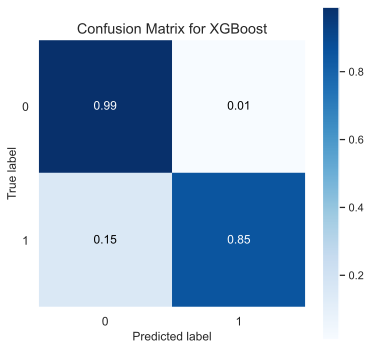

In [101]:
plot_confusion_matrix(y_test, clf_Boosting_XGBoost_default_pred, normalize=True, title = 'Confusion Matrix for XGBoost', figsize=(6,6))

Найкращій accuracy score в моделях з підібраними гіперпараметрами виявився CatBoost score: 0.98. Побудуємо Confusion Matrix.

<Axes: title={'center': 'Confusion Matrix for CatBoost'}, xlabel='Predicted label', ylabel='True label'>

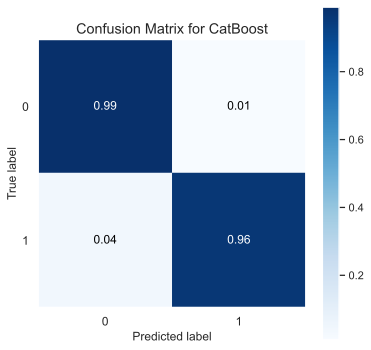

In [102]:
plot_confusion_matrix(y_test, clf_Boosting_CatBoost_BP_pred, normalize=True, title = 'Confusion Matrix for CatBoost', figsize=(6,6))

Загалом всі ансамблі добре справились з задачею класифікації і моють високі результати.

### Дякую за увагу =)